
<div style="text-align: center;">
        <h1>ABCDEats Inc. - Data Mining Project</h1>
        <h3>Fall Semester 2024-2025</h3>
        <h2>Group 47 Members:</h2>
        <ul style="list-style-type:none; padding: 0;">
            <li>Chiel Groeneveld, 20240662 </li>
            <li>Daan van Holten, 20240681 </li>
            <li>Diogo Ruivo, 20240584 </li>
            <li>Zofia Wójcik, 20240654 </li>
        </ul>
    </div>
</div>


**Table of Contents** <br>
* [1.Project objectives](#projectobjectives)
    * [1.1 Part 1](#part1)
    * [1.2 Dataset](#dataset)
* [2.Import Libraries](#importlibraries)

* [3.Import Dataset](#importdataset)
* [4.Initial Pre-Processing](#initialpreprocessing)
    * [4.1 Duplicated Rows](#duplicatedrows)
    * [4.2 Filling Empty Cells](#fillemptycells)
    * [4.3 Redefining Variables](#redefiningvariables)
* [5.Exploratory Data Analysis](#eda)
    * [5.1 Data Categorization](#datacategorization)
    * [5.2 Feature Analysis](#individualanal)
    * [5.3 New Feature Creation](#newfeature)
    * [5.4 Visualizations](#newfeatureanal) #new/more feature analysis ?
* [6.Pre-Processing](#preprocessing)
    * [6.1 Outliers](#outliers)
    * [6.2 Bucketing](#bucketing)
    * [6.3 Encoding](#encoding)
    * [6.4 Scaling](#scaling)
* [7.Save Clean Data](#save)

<hr>
<a class="anchor" id="projectobjectives">
    
# 1. Project objectives
    
</a>

In this project, you will act as consultants for ABCDEats Inc. (ABCDE), a fictional food delivery service partnering with a range of restaurants to offer diverse meal options. Your task is to analyse customer data collected over three months from three cities to help ABCDE develop a data-driven strategy tailored to various customer segments. <br>

We recommend segmenting customers using multiple perspectives. Examples of segmentation perspectives include value-based segmentation, which groups customers by their economic value; preference or behaviour-based segmentation which focuses on purchasing habits; and demographic segmentation which categorises customers by attributes like age, gender, and income to understand different interaction patterns. <br>

Ultimately, the company seeks a final segmentation that integrates these perspectives to enable them to develop a comprehensive marketing strategy.

<hr>
<a class="anchor" id="part1">
    
## 1.1 Part 1
    
</a>

Part 1: Exploratory Data Analysis <br>

**Expected Outcomes**
- Conduct an in-depth exploration of the dataset.
Summarise key statistics for the data, and discuss
their possible implications.
- Identify any trends, patterns, or anomalies within
the dataset. Explore relationships between features.
- Create new features that may help enhance your
analysis.
- Use visualisations to effectively communicate
your findings.

<hr>
<a class="anchor" id="dataset">
    
## 1.2 Dataset
    
</a>

The dataset provided for this project includes customer data from ABCDEats Inc. and consists of multiple columns capturing various customer attributes and aggregating their behaviour over a three-month period. <br>
Each row corresponds to one customer, and the column descriptions are given below:

# Dataset Description

| Column Number | Column Name         | Description                                                                                          |
|---------------|---------------------|------------------------------------------------------------------------------------------------------|
| 1             | customer_id         | Unique identifier for each customer.                                                                 |
| 2             | customer_region     | Geographic region where the customer is located.                                                     |
| 3             | customer_age        | Age of the customer.                                                                                 |
| 4             | vendor_count        | Number of unique vendors the customer has ordered from.                                              |
| 5             | product_count       | Total number of products the customer has ordered.                                                   |
| 6             | is_chain            | Indicates whether the customer’s order was from a chain restaurant.                                  |
| 7             | first_order         | Number of days from the start of the dataset when the customer first placed an order.                |
| 8             | last_order          | Number of days from the start of the dataset when the customer most recently placed an order.        |
| 9             | last_promo          | The category of the promotion or discount most recently used by the customer.                        |
| 10            | payment_method      | Method most recently used by the customer to pay for their orders.                                   |
| 11            | CUI_American, CUI_Asian, CUI_Chinese, CUI_Italian, etc. | The amount in monetary units spent by the customer from the indicated type of cuisine.          |
| 12            | DOW_0 to DOW_6      | Number of orders placed on each day of the week (0 = Sunday, 6 = Saturday).                          |
| 13            | HR_0 to HR_23       | Number of orders placed during each hour of the day (0 = midnight, 23 = 11 PM).                      |


<hr>
<a class="anchor" id="importlibraries">
    
# 2. Import libraries
    
</a>

In [1513]:
import sqlite3
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.impute import KNNImputer

from scipy.stats import skewnorm

#scaler
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder   


import math
from math import ceil

import missingno as msno
import warnings
warnings.filterwarnings('ignore')

from os.path import join
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.cm as cm
from sklearn.metrics import silhouette_score, silhouette_samples
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering

from os.path import join
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram

import matplotlib.pyplot as plt
from sklearn.decomposition import PCA


sns.set()

%config InlineBackend.figure_format = 'retina'

sns.set()

<hr>
<a class="anchor" id="importdataset">
    
# 3. Import Dataset
    
</a>

In [1514]:
df = pd.read_csv('DM2425_ABCDEats_DATASET.csv')

<hr>
<a class="anchor" id="initialpreprocessing">
    
# 4. Initial Pre-Processing
    
</a>

In [1515]:
df.head(30)

,customer_id,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23
0,1b8f824d5e,2360,18.0,2,5,1,0.0,1,DELIVERY,DIGI,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,28.88,0.0,0.00,0.0,0.00,0.00,0.0,1,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0
1,5d272b9dcb,8670,17.0,2,2,2,0.0,1,DISCOUNT,DIGI,12.82,6.39,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.00,0.0,0.00,0.00,0.0,1,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0
2,f6d1b2ba63,4660,38.0,1,2,2,0.0,1,DISCOUNT,CASH,9.20,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.00,0.0,0.00,0.00,0.0,1,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0
3,180c632ed8,4660,NaN,2,3,1,0.0,2,DELIVERY,DIGI,0.00,13.70,0.00,0.00,0.00,0.00,0.0,0.00,17.86,0.0,0.00,0.0,0.00,0.00,0.0,0,1,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0
4,4eb37a6705,4660,20.0,2,5,0,0.0,2,-,DIGI,14.57,40.87,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.00,0.0,0.00,0.00,0.0,0,1,0,0,0,0,1,0.0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,6aef2b6726,8670,40.0,2,2,0,0.0,2,FREEBIE,DIGI,0.00,24.92,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.00,0.0,0.00,0.00,0.0,0,1,0,0,0,0,1,0.0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,8475ee66ef,2440,24.0,2,2,2,0.0,2,-,CARD,5.88,0.00,1.53,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.00,0.0,0.00,0.00,0.0,0,1,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0
7,f2f53bcc67,8670,27.0,2,3,2,0.0,2,DISCOUNT,DIGI,11.71,0.00,24.40,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.00,0.0,0.00,0.00,0.0,0,1,0,0,0,0,1,0.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
8,5b650c89cc,2360,20.0,3,4,2,0.0,3,DISCOUNT,DIGI,2.75,0.00,0.00,0.00,0.00,0.00,0.0,4.39,0.00,0.0,0.00,0.0,7.30,0.00,0.0,0,0,1,0,0,0,2,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1
9,84775a7237,8670,20.0,2,3,0,0.0,3,DELIVERY,CARD,0.00,32.48,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.00,0.0,0.00,0.00,0.0,0,0,1,0,0,0,1,0.0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [1516]:
df.shape

(31888, 56)

In [1517]:
df.columns

Index(['customer_id', 'customer_region', 'customer_age', 'vendor_count',
       'product_count', 'is_chain', 'first_order', 'last_order', 'last_promo',
       'payment_method', 'CUI_American', 'CUI_Asian', 'CUI_Beverages',
       'CUI_Cafe', 'CUI_Chicken Dishes', 'CUI_Chinese', 'CUI_Desserts',
       'CUI_Healthy', 'CUI_Indian', 'CUI_Italian', 'CUI_Japanese',
       'CUI_Noodle Dishes', 'CUI_OTHER', 'CUI_Street Food / Snacks',
       'CUI_Thai', 'DOW_0', 'DOW_1', 'DOW_2', 'DOW_3', 'DOW_4', 'DOW_5',
       'DOW_6', 'HR_0', 'HR_1', 'HR_2', 'HR_3', 'HR_4', 'HR_5', 'HR_6', 'HR_7',
       'HR_8', 'HR_9', 'HR_10', 'HR_11', 'HR_12', 'HR_13', 'HR_14', 'HR_15',
       'HR_16', 'HR_17', 'HR_18', 'HR_19', 'HR_20', 'HR_21', 'HR_22', 'HR_23'],
      dtype='object')

In [1518]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31888 entries, 0 to 31887
Data columns (total 56 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   customer_id               31888 non-null  object 
 1   customer_region           31888 non-null  object 
 2   customer_age              31161 non-null  float64
 3   vendor_count              31888 non-null  int64  
 4   product_count             31888 non-null  int64  
 5   is_chain                  31888 non-null  int64  
 6   first_order               31782 non-null  float64
 7   last_order                31888 non-null  int64  
 8   last_promo                31888 non-null  object 
 9   payment_method            31888 non-null  object 
 10  CUI_American              31888 non-null  float64
 11  CUI_Asian                 31888 non-null  float64
 12  CUI_Beverages             31888 non-null  float64
 13  CUI_Cafe                  31888 non-null  float64
 14  CUI_Ch

In [1519]:
df.dtypes

customer_id                  object
customer_region              object
customer_age                float64
vendor_count                  int64
product_count                 int64
is_chain                      int64
first_order                 float64
last_order                    int64
last_promo                   object
payment_method               object
CUI_American                float64
CUI_Asian                   float64
CUI_Beverages               float64
CUI_Cafe                    float64
CUI_Chicken Dishes          float64
CUI_Chinese                 float64
CUI_Desserts                float64
CUI_Healthy                 float64
CUI_Indian                  float64
CUI_Italian                 float64
CUI_Japanese                float64
CUI_Noodle Dishes           float64
CUI_OTHER                   float64
CUI_Street Food / Snacks    float64
CUI_Thai                    float64
DOW_0                         int64
DOW_1                         int64
DOW_2                       

In [1520]:
df.dtypes.unique()

array([dtype('O'), dtype('float64'), dtype('int64')], dtype=object)

In [1521]:
df.describe(include = 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
customer_id,31888,31875,742ca068fc,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
customer_region,31888,9,8670,9761,NaN,NaN,NaN,NaN,NaN,NaN,NaN
customer_age,31161.0,NaN,NaN,NaN,27.506499,7.160898,15.0,23.0,26.0,31.0,80.0
vendor_count,31888.0,NaN,NaN,NaN,3.102609,2.771587,0.0,1.0,2.0,4.0,41.0
product_count,31888.0,NaN,NaN,NaN,5.668245,6.957287,0.0,2.0,3.0,7.0,269.0
is_chain,31888.0,NaN,NaN,NaN,2.818866,3.977529,0.0,1.0,2.0,3.0,83.0
first_order,31782.0,NaN,NaN,NaN,28.478604,24.109086,0.0,7.0,22.0,45.0,90.0
last_order,31888.0,NaN,NaN,NaN,63.675521,23.226123,0.0,49.0,70.0,83.0,90.0
last_promo,31888,4,-,16748,NaN,NaN,NaN,NaN,NaN,NaN,NaN
payment_method,31888,3,CARD,20161,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [1522]:
df.isna().sum()

customer_id                    0
customer_region                0
customer_age                 727
vendor_count                   0
product_count                  0
is_chain                       0
first_order                  106
last_order                     0
last_promo                     0
payment_method                 0
CUI_American                   0
CUI_Asian                      0
CUI_Beverages                  0
CUI_Cafe                       0
CUI_Chicken Dishes             0
CUI_Chinese                    0
CUI_Desserts                   0
CUI_Healthy                    0
CUI_Indian                     0
CUI_Italian                    0
CUI_Japanese                   0
CUI_Noodle Dishes              0
CUI_OTHER                      0
CUI_Street Food / Snacks       0
CUI_Thai                       0
DOW_0                          0
DOW_1                          0
DOW_2                          0
DOW_3                          0
DOW_4                          0
DOW_5     

<hr>
<a class="anchor" id="duplicatedrows">
    
## 4.1 Duplicated Rows
    
</a>

In [1523]:
#costumer id should be a unique feature, as freq = 2, we know there are duplicates
duplicates_customer_id = df['customer_id'].groupby(df['customer_id']).size()[df['customer_id'].groupby(df['customer_id']).size() > 1]
duplicates_customer_id.count()

13

In [1524]:
#check if only customer id is dulpicated, or the whole row
df.duplicated().sum() #not only the customer id, the whole row is duplicated, we should eliminate them

13

In [1525]:
df.drop_duplicates(inplace = True)

In [1526]:
df.duplicated().sum() #check

0

In [1527]:
#after removing duplicate customer id's, we can drop the customer_id column and assume the index (1,2,3...) as their new id
df = df.iloc[0:, 1:56]

<hr>
<a class="anchor" id="fillemptycells">
    
## 4.2 Filling Empty Cells
    
</a>

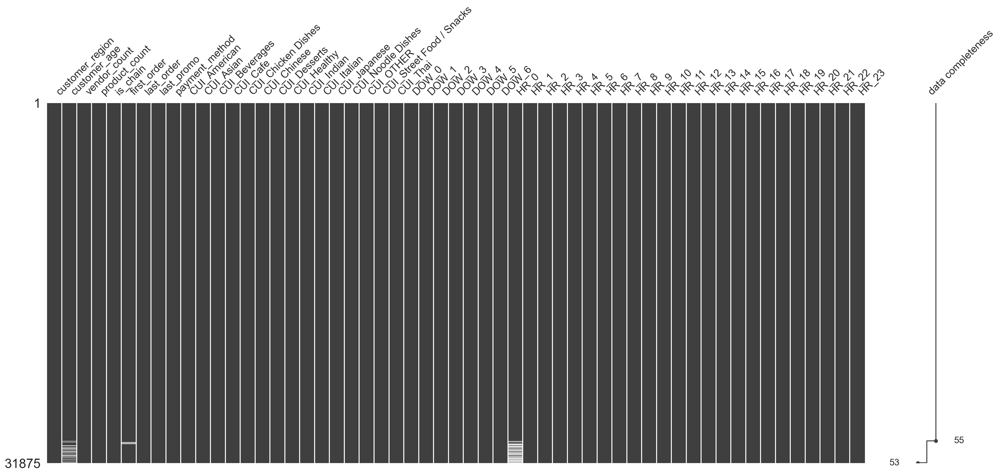

In [1528]:
# Visualize the missing values in the dataset
msno.matrix(df, labels=True, sort="descending");

In [1529]:
# Check the missing values in rows instead of columns
df.isnull().sum(axis=1).value_counts().sort_index(ascending=False)

2       30
1     1937
0    29908
Name: count, dtype: int64

In [1530]:
#there are 3 columns with NaN values, we will treat all of them as it is necessary for data visualization
df.isna().sum()

customer_region                0
customer_age                 727
vendor_count                   0
product_count                  0
is_chain                       0
first_order                  106
last_order                     0
last_promo                     0
payment_method                 0
CUI_American                   0
CUI_Asian                      0
CUI_Beverages                  0
CUI_Cafe                       0
CUI_Chicken Dishes             0
CUI_Chinese                    0
CUI_Desserts                   0
CUI_Healthy                    0
CUI_Indian                     0
CUI_Italian                    0
CUI_Japanese                   0
CUI_Noodle Dishes              0
CUI_OTHER                      0
CUI_Street Food / Snacks       0
CUI_Thai                       0
DOW_0                          0
DOW_1                          0
DOW_2                          0
DOW_3                          0
DOW_4                          0
DOW_5                          0
DOW_6     

#### customer_Age

In [1531]:
# Copy the data
df = df.copy(deep=True)                                  # deep=True to avoid the SettingWithCopyWarning

# Init the transformer
knn_imp = KNNImputer()                                               # k=5 is the default

# Fit/transform
df["customer_age"] = knn_imp.fit_transform(df[["customer_age"]])

# Check if KNN Imputer worked correctly
df.customer_age.describe()

## Time of Execution KNNImputer: 1.8s

count    31875.000000
mean        27.507545
std          7.079682
min         15.000000
25%         23.000000
50%         26.000000
75%         31.000000
max         80.000000
Name: customer_age, dtype: float64

In [1532]:
df.columns[df.isnull().sum()>0]


Index(['first_order', 'HR_0'], dtype='object')

#### first_order

In [1533]:
# we suspect that NaNs for first_order just did their first_order today
print(df[df['first_order'].isna()]['last_order'].value_counts()) # as we can see all last_order is set to 0
print(df[df['first_order'].isna()]
      [['DOW_0','DOW_1','DOW_2','DOW_3','DOW_4','DOW_5','DOW_6']].value_counts())
# we can even see that the dataset was concluded on a sunday
# given this information, we will set these NaNs as the day next to the max value in the 'first_order' values

last_order
0    106
Name: count, dtype: int64
DOW_0  DOW_1  DOW_2  DOW_3  DOW_4  DOW_5  DOW_6
0      0      0      0      0      0      1        104
                                          2          2
Name: count, dtype: int64


In [1534]:
# given this information, we will set these NaNs as the day next to the max value in the 'first_order' values
df['first_order'].max()

90.0

In [1535]:
df['first_order'].fillna(91, inplace=True)

#### HR_0

In [1536]:
# for HR_0
Total_Orders_Week = df.iloc[:, 24:31].sum(axis=1) #sum all DOW columns
Total_Orders_Hour = df.iloc[:, 32:].sum(axis=1) #sum all HR columns, dont count HR_0 as it is full of zeros
df['HR_0'] = Total_Orders_Week - Total_Orders_Hour

In [1537]:
df.isna().sum()

customer_region             0
customer_age                0
vendor_count                0
product_count               0
is_chain                    0
first_order                 0
last_order                  0
last_promo                  0
payment_method              0
CUI_American                0
CUI_Asian                   0
CUI_Beverages               0
CUI_Cafe                    0
CUI_Chicken Dishes          0
CUI_Chinese                 0
CUI_Desserts                0
CUI_Healthy                 0
CUI_Indian                  0
CUI_Italian                 0
CUI_Japanese                0
CUI_Noodle Dishes           0
CUI_OTHER                   0
CUI_Street Food / Snacks    0
CUI_Thai                    0
DOW_0                       0
DOW_1                       0
DOW_2                       0
DOW_3                       0
DOW_4                       0
DOW_5                       0
DOW_6                       0
HR_0                        0
HR_1                        0
HR_2      

In [1538]:
hourly_counts = {}

for hour in range(24):
    column_name = f'HR_{hour}'
    if column_name in df.columns:
        hourly_counts[column_name] = df[column_name].value_counts()

# Combine all hourly counts into a single DataFrame
combined_counts = pd.DataFrame(hourly_counts).fillna(0).astype(int)

# Calculate total counts for each hour
total_counts = combined_counts.sum()

# Add total counts as the first row
combined_counts = pd.concat([pd.DataFrame(total_counts, columns=['Total']).T, combined_counts])

# Sort the remaining rows (excluding the 'Total' row) in descending order
combined_counts.iloc[1:] = combined_counts.iloc[1:].sort_values(
    by=combined_counts.columns.tolist(), ascending=False
)

# Display the combined counts
print(combined_counts)

#check if values are in line with surrounding areas - they are
print(combined_counts.describe().transpose())

        HR_0   HR_1   HR_2   HR_3   HR_4   HR_5   HR_6   HR_7   HR_8   HR_9  \
Total  31875  31875  31875  31875  31875  31875  31875  31875  31875  31875   
0      30711  30592  30385  29354  29507  29849  30125  29982  28923  26952   
1        934   1016   1173   1783   1822   1615   1419   1541   2293   3557   
2        159    181    219    464    376    303    244    262    439    829   
3         39     46     60    163    101     63     59     54    114    280   
4         15     24     14     53     32     28     15     18     44    122   
5          8      7      8     26     18     15      7      5     27     59   
6          2      4      5     16      7      0      3      3     10     26   
7          2      1      1      1      1      0      0      1      2     13   
8          1      2      3      8      5      2      2      2     11     15   
9          1      1      4      2      3      0      1      3      2      8   
10         1      0      2      0      0      0     

In [1539]:
# Check the missing values in rows again
df.isnull().sum(axis=1).value_counts().sort_index(ascending=False)

0    31875
Name: count, dtype: int64

In [1540]:
# We identified rows with 0s in vendor_count and product_count
zero_vendor = (df['vendor_count'] == 0).sum()
zero_product = (df['product_count'] == 0).sum()
print(f'Number of clients with 0 vendor_count: {zero_vendor}\nNumber of clients with 0 product_count: {zero_product}')

Number of clients with 0 vendor_count: 138
Number of clients with 0 product_count: 156


In [1541]:
# Investigate the rows where 'product_count' has a value of 0
no_product = df.index[df['product_count'] == 0].tolist()
df.loc[no_product]
# There are rows where product_count == 0 even though the order has been placed 

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23
1449,8670,22.0,0,0,1,1.0,1,DELIVERY,DIGI,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.00,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1476,8670,26.0,0,0,0,1.0,1,DELIVERY,CASH,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.00,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1488,8670,21.0,0,0,1,1.0,1,DELIVERY,DIGI,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.00,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2486,8670,38.0,0,0,0,2.0,2,DELIVERY,CASH,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.00,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3391,8670,24.0,0,0,0,3.0,3,-,CASH,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.00,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3405,8670,25.0,0,0,0,3.0,3,DELIVERY,CARD,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.00,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6180,4660,27.0,1,0,0,6.0,6,DISCOUNT,CARD,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,2.56,0.0,0.0,0.00,0.0,0.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
6183,4660,43.0,1,0,0,6.0,6,-,CARD,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,6.74,0.0,0.0,0.00,0.0,0.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
6201,8670,32.0,0,0,0,6.0,6,-,DIGI,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.00,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7123,8670,29.0,0,0,1,7.0,7,DELIVERY,CARD,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.00,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [1542]:
# We decided to delete these rows because having clients with no orders in the data set doesnt make sense
indexes = df.index[df['vendor_count'] == 0].tolist()
df = df.drop(index=indexes)
(df['vendor_count'] == 0).sum()

0

In [1543]:
# For the missing product_count values we make an assumption that it is error in the data set 
# If the vendor_count is different than 0, we will change the product_count to 1
df['product_count'] = df.apply(lambda row: 1 if row['product_count'] == 0 and row['vendor_count'] != 0 else row['product_count'], axis=1)

#Check if it worked
(df['product_count'] == 0).sum()

0

<hr>
<a class="anchor" id="redefiningvariables">
    
## 4.3 Redefining Variables
    
</a>

**Redefining DataTypes**

In [1544]:
#age, first_order and HR_0 should be integers, the rest seems correct
df['customer_age'] = df['customer_age'].astype('int64')
df['first_order'] =df['first_order'].astype('int64')
df['HR_0'] =df['HR_0'].astype('int64')
df.dtypes

customer_region              object
customer_age                  int64
vendor_count                  int64
product_count                 int64
is_chain                      int64
first_order                   int64
last_order                    int64
last_promo                   object
payment_method               object
CUI_American                float64
CUI_Asian                   float64
CUI_Beverages               float64
CUI_Cafe                    float64
CUI_Chicken Dishes          float64
CUI_Chinese                 float64
CUI_Desserts                float64
CUI_Healthy                 float64
CUI_Indian                  float64
CUI_Italian                 float64
CUI_Japanese                float64
CUI_Noodle Dishes           float64
CUI_OTHER                   float64
CUI_Street Food / Snacks    float64
CUI_Thai                    float64
DOW_0                         int64
DOW_1                         int64
DOW_2                         int64
DOW_3                       

**Redefining Names**

In [1545]:
df.rename(columns={'CUI_Chicken Dishes': 'CUI_Chicken_Dishes'}, inplace=True)
df.rename(columns={'CUI_Noodle Dishes': 'CUI_Noodle_Dishes'}, inplace=True)
df.rename(columns={'CUI_Street Food / Snacks': 'CUI_Street_Food/Snacks'}, inplace=True)

**Redefining Variables**

##### last_order

In [1546]:
df['last_order'].unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8, 10, 11, 12, 13, 14, 16, 17, 18, 19,
       20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36,
       37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53,
       54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70,
       71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87,
       88, 89, 90,  9, 15,  0])

In [1547]:
# there should not be 0 in last_order, it is due to the same reason for the missing values on first_order
print(df[df['last_order']  == 0]['first_order'].value_counts()) # the zeros appear on the day of the dataset snapshot

first_order
91    106
Name: count, dtype: int64


In [1548]:
# we should just add 1 to the max of last_order for the rows that appear zero
df_last_order = df[['last_order']]
df_last_order[df_last_order == 0] = 91
df['last_order'] = df_last_order['last_order']
df.tail(10)

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken_Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle_Dishes,CUI_OTHER,CUI_Street_Food/Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23
31878,8670,23,1,1,1,91,91,DELIVERY,CARD,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.0,0.0,0.00,6.29,0.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
31879,8670,24,1,1,0,91,91,DELIVERY,CARD,0.00,19.06,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.0,0.0,0.00,0.00,0.0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
31880,4660,23,1,1,0,91,91,-,CARD,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.0,0.0,13.53,0.00,0.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
31881,8670,32,1,1,1,91,91,FREEBIE,CASH,0.00,0.00,19.72,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.0,0.0,0.00,0.00,0.0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
31882,8670,21,1,1,1,91,91,DELIVERY,DIGI,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.0,0.0,0.00,5.89,0.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
31883,8670,30,1,1,1,91,91,FREEBIE,DIGI,0.00,0.00,18.04,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.0,0.0,0.00,0.00,0.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
31884,8670,27,1,1,0,91,91,DELIVERY,DIGI,18.04,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.0,0.0,0.00,0.00,0.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
31885,8670,24,1,1,1,91,91,-,DIGI,0.00,0.00,0.00,0.0,0.0,0.0,17.79,0.0,0.0,0.00,0.0,0.0,0.00,0.00,0.0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
31886,8670,34,1,1,0,91,91,DISCOUNT,DIGI,0.00,12.03,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.0,0.0,0.00,0.00,0.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
31887,4660,30,1,1,0,91,91,-,CASH,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.0,7.91,0.0,0.0,0.00,0.00,0.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0


<hr>
<a class="anchor" id="eda">
    
# 5.Exploratory Data Analysis
    
</a>

<hr>
<a class="anchor" id="datacategorization">
    
## 5.1 Data Categorization
    
</a>

***Days of The Week***

In [1549]:
days_of_week = df[['DOW_0', 'DOW_1','DOW_2','DOW_3','DOW_4','DOW_5','DOW_6']]

***Hours of The Day***

In [1550]:
hours_of_day = df[['HR_0','HR_1','HR_2','HR_3','HR_4','HR_5','HR_6','HR_7','HR_8','HR_9','HR_10','HR_11','HR_12','HR_13','HR_14','HR_15',
                   'HR_16','HR_17','HR_18','HR_19','HR_20','HR_21','HR_22','HR_23']]

***Cuisines***

In [1551]:
cuisines = df[['CUI_Asian', 'CUI_American', 'CUI_Beverages', 'CUI_Cafe', 'CUI_Chicken_Dishes', 'CUI_Chinese', 'CUI_Desserts', 'CUI_Healthy', 'CUI_Indian'
               , 'CUI_Italian', 'CUI_Japanese', 'CUI_Noodle_Dishes', 'CUI_OTHER', 'CUI_Street_Food/Snacks', 'CUI_Thai']]

***Categorical Variables***

In [1552]:
cat_variables = df[['customer_region', 'last_promo', 'payment_method']]

***Metric Variables***

In [1553]:
#excluding hours and days
metric_variables = df[['customer_age', 'vendor_count', 'product_count', 'is_chain', 'first_order', 'last_order']]
#including hours and days
numeric_df = df.select_dtypes(include=['int64', 'float64'])

<hr>
<a class="anchor" id="datacategorization">
    
## 5.2 Feature Analysis
    
</a>

### Histograms

In [1554]:
# Function to create a histogram
def create_histogram(data, title, xlabel, ylabel, color='#3498DB', bins=50, edgecolor='black', range=range):
    plt.figure(figsize=(7, 5))
    plt.hist(data, bins=bins, color=color, range=range)
    plt.title(title, fontsize=14, fontweight='bold')
    plt.xlabel(xlabel, fontsize=12)
    plt.ylabel(ylabel, fontsize=12)
    plt.tight_layout()
    plt.show()

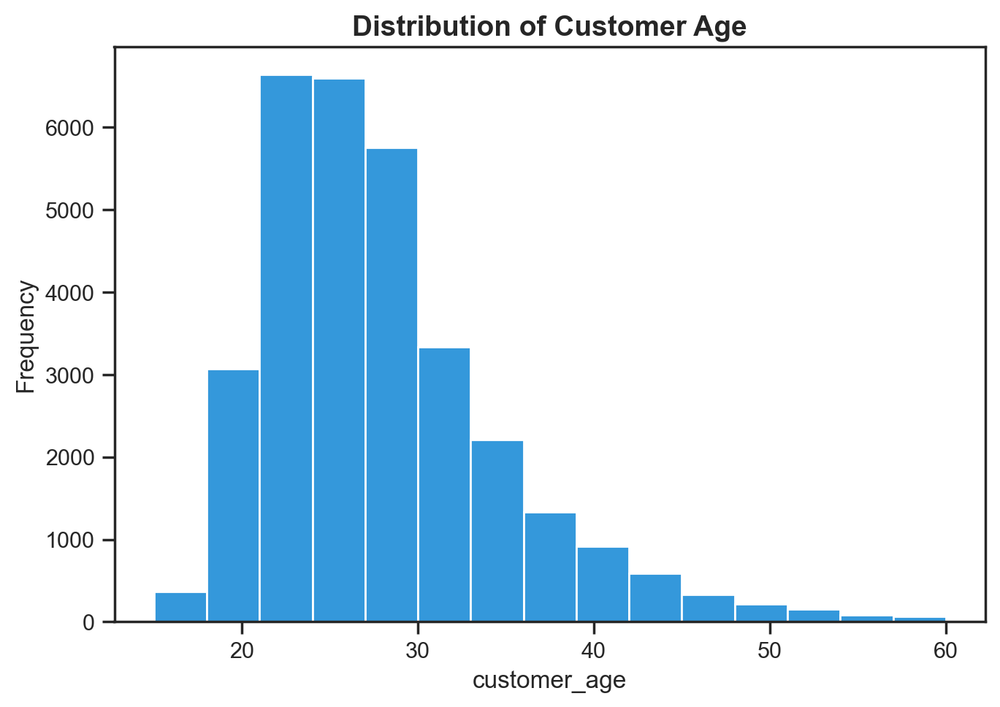

<Figure size 640x480 with 0 Axes>

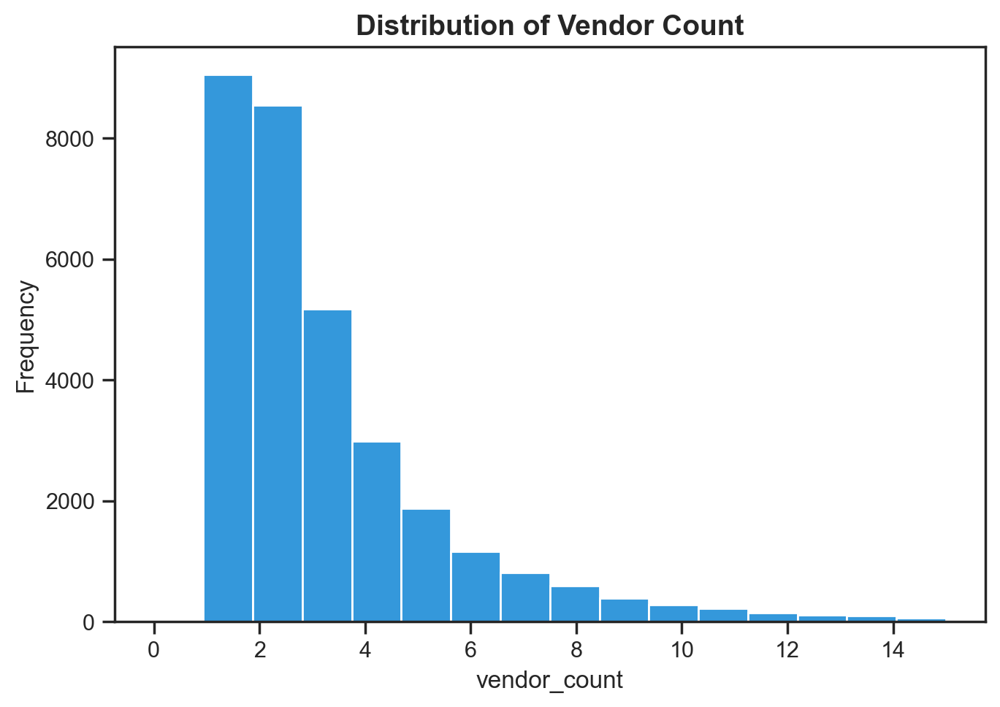

<Figure size 640x480 with 0 Axes>

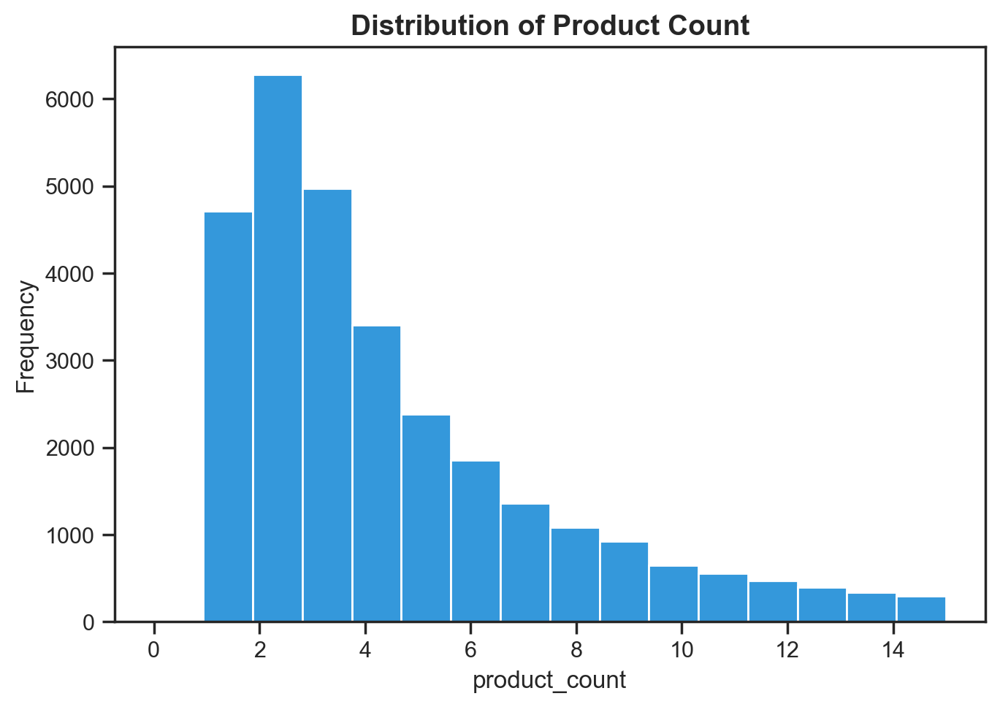

<Figure size 640x480 with 0 Axes>

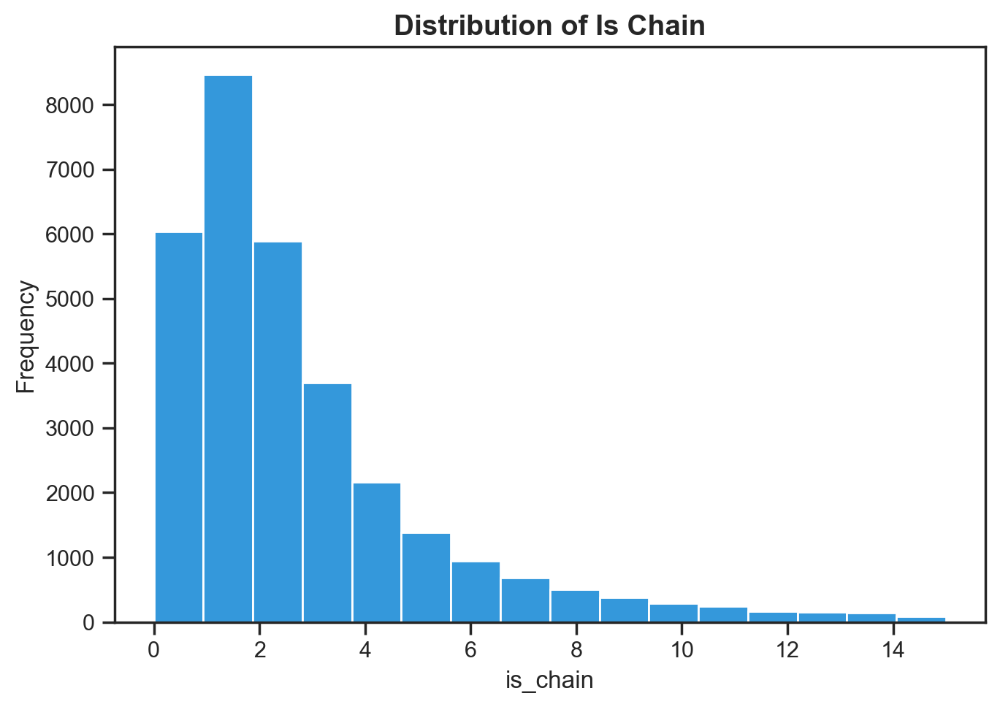

<Figure size 640x480 with 0 Axes>

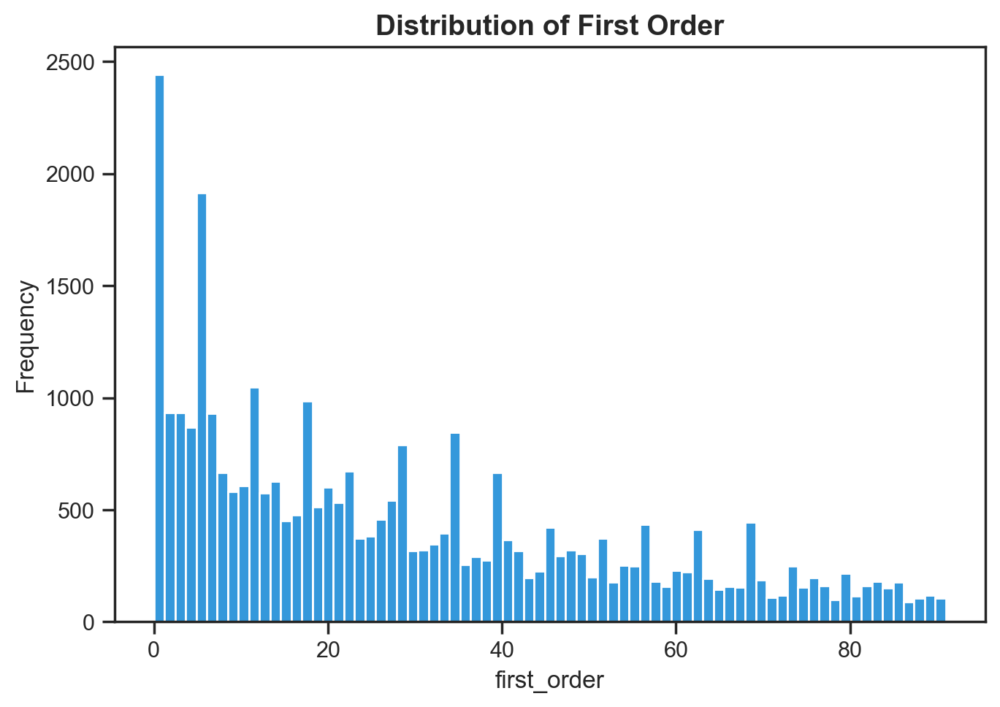

<Figure size 640x480 with 0 Axes>

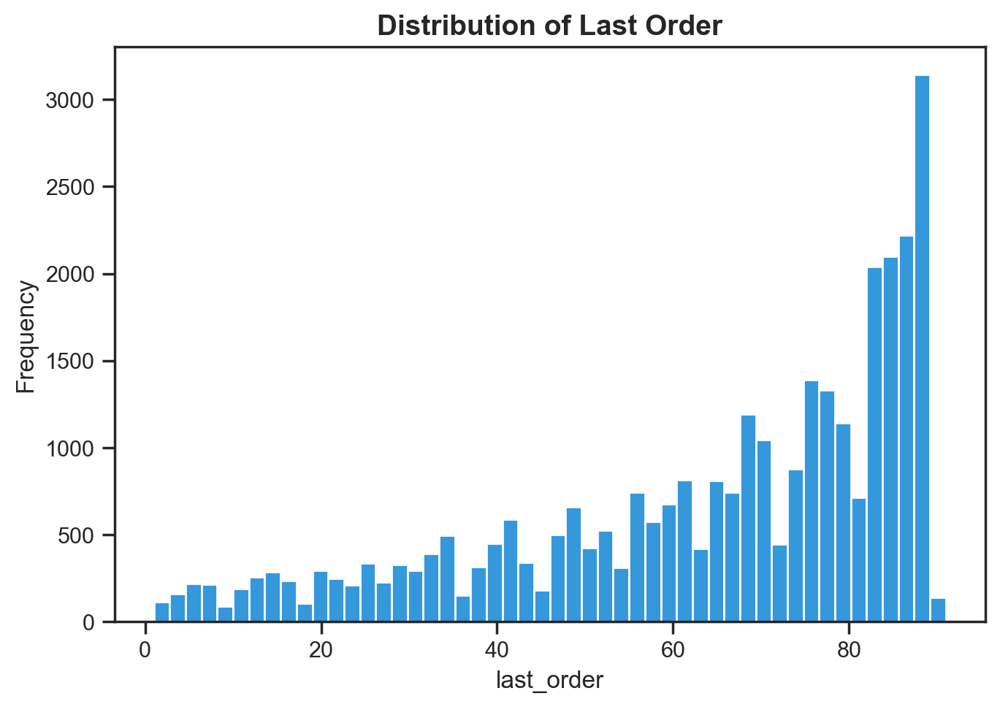

<Figure size 640x480 with 0 Axes>

In [1555]:
bin_config = dict([
    ('customer_age', 15),
    ('vendor_count', 16),
    ('product_count', 16),
    ('first_order', 75),
    ('last_order', 50),
    ('is_chain', 16),
])
range_config = dict([
    ('customer_age', (15, 60)),
    ('vendor_count', (0, 15)),
    ('product_count', (0, 15)),
    ('first_order', None),
    ('last_order', None),
    ('is_chain', (0, 15)),
])
sns.set_style('ticks')
for var in metric_variables:
    title = f'Distribution of {var.replace("_", " ").title()}'
    bins = bin_config.get(var,50)
    range_tuple = range_config.get(var, (df[var].min(), df[var].max()))
    create_histogram(df[var], title, var, 'Frequency', bins = bins, range=range_tuple)
    plt.savefig('f{.png')

In [1556]:
#function to plot time distributions, both hours and days of week
def plot_time_distribution(df, time_cols, title, color='#3498DB'):
    """
    Plot distribution for time-based columns with improved y-axis scaling.
    """
    counts = [df[col].sum() for col in time_cols]

    plt.figure(figsize=(12, 6))
    plt.bar(range(len(counts)), counts, color='#3498DB')
    plt.title(title,fontsize=14, fontweight='bold')

    if len(counts) == 24:  # Hours
        plt.xlabel('Hour of Day')
        plt.xticks(range(24))
        # Set y-axis limits to focus on the meaningful range
        min_count = min(counts) * 0.9
        max_count = max(counts) * 1.1
        plt.ylim(min_count, max_count)
    elif len(counts) == 7:  # Days
        plt.xlabel('Day of Week (0 = Monday, 6 = Sunday)')
        plt.xticks(range(7))
        # Set y-axis limits for days
        min_count = min(counts) * 0.95
        max_count = max(counts) * 1.05
        plt.ylim(min_count, max_count)

    plt.ylabel('Count')
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

In [1557]:
#function to plot cuisine types
def plot_cuisine_distribution(df, cuisine_columns, title='Distribution of Cuisine Types'):
    """
    Plot distribution of cuisine types with improved formatting.
    """
    cuisine_counts = [df[cuisine].sum() for cuisine in cuisine_columns]

    # Sort cuisines by count for better visualization
    sorted_indices = np.argsort(cuisine_counts)[::-1]
    sorted_counts = [cuisine_counts[i] for i in sorted_indices]
    sorted_cuisines = [cuisine_columns[i] for i in sorted_indices]

    plt.figure(figsize=(12, 6))
    bars = plt.bar(range(len(sorted_cuisines)), sorted_counts, color='#3498DB')
    plt.title(title,fontsize=14, fontweight='bold')
    plt.xlabel('Cuisine Type')
    plt.ylabel('Count')

    # Rotate labels and adjust their position
    plt.xticks(range(len(sorted_cuisines)),
               [cuisine.replace('CUI_', '').replace('_', ' ') for cuisine in sorted_cuisines],
               rotation=45,
               ha='right')

    # Add value labels on top of bars
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height,
                f'{int(height):,}',
                ha='center', va='bottom')

    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

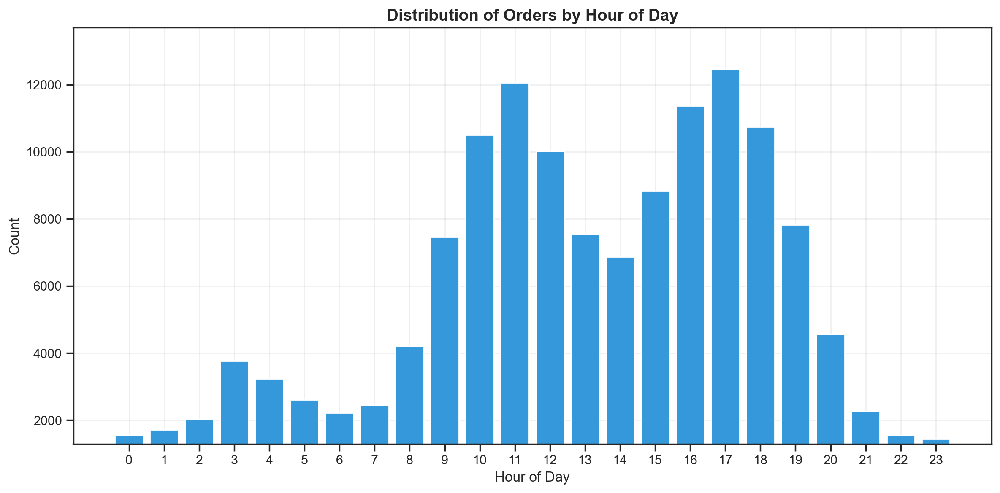

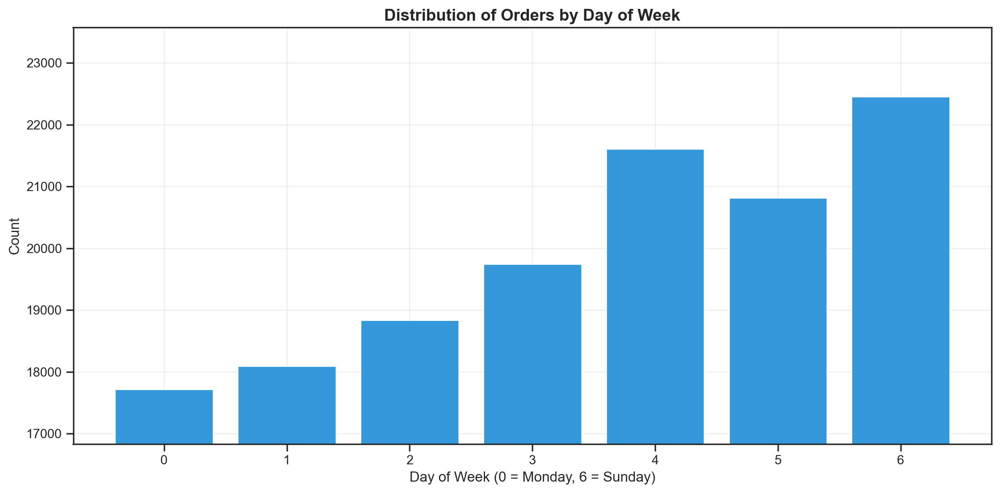

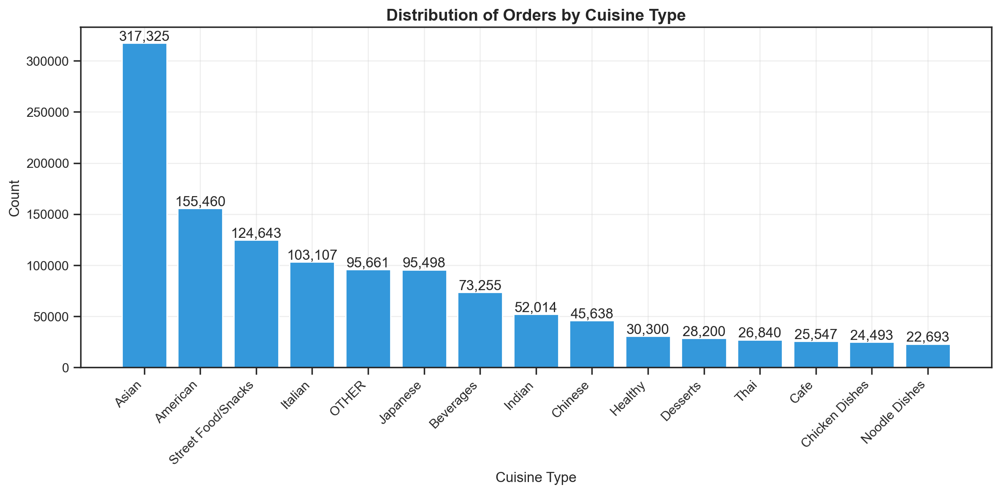

In [1558]:
def visualize_all_distributions(df):
    """
    Create all visualizations for the dataset with optimized scaling.
    """    # Time-based distributions
    hour_cols = [f'HR_{i}' for i in range(24)]
    if all(col in df.columns for col in hour_cols):
        plot_time_distribution(df, hour_cols, 'Distribution of Orders by Hour of Day', 'skyblue')

    day_cols = [f'DOW_{i}' for i in range(7)]
    if all(col in df.columns for col in day_cols):
        plot_time_distribution(df, day_cols, 'Distribution of Orders by Day of Week', 'skyblue')

    # Cuisine distribution
    cuisine_cols = [col for col in df.columns if col.startswith('CUI_')]
    if cuisine_cols:
        plot_cuisine_distribution(df, cuisine_cols,'Distribution of Orders by Cuisine Type')

visualize_all_distributions(df)

### BoxPlots

In [1559]:
# Calculate the number of rows and columns for the subplots
n_vars = len(numeric_df.columns)
n_rows = (n_vars + 3) // 4  # 4 plots per row, rounded up
n_cols = min(n_vars, 4)

# Create the subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(5*n_cols, 5*n_rows))
fig.suptitle('Boxplots of Numeric Variables', fontsize=16)

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Create a boxplot for each numeric variable
for i, column in enumerate(numeric_df.columns):
    sns.boxplot(x=numeric_df[column], ax=axes[i])
    axes[i].set_title(column, fontweight='bold')
    axes[i].set_xlabel('')

# Remove any unused subplots
for i in range(n_vars, len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()

### Pie Charts

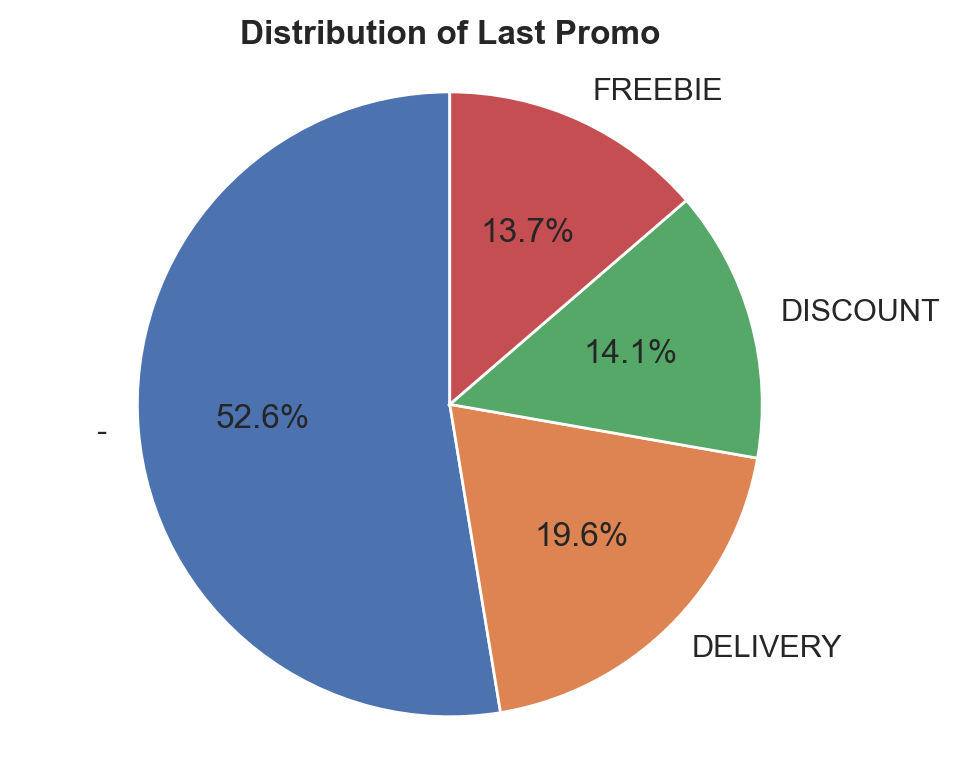

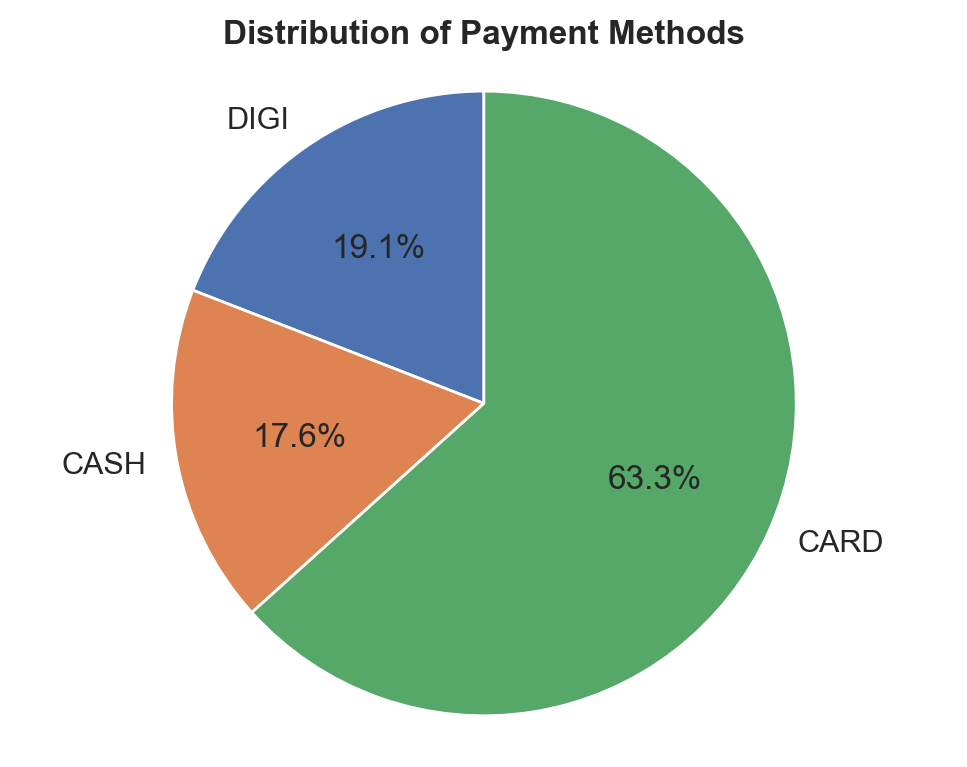

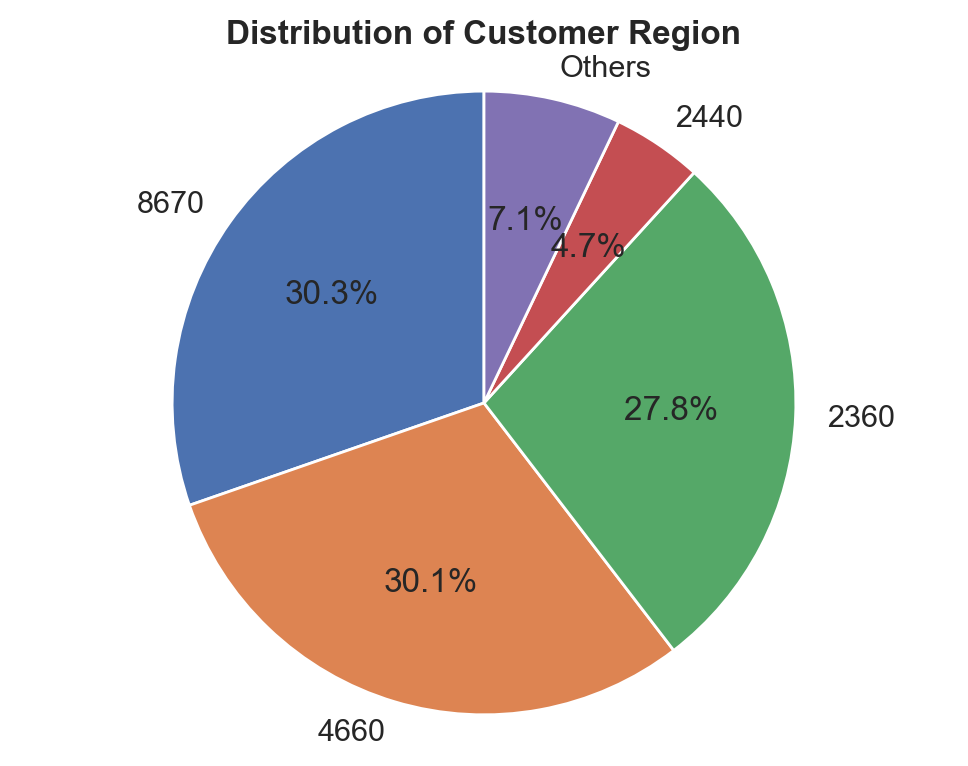

In [1560]:
# Pie chart for last_promo
last_promo_counts = df['last_promo'].value_counts()
plt.figure(figsize=(5, 4))
plt.pie(last_promo_counts.values, labels=last_promo_counts.index.astype(str), autopct='%1.1f%%', startangle=90)
plt.title('Distribution of Last Promo', fontweight='bold')
plt.axis('equal')
plt.tight_layout()
plt.show()

# Pie chart for payment method
payment_methods = ['DIGI', 'CASH', 'CARD']
payment_counts = [df[df['payment_method'] == method].shape[0] for method in payment_methods]

plt.figure(figsize=(5, 4))
plt.pie(payment_counts, labels=payment_methods, autopct='%1.1f%%', startangle=90)
plt.title('Distribution of Payment Methods', fontweight='bold')
plt.axis('equal')
plt.tight_layout()
plt.show()

#Pie chart for customer_region
customer_region_counts = df['customer_region'].value_counts()
threshold = 0.04
others_value = customer_region_counts[customer_region_counts / sum(customer_region_counts) < threshold].sum()
customer_region_counts = customer_region_counts[customer_region_counts / sum(customer_region_counts) >= threshold]
customer_region_counts.loc['Others'] = others_value
plt.figure(figsize=(5, 4))
plt.pie(customer_region_counts.values, labels=customer_region_counts.index.astype(str), autopct=lambda p : '{:.1f}%'.format(p) if p >= 4 else ''
        , startangle=90)
plt.title('Distribution of Customer Region', fontweight='bold')
plt.axis('equal')
plt.tight_layout()
plt.show()

### Correlation Matrix

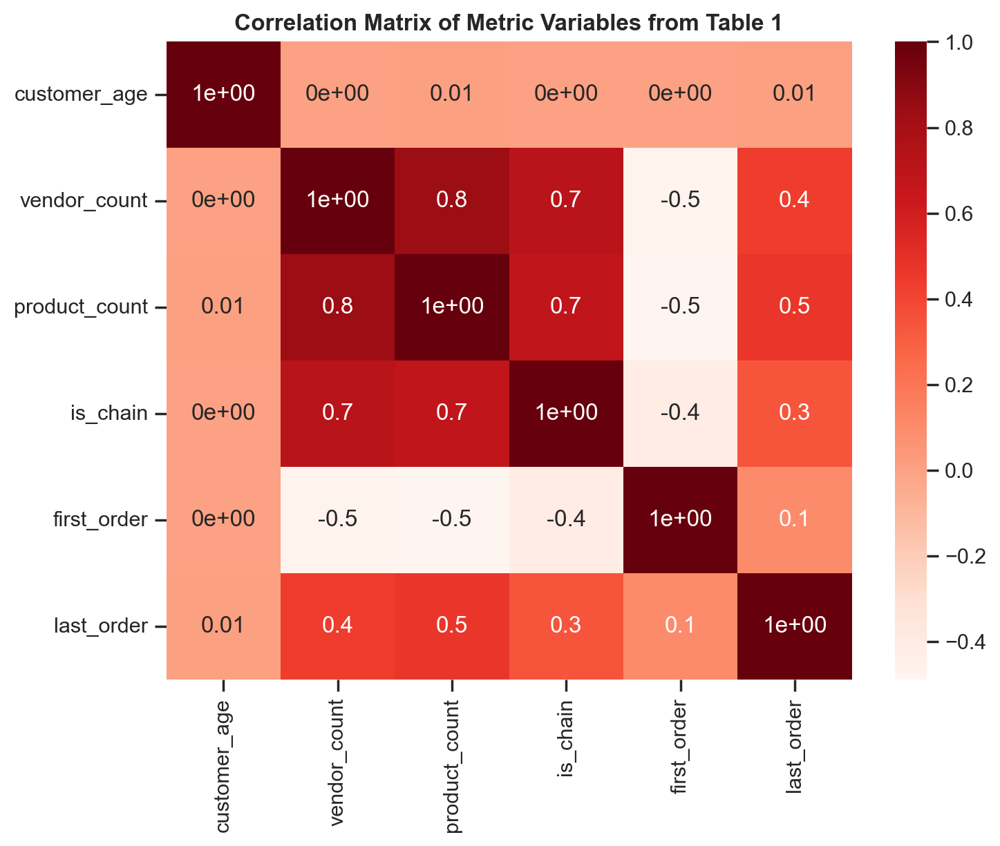

In [1561]:
corr_metric = metric_variables.corr(method = 'spearman').round(2)
plt.figure(figsize=(8,6))
plt.title('Correlation Matrix of Metric Variables from Table 1', fontsize = '12', fontweight='bold')
sns.heatmap(data = corr_metric, annot = True, cmap = plt.cm.Reds, fmt='.1')
plt.show()

### Violin Plots

In [1562]:
# Calculate the number of rows and columns for the subplots
n_vars = len(numeric_df.columns)
n_rows = (n_vars + 3) // 4  # 4 plots per row, rounded up
n_cols = min(n_vars, 4)

# Create the subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(5*n_cols, 5*n_rows))
fig.suptitle('Violin Plots of Numeric Variables', fontsize=16)

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Create a violin plot for each numeric variable
for i, column in enumerate(numeric_df.columns):
    sns.violinplot(y=numeric_df[column], ax=axes[i])
    axes[i].set_title(column, fontweight='bold')
    axes[i].set_xlabel('')

    # Rotate x-axis labels if they're too long
    axes[i].tick_params(axis='x', rotation=45)

# Remove any unused subplots
for i in range(n_vars, len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()

## Bivariate Analysis

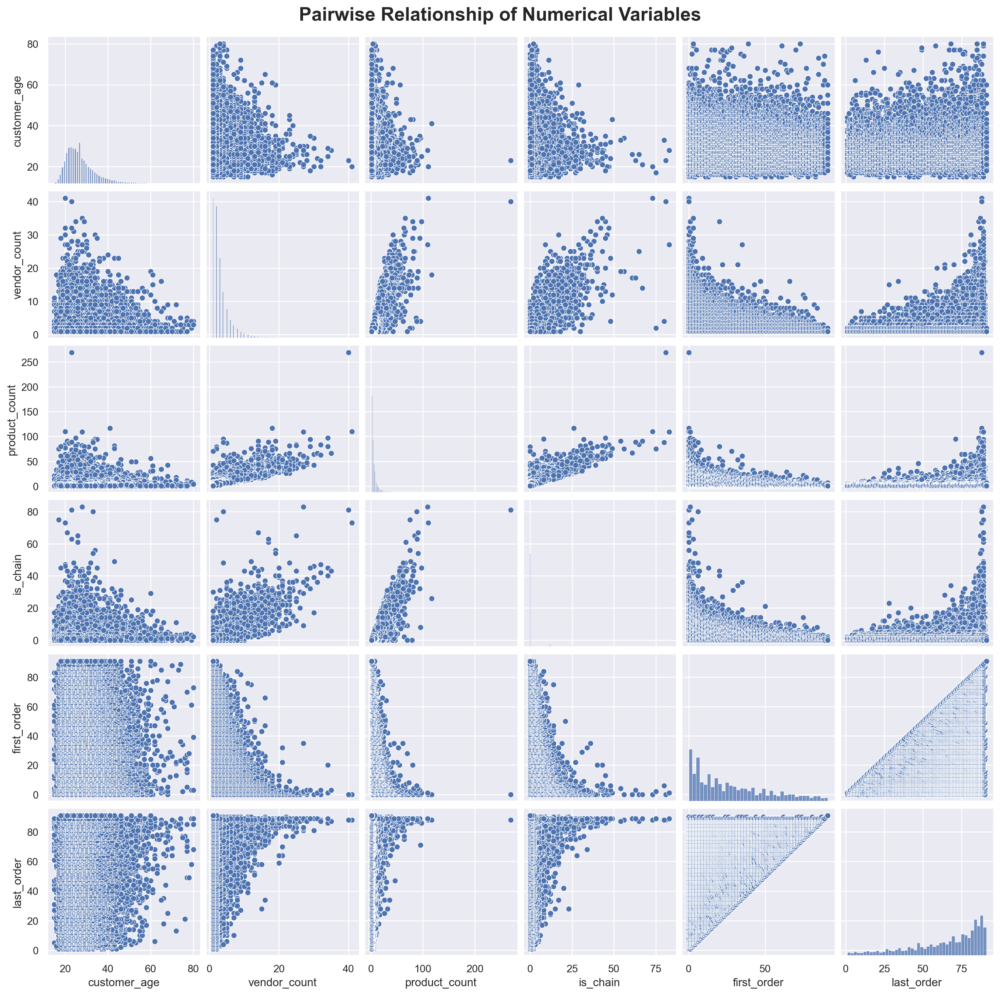

In [1563]:
# Pairwise Relationship of Numerical Variables
sns.set()

# Setting pairplot
sns.pairplot(metric_variables, diag_kind="hist")

# Layout
plt.subplots_adjust(top=0.95)
plt.suptitle("Pairwise Relationship of Numerical Variables", fontsize=20, fontweight='bold')

# if the eda directory is not present then create it first
if not os.path.exists(os.path.join('..', 'figures', 'eda')):
    os.makedirs(os.path.join('..', 'figures', 'eda'))

plt.savefig(os.path.join('..', 'figures', 'eda', 'pairwise_numeric_scatterplots.png'), dpi=200)
plt.show()

<hr>
<a class="anchor" id="newfeature">
    
## 5.3 New Feature Creation
    
</a>

#### Total Orders Per Client

In [1564]:
df['Total_Orders_Per_Client'] = Total_Orders_Week

#### Total Spent Per Client

In [1565]:
df['mnt'] = cuisines.sum(axis=1)

#### Amount Spent Per Order

In [1566]:
df['mnt_Per_Order'] = (df['mnt']/df['Total_Orders_Per_Client']).round(2)

#### Amount of Items Per Order

In [1567]:
df['Items_Per_Order'] = (df['product_count']/df['Total_Orders_Per_Client'])

#### Frequency

In [1568]:
df['last_order'].max()

91

In [1569]:
#i think we cannot calculate it like this
df['frq'] = (df['Total_Orders_Per_Client']/(df['last_order']-df['first_order']+1))

#### Recency

In [1570]:
#we use 91 as the day for today
today = 91
df['rcn'] = today - df['last_order']

#### Activity

In [1571]:
df['activity'] = df['last_order'] - df['first_order'] + 1

#### Cuisine Diversity Index

In [1572]:
df['CUI_diversity'] = cuisines.apply(lambda row: sum(row != 0), axis='columns')

#### Loyalty

In [1573]:
# we callculate loyalty score to understand clients preferences for vendors
df['Loyalty'] = (df['Total_Orders_Per_Client']-df['vendor_count'])/df['Total_Orders_Per_Client']

#### Time Periods

In [1574]:
    # Time periods (4 hours each)
    time_periods = {
        'Night': ['HR_0', 'HR_1', 'HR_2', 'HR_3'],         # 12-4am
        'Dawn': ['HR_4', 'HR_5', 'HR_6', 'HR_7'],          # 4-8am
        'Morning': ['HR_8', 'HR_9', 'HR_10', 'HR_11'],     # 8am-12pm
        'Afternoon': ['HR_12', 'HR_13', 'HR_14', 'HR_15'], # 12-4pm
        'Evening': ['HR_16', 'HR_17', 'HR_18', 'HR_19'],   # 4-8pm
        'Dusk': ['HR_20', 'HR_21', 'HR_22', 'HR_23']       # 8pm-12am
    }

#### Age Groups

In [1575]:
# Age grouping
age_bins = [0, 17, 24, 34, 44, 54, float('inf')]  # Use float('inf') for open-ended upper limit
age_labels = ['<18', '18-24', '25-34', '35-44', '45-54', '55+']
df['Age_Group'] = pd.cut(df['customer_age'], bins=age_bins, labels=age_labels)

#### CLV

In [1576]:
    # CLV Score calculation
    recency_weight = 0.33
    frequency_weight = 0.33
    monetary_weight = 0.33

    # Normalize each component
    df['Recency_Score'] = 1 / (1 + df['rcn'])  # Higher score for more recent orders
    df['Frequency_Score'] = df['frq'] / df['frq'].max()
    df['Monetary_Score'] = df['mnt'] / df['mnt'].max()

    # Composite CLV score
    df['CLV_Score'] = (
        recency_weight * df['Recency_Score'] +
        frequency_weight * df['Frequency_Score'] +
        monetary_weight * df['Monetary_Score']
    )

<hr>
<a class="anchor" id="newfeatureanal">
    
## 5.4 New Feature Analysis
    
</a>

In [1577]:
new_variables = ['Loyalty', 'CUI_diversity', 'activity', 'rcn', 'frq', 'Items_Per_Order', 'Total_Orders_Per_Client', 'mnt_Per_Order', 'mnt']
df[new_variables].describe()

,Loyalty,CUI_diversity,activity,rcn,frq,Items_Per_Order,Total_Orders_Per_Client,mnt_Per_Order,mnt
count,31737.000000,31737.000000,31737.00000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000
mean,0.161804,2.285156,36.45061,26.941015,0.354685,1.299464,4.388033,10.305976,38.462376
std,0.229567,1.480498,29.40898,22.939355,0.414692,0.417393,5.087637,7.862201,46.442549
min,0.000000,1.000000,1.00000,0.000000,0.022222,1.000000,1.000000,0.370000,0.370000
25%,0.000000,1.000000,4.00000,8.000000,0.076923,1.000000,2.000000,5.070000,13.020000
50%,0.000000,2.000000,35.00000,20.000000,0.134328,1.166667,3.000000,8.220000,24.200000
75%,0.333333,3.000000,63.00000,41.000000,0.600000,1.500000,5.000000,12.920000,45.180000
max,0.973333,13.000000,91.00000,90.000000,4.000000,6.000000,94.000000,104.320000,1418.330000


### Histograms

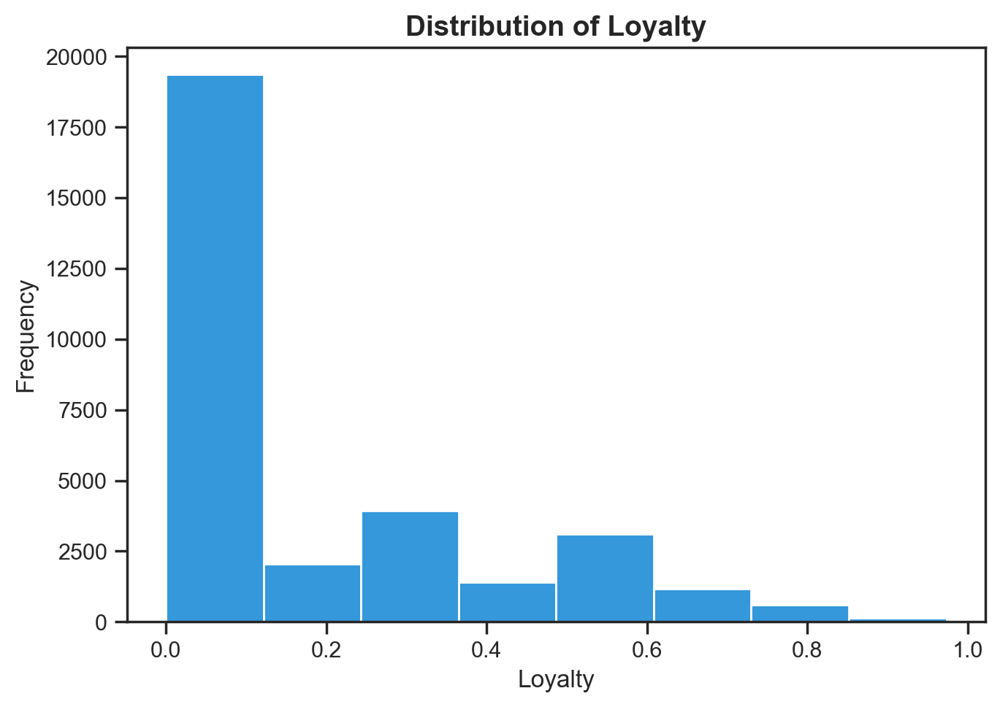

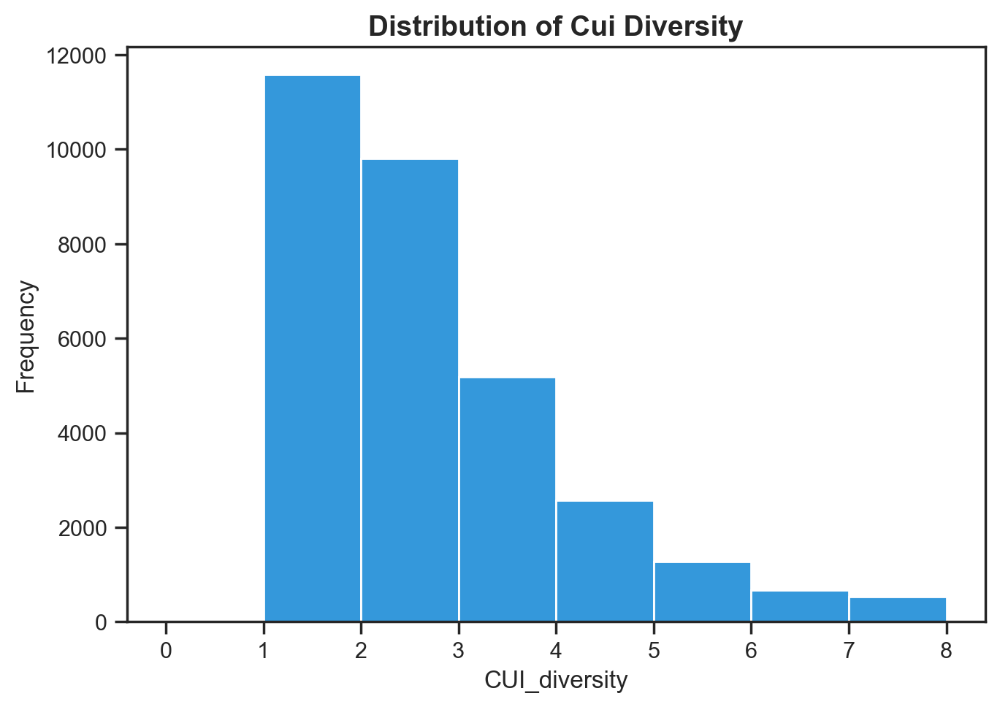

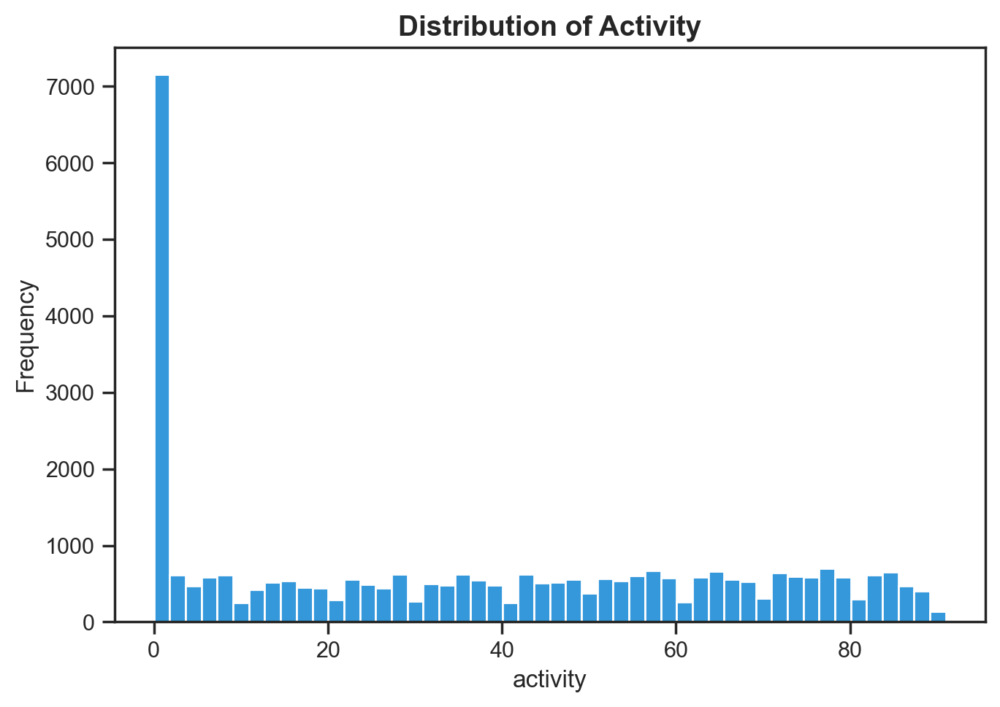

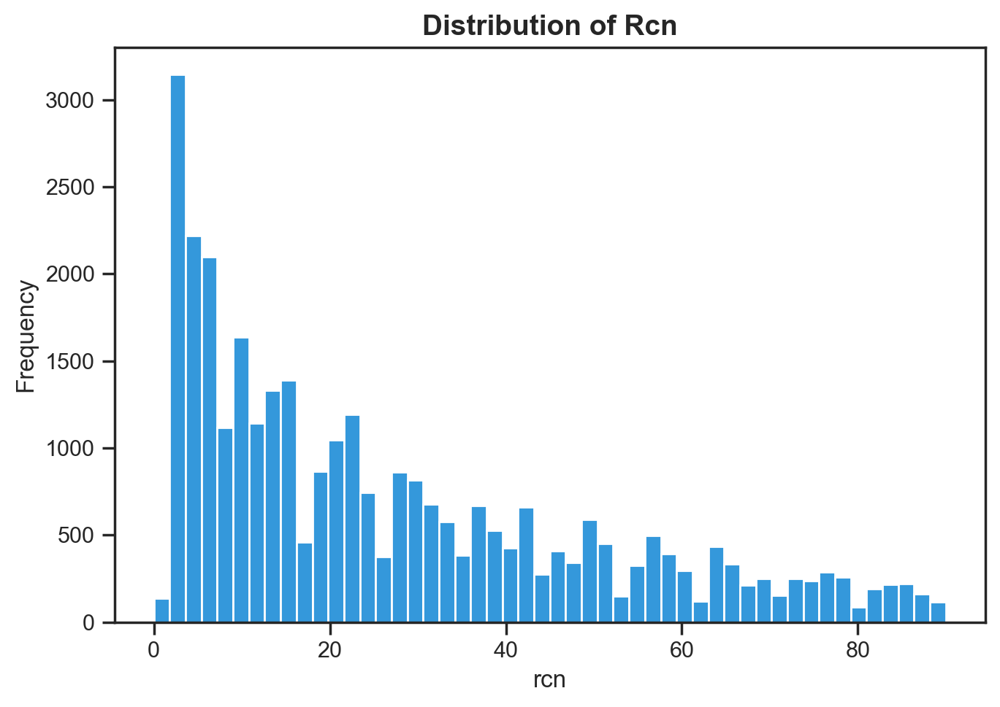

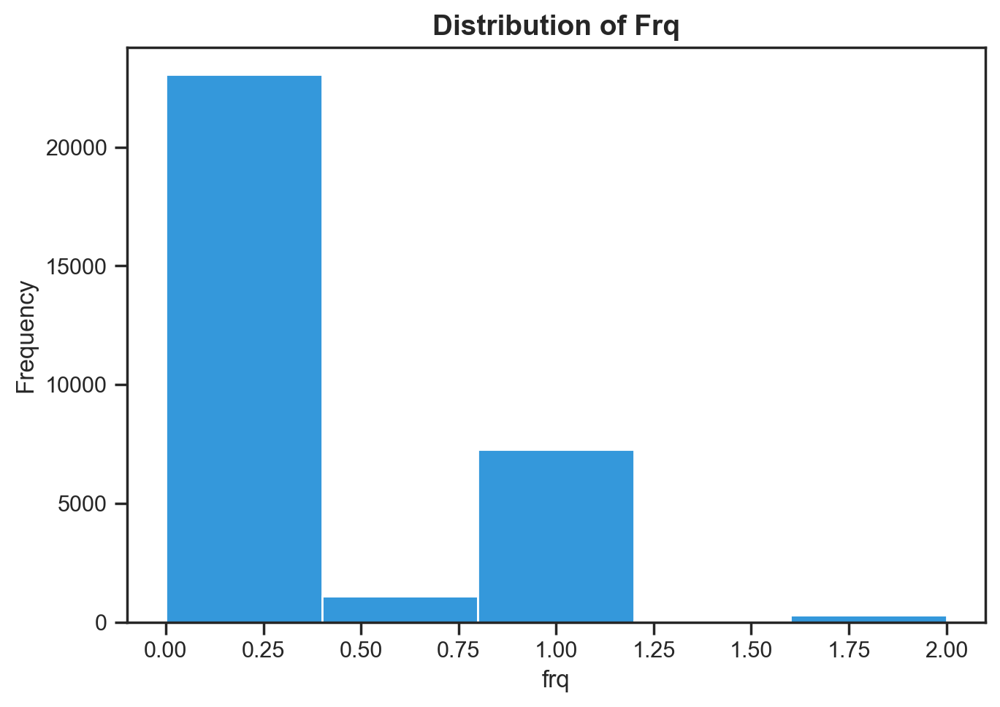

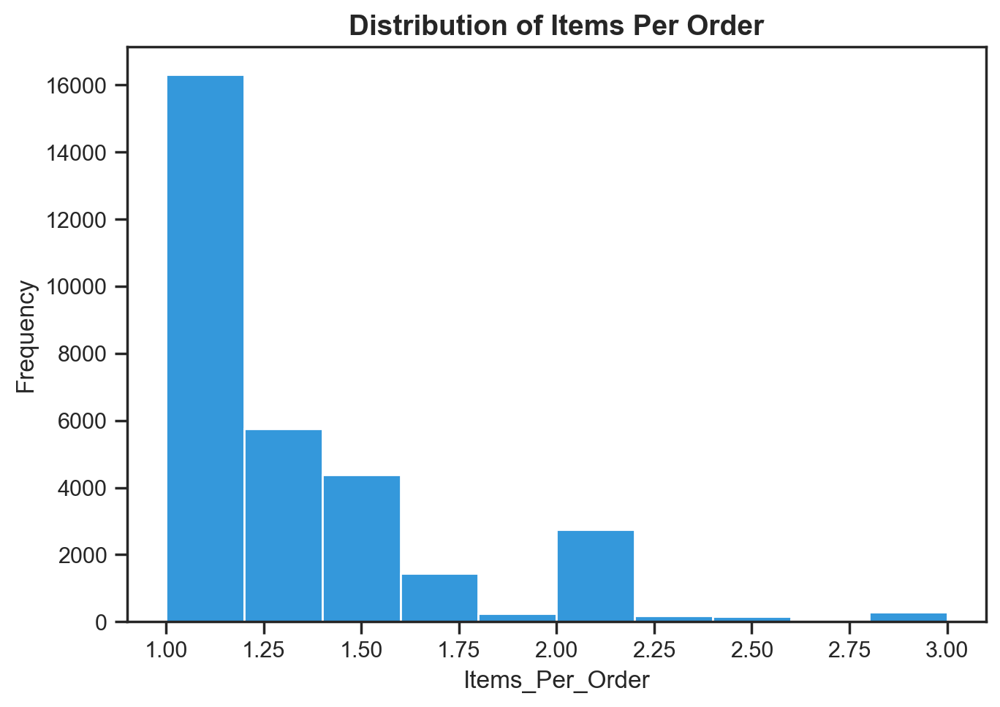

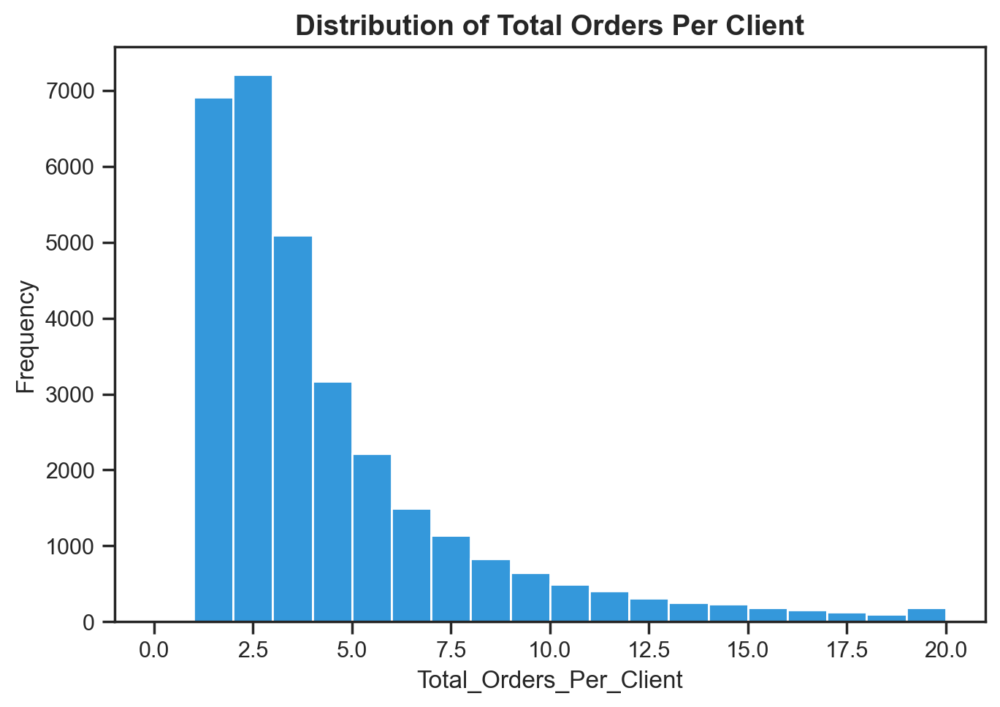

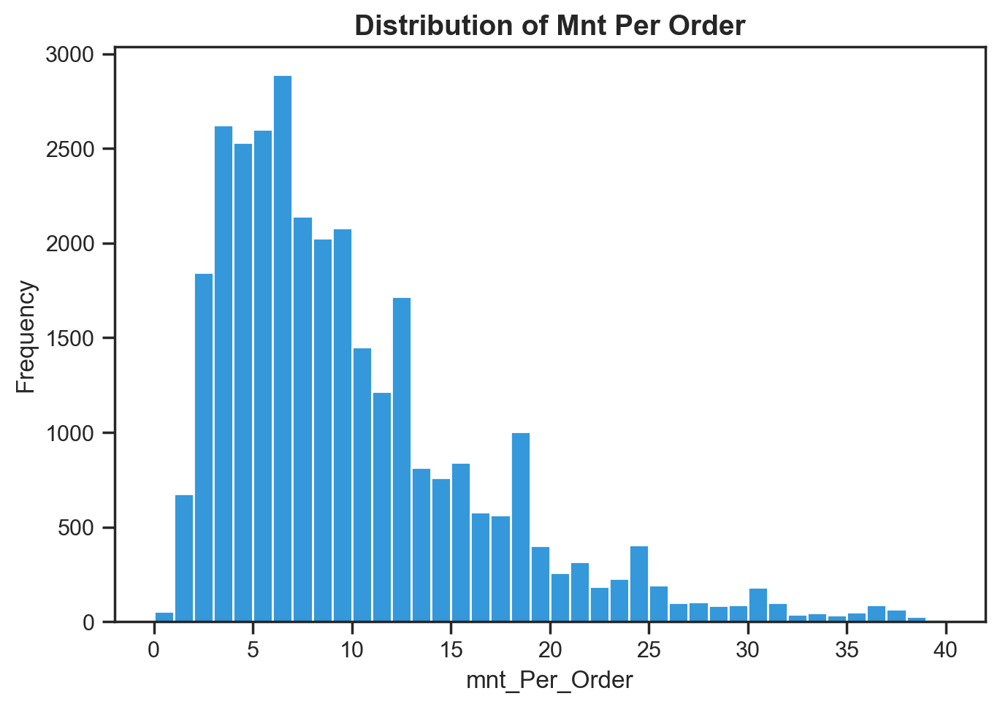

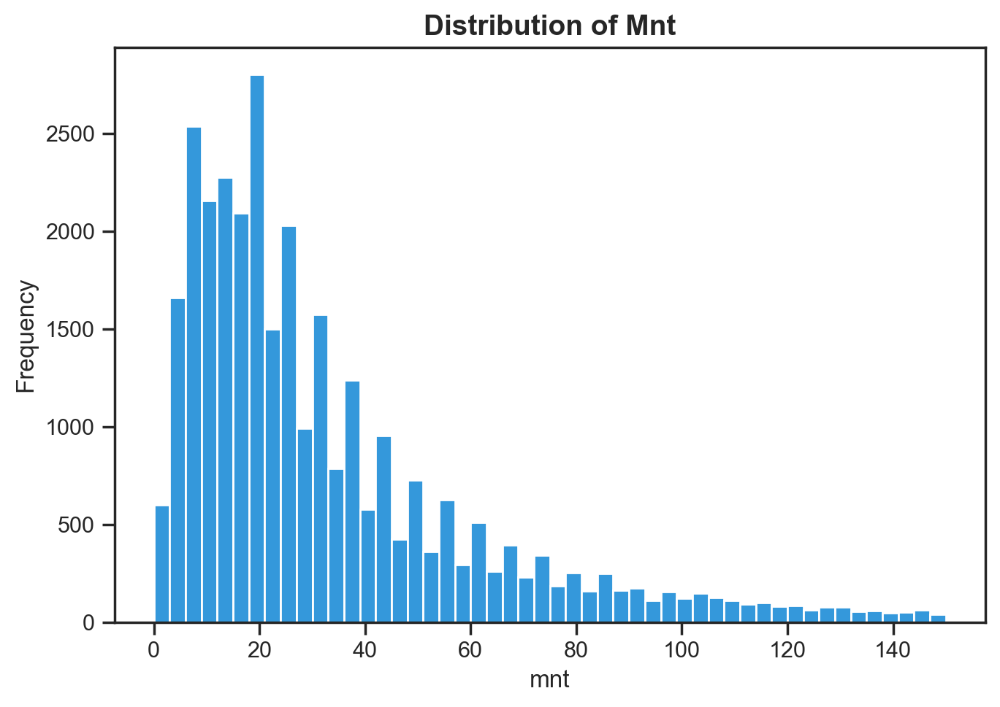

In [1578]:
# Define the variables and their configurations
new_variables = ['Loyalty', 'CUI_diversity', 'activity', 'rcn', 'frq', 'Items_Per_Order', 'Total_Orders_Per_Client', 'mnt_Per_Order', 'mnt']

bin_config = {
    'Loyalty': 8,
    'CUI_diversity': 8,
    'activity': 50,
    'rcn': 50,
    'frq': 5,
    'Items_Per_Order': 10,
    'Total_Orders_Per_Client': 20,
    'mnt_Per_Order': 40,  # Added bin configuration for 'mnt_Per_Order'
    'mnt': 50  # Added bin configuration for 'mnt'
}

range_config = {
    'Loyalty': (0, df['Loyalty'].max()),
    'CUI_diversity': (0, 8),
    'activity': (0, df['activity'].max()),
    'rcn': (0, df['rcn'].max()),
    'frq':(0, 2),
    'Items_Per_Order': (1, 3),
    'Total_Orders_Per_Client': (0, 20),
    'mnt_Per_Order': (0, 40),
    'mnt': (0, 150)
}

# Set the style for Seaborn plots
sns.set_style('ticks')
for var in new_variables:
    title = f'Distribution of {var.replace("_", " ").title()}'
    bins = bin_config.get(var,50)
    range_tuple = range_config.get(var, (df[var].min(), df[var].max()))
    create_histogram(df[var], title, var, 'Frequency', bins = bins, range=range_tuple, color='#3498DB')

#### Correlations

In [1579]:
def analyze_customer_behavior(df):
    """
    Analyze customer behavior patterns including CLV scoring, time-based ordering patterns,
    and loyalty scoring.
    Time is divided into six 4-hour periods.

    Parameters:
    df (pandas.DataFrame): DataFrame containing customer behavior data with columns:
        - recency: days since last order
        - frq: frequency of orders
        - mnt: monetary value
        - customer_age: age of customer
        - vendor_count: number of unique vendors used
        - HR_0 through HR_23: order counts for each hour

    Returns:
    pandas.DataFrame: Original dataframe with additional analysis columns
    """
    import pandas as pd

    # Calculate orders for each time period
    for period, hours in time_periods.items():
        df[f'Orders_{period}'] = df[hours].sum(axis=1)

    # Add peak ordering time
    order_cols = [f'Orders_{period}' for period in time_periods.keys()]
    df['Peak_Time'] = df[order_cols].idxmax(axis=1).str.replace('Orders_', '')

    return df

# Example usage:

df = analyze_customer_behavior(df)
result = df[[
    'CLV_Score',
    'Loyalty',
    'Age_Group',
    'Orders_Night',     # 12-4am
    'Orders_Dawn',      # 4-8am
    'Orders_Morning',   # 8am-12pm
    'Orders_Afternoon', # 12-4pm
    'Orders_Evening',   # 4-8pm
    'Orders_Dusk',      # 8pm-12am
    'Peak_Time'
]].head(5)

result


,CLV_Score,Loyalty,Age_Group,Orders_Night,Orders_Dawn,Orders_Morning,Orders_Afternoon,Orders_Evening,Orders_Dusk,Peak_Time
0,0.092846,0.0,18-24,0,0,0,0,2,0,Evening
1,0.090596,0.0,<18,0,0,2,0,0,0,Morning
2,0.088267,0.5,35-44,0,0,2,0,0,0,Morning
3,0.066010,0.0,25-34,0,0,1,1,0,0,Morning
4,0.071566,0.0,18-24,0,0,2,0,0,0,Morning


In [1580]:
result.describe()

,CLV_Score,Loyalty,Orders_Night,Orders_Dawn,Orders_Morning,Orders_Afternoon,Orders_Evening,Orders_Dusk
count,5.000000,5.000000,5.0,5.0,5.000000,5.000000,5.000000,5.0
mean,0.081857,0.100000,0.0,0.0,1.400000,0.200000,0.400000,0.0
std,0.012199,0.223607,0.0,0.0,0.894427,0.447214,0.894427,0.0
min,0.066010,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0
25%,0.071566,0.000000,0.0,0.0,1.000000,0.000000,0.000000,0.0
50%,0.088267,0.000000,0.0,0.0,2.000000,0.000000,0.000000,0.0
75%,0.090596,0.000000,0.0,0.0,2.000000,0.000000,0.000000,0.0
max,0.092846,0.500000,0.0,0.0,2.000000,1.000000,2.000000,0.0


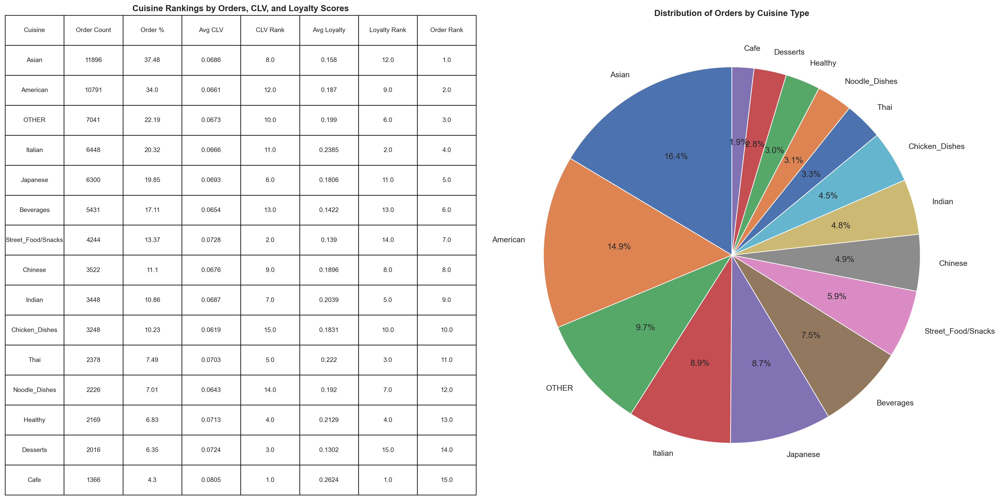


Correlations between metrics:
             Order %  Avg CLV  Avg Loyalty
Order %       1.0000  -0.3308      -0.2392
Avg CLV      -0.3308   1.0000       0.2751
Avg Loyalty  -0.2392   0.2751       1.0000

Detailed Rankings:
           Cuisine  Order Count  Order %  Avg CLV  CLV Rank  Avg Loyalty  Loyalty Rank  Order Rank
             Asian        11896    37.48   0.0686       8.0       0.1580          12.0         1.0
          American        10791    34.00   0.0661      12.0       0.1870           9.0         2.0
             OTHER         7041    22.19   0.0673      10.0       0.1990           6.0         3.0
           Italian         6448    20.32   0.0666      11.0       0.2385           2.0         4.0
          Japanese         6300    19.85   0.0693       6.0       0.1806          11.0         5.0
         Beverages         5431    17.11   0.0654      13.0       0.1422          13.0         6.0
Street_Food/Snacks         4244    13.37   0.0728       2.0       0.1390          14

In [1581]:
def analyze_cuisine_performance(df):
    """
    Analyze and visualize CLV, Loyalty scores, and order distribution across different cuisines.
    """
    # Calculate total orders across all cuisines
    total_orders = df['Total_Orders_Per_Client'].sum()

    # Initialize lists to store results
    results = []

    # Calculate metrics for each cuisine
    for cuisine in cuisines.columns:
        # Filter for orders that include this cuisine
        cuisine_orders = df[df[cuisine] > 0]

        if len(cuisine_orders) > 0:
            avg_clv = cuisine_orders['CLV_Score'].mean()
            avg_loyalty = cuisine_orders['Loyalty'].mean()
            order_count = len(cuisine_orders)
            order_percentage = (order_count / len(df)) * 100

            results.append({
                'Cuisine': cuisine.replace('CUI_', ''),
                'Order Count': order_count,
                'Order %': order_percentage,
                'Avg CLV': avg_clv,
                'CLV Rank': 0,  # Will be filled later
                'Avg Loyalty': avg_loyalty,
                'Loyalty Rank': 0,  # Will be filled later
            })

    # Convert to DataFrame
    rankings_df = pd.DataFrame(results)

    # Add rankings
    rankings_df['CLV Rank'] = rankings_df['Avg CLV'].rank(ascending=False)
    rankings_df['Loyalty Rank'] = rankings_df['Avg Loyalty'].rank(ascending=False)
    rankings_df['Order Rank'] = rankings_df['Order %'].rank(ascending=False)

    # Sort by Order Percentage
    rankings_df = rankings_df.sort_values('Order %', ascending=False)

    # Round numerical columns
    rankings_df['Avg CLV'] = rankings_df['Avg CLV'].round(4)
    rankings_df['Avg Loyalty'] = rankings_df['Avg Loyalty'].round(4)
    rankings_df['Order %'] = rankings_df['Order %'].round(2)

    # Create visualization
    fig = plt.figure(figsize=(20, 10))

    # Create main rankings table
    ax1 = plt.subplot(1, 2, 1)
    table = plt.table(cellText=rankings_df.values,
                     colLabels=rankings_df.columns,
                     cellLoc='center',
                     loc='center',
                     bbox=[0, 0, 1, 1])

    # Adjust table appearance
    table.auto_set_font_size(False)
    table.set_fontsize(9)
    for cell in table._cells:
        table._cells[cell].set_height(0.08)

    plt.axis('off')
    plt.title('Cuisine Rankings by Orders, CLV, and Loyalty Scores', fontweight='bold')
    rankings_df.to_excel('cuisine_ranking.xlsx', index=False)

    # Create order distribution pie chart
    ax2 = plt.subplot(1, 2, 2)
    plt.pie(rankings_df['Order %'],
            labels=rankings_df['Cuisine'],
            autopct='%1.1f%%',
            startangle=90)
    plt.title('Distribution of Orders by Cuisine Type', fontweight='bold')

    # Adjust layout
    plt.tight_layout()

    # Display the plot
    plt.show()

    # Create correlation analysis between metrics
    correlation_metrics = ['Order %', 'Avg CLV', 'Avg Loyalty']
    correlations = rankings_df[correlation_metrics].corr()

    print("\nCorrelations between metrics:")
    print(correlations.round(4))

    print("\nDetailed Rankings:")
    print(rankings_df.to_string(index=False))

    return rankings_df

# Run the analysis
rankings = analyze_cuisine_performance(df)

In [1582]:
def analyze_rfm_by_dimension(df, dimension):
    """
    Analyze RFM metrics grouped by a specific dimension
    """
    analysis = df.groupby(dimension).agg({
        'rcn': 'mean',
        'frq': 'mean',
        'mnt': ['mean', 'sum'],
        'Customer_Segment': lambda x: x.value_counts().head(1).index[0]
    }).round(2)

    analysis.columns = ['Avg_Recency', 'Avg_Frequency', 'Avg_Monetary', 'Total_Monetary', 'Dominant_Segment']
    return analysis

def analyze_cuisine_preferences(df):
    """
    Analyze RFM metrics by cuisine preferences
    """
    # Get all cuisine columns
    cuisine_cols = [col for col in df.columns if col.startswith('CUI_')]

    # Calculate total spend per cuisine
    cuisine_spend = pd.DataFrame()

    for col in cuisine_cols:
        cuisine_name = col.replace('CUI_', '')
        mask = df[col] > 0

        metrics = {
            'Total_Spend': df[mask][col].sum(),
            'Customer_Count': mask.sum(),
            'Avg_Order_Value': df[mask][col].mean(),
            'Avg_Customer_Recency': df[mask]['rcn'].mean(),
            'Avg_Customer_Frequency': df[mask]['frq'].mean(),
            'Most_Common_Segment': df[mask]['Customer_Segment'].mode().iloc[0] if mask.sum() > 0 else 'N/A'
        }

        cuisine_spend = pd.concat([cuisine_spend, pd.DataFrame([metrics], index=[cuisine_name])])

    return cuisine_spend.sort_values('Total_Spend', ascending=False).round(2)

def print_rfm_analysis(df):
    """
    Print comprehensive RFM analysis tables
    """
    # Calculate RFM scores first
    rfm_df = calculate_rfm_scores(df)

    print("1. RFM Analysis by Age Group:")
    print("-" * 100)
    age_analysis = analyze_rfm_by_dimension(rfm_df, 'Age_Group')
    print(age_analysis)
    print("\n")

    print("2. RFM Analysis by Region:")
    print("-" * 100)
    region_analysis = analyze_rfm_by_dimension(rfm_df, 'customer_region')
    print(region_analysis)
    print("\n")

    print("3. Cuisine Preference Analysis:")
    print("-" * 100)
    cuisine_analysis = analyze_cuisine_preferences(rfm_df)
    print(cuisine_analysis)
    print("\n")

    print("4. Overall Segment Distribution:")
    print("-" * 100)
    segment_dist = rfm_df['Customer_Segment'].value_counts()
    segment_pct = rfm_df['Customer_Segment'].value_counts(normalize=True).round(3) * 100
    print(pd.DataFrame({
        'Count': segment_dist,
        'Percentage': segment_pct
    }))

def calculate_rfm_scores(df):
    """
    Calculate RFM scores and segments for customer analysis
    """
    rfm_df = df.copy()

    # Calculate quartiles for R, F, M scores
    r_quartiles = pd.qcut(rfm_df['rcn'], q=4, labels=['4', '3', '2', '1'])
    f_quartiles = pd.qcut(rfm_df['frq'], q=4, labels=['1', '2', '3', '4'])
    m_quartiles = pd.qcut(rfm_df['mnt'], q=4, labels=['1', '2', '3', '4'])

    # Assign scores
    rfm_df['R_Score'] = r_quartiles.astype(str)
    rfm_df['F_Score'] = f_quartiles.astype(str)
    rfm_df['M_Score'] = m_quartiles.astype(str)

    # Calculate RFM Score (weighted average)
    rfm_df['RFM_Score'] = (
        0.35 * rfm_df['R_Score'].astype(int) +
        0.35 * rfm_df['F_Score'].astype(int) +
        0.30 * rfm_df['M_Score'].astype(int)
    )

    # Define customer segments
    def segment_customers(score):
        if score >= 3.5:
            return 'Best Customers'
        elif score >= 3:
            return 'Loyal Customers'
        elif score >= 2.5:
            return 'Average Customers'
        elif score >= 2:
            return 'Below Average Customers'
        else:
            return 'Lost Customers'

    rfm_df['Customer_Segment'] = rfm_df['RFM_Score'].apply(segment_customers)

    return rfm_df

# Example usage
print_rfm_analysis(df)

1. RFM Analysis by Age Group:
----------------------------------------------------------------------------------------------------
           Avg_Recency  Avg_Frequency  Avg_Monetary  Total_Monetary  \
Age_Group                                                             
<18              28.24           0.40         34.72        12602.70   
18-24            27.23           0.36         38.07       456954.60   
25-34            26.77           0.35         38.79       581607.18   
35-44            26.73           0.36         38.84       134243.29   
45-54            26.46           0.36         37.61        27640.90   
55+              25.38           0.34         41.03         7631.77   

                  Dominant_Segment  
Age_Group                           
<18        Below Average Customers  
18-24      Below Average Customers  
25-34      Below Average Customers  
35-44      Below Average Customers  
45-54      Below Average Customers  
55+        Below Average Customers  


2.

In [1583]:
numeric_df = df.select_dtypes(include=[np.number])
correlation_matrix = numeric_df.corr()
columns_to_exclude = ['HR_0', 'HR_1', 'HR_2', 'HR_3',
                      'HR_4', 'HR_5', 'HR_6', 'HR_7', 'HR_8', 'HR_9', 'HR_10', 'HR_11',
                      'HR_12', 'HR_13', 'HR_14', 'HR_15', 'HR_16', 'HR_17', 'HR_18', 'HR_19',
                      'HR_20', 'HR_21', 'HR_22', 'HR_23', "DOW_0","DOW_1","DOW_2","DOW_3","DOW_4","DOW_5","DOW_6"]
correlation_matrix = correlation_matrix.drop(columns_to_exclude, axis=1)
correlation_matrix = correlation_matrix.drop(columns_to_exclude, axis=0)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
correlation_matrix.round(2)

correlation_matrix.to_csv('correlation_matrix.csv', index=True)

correlation_matrix = pd.read_csv('correlation_matrix.csv', index_col=0)

columns_to_display = [
    'Total_Orders_Per_Client',
    'product_count',
    'is_chain',
    'vendor_count',
    'activity',
    'Loyalty'
]


filtered_matrix = correlation_matrix.loc[columns_to_display, ['Total_Orders_Per_Client']]

filtered_matrix

,Total_Orders_Per_Client
Total_Orders_Per_Client,1.000000
product_count,0.964990
is_chain,0.866973
vendor_count,0.842243
activity,0.593832
Loyalty,0.481048


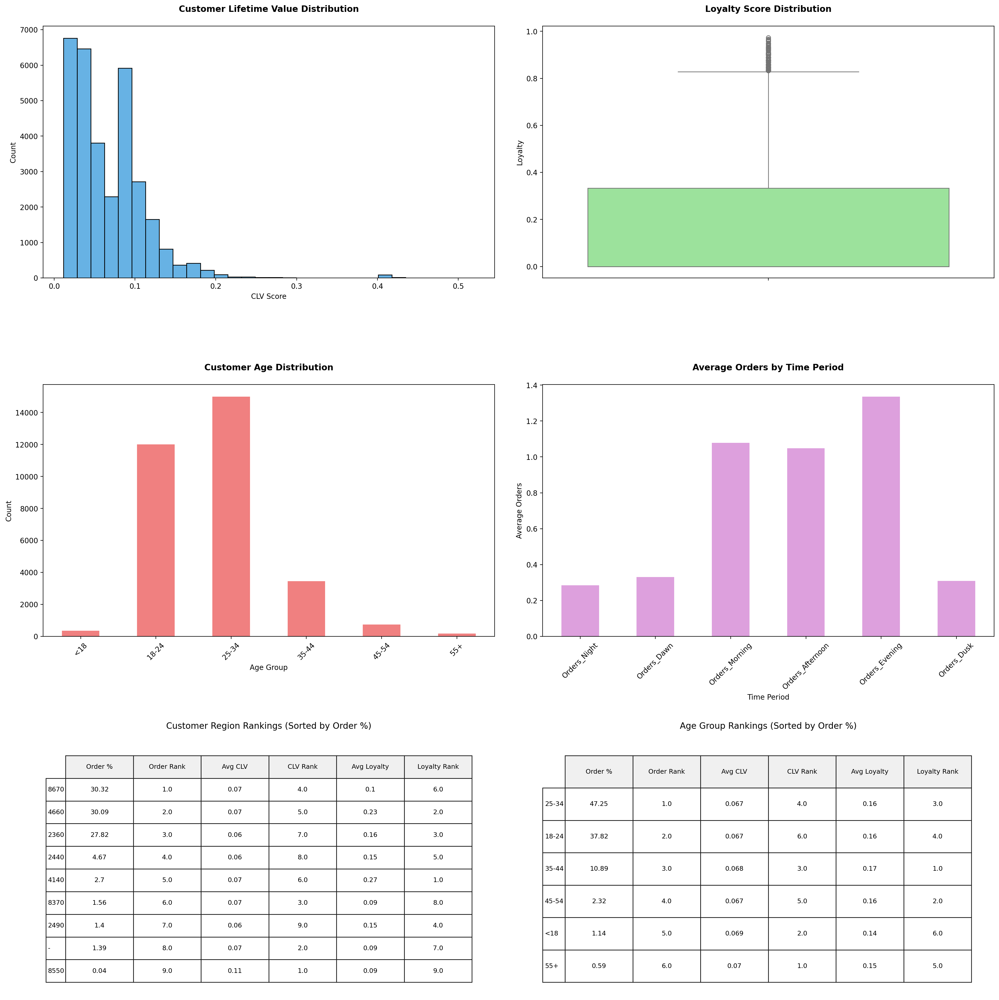


Detailed Rankings by Customer Region (sorted by Order %):
                 Order %  Order Rank  Avg CLV  CLV Rank  Avg Loyalty  Loyalty Rank
customer_region                                                                   
8670               30.32         1.0     0.07       4.0         0.10           6.0
4660               30.09         2.0     0.07       5.0         0.23           2.0
2360               27.82         3.0     0.06       7.0         0.16           3.0
2440                4.67         4.0     0.06       8.0         0.15           5.0
4140                2.70         5.0     0.07       6.0         0.27           1.0
8370                1.56         6.0     0.07       3.0         0.09           8.0
2490                1.40         7.0     0.06       9.0         0.15           4.0
-                   1.39         8.0     0.07       2.0         0.09           7.0
8550                0.04         9.0     0.11       1.0         0.09           9.0

Detailed Rankings by Age Gr

In [1584]:
def visualize_customer_behavior(df):

    # Verify data is not empty
    if df.empty:
        raise ValueError("DataFrame is empty")

    # Check for null values in key columns
    key_columns = ['customer_region', 'CLV_Score', 'Loyalty', 'Age_Group', 'Peak_Time']
    null_counts = df[key_columns].isnull().sum()

    # Handle null values
    df_clean = df.copy()
    if null_counts['Loyalty'] > 0:
        print(f"Filling {null_counts['Loyalty']} null Loyalty_Score values with median")
        df_clean['Loyalty'].fillna(df_clean['Loyalty'].median(), inplace=True)

    if null_counts.any():
        print("Null values found in the following columns:")
        print(null_counts[null_counts > 0])

    # Create a figure with subplots
    plt.style.use('default')  # Use default style instead of seaborn
    fig = plt.figure(figsize=(20, 20))

    # 1. CLV Score Distribution
    plt.subplot(3, 2, 1)
    sns.histplot(data=df_clean, x='CLV_Score', bins=30, color='#3498DB')
    plt.title('Customer Lifetime Value Distribution', pad=20, fontsize=12, fontweight='bold')
    plt.xlabel('CLV Score')
    plt.ylabel('Count')

    # 2. Loyalty Score Distribution
    plt.subplot(3, 2, 2)
    sns.boxplot(data=df_clean, y='Loyalty', color='lightgreen')
    plt.title('Loyalty Score Distribution', pad=20, fontsize=12, fontweight='bold')

    # 3. Age Group Distribution
    plt.subplot(3, 2, 3)
    age_counts = df_clean['Age_Group'].value_counts().sort_index()
    age_counts.plot(kind='bar', color='lightcoral')
    plt.title('Customer Age Distribution', pad=20, fontsize=12, fontweight='bold')
    plt.xlabel('Age Group')
    plt.ylabel('Count')
    plt.xticks(rotation=45)

    # 4. Time Period Order Distribution
    plt.subplot(3, 2, 4)
    time_cols = ['Orders_Night', 'Orders_Dawn', 'Orders_Morning',
                 'Orders_Afternoon', 'Orders_Evening', 'Orders_Dusk']

    # Check if time columns exist
    available_time_cols = [col for col in time_cols if col in df_clean.columns]
    if available_time_cols:
        time_data = df_clean[available_time_cols].mean()
        time_data.plot(kind='bar', color='plum')
        plt.title('Average Orders by Time Period', pad=20, fontsize=12, fontweight='bold')
        plt.xlabel('Time Period')
        plt.ylabel('Average Orders')
        plt.xticks(rotation=45)
    else:
        plt.text(0.5, 0.5, 'Time period data not available',
                horizontalalignment='center', verticalalignment='center')

    # 5. Customer Region Rankings
    plt.subplot(3, 2, 5)

    # Calculate metrics by customer_region
    region_stats = df_clean.groupby('customer_region').agg({
        'CLV_Score': 'mean',
        'Loyalty': 'mean',
        'customer_region': 'count'
    }).rename(columns={'customer_region': 'Count'})

    total_customers = len(df_clean)
    region_rankings = pd.DataFrame({
        'Order %': (region_stats['Count'] / total_customers * 100).round(2),
        'Order Rank': (region_stats['Count'] / total_customers * 100).rank(ascending=False),
        'Avg CLV': region_stats['CLV_Score'].round(2),
        'CLV Rank': region_stats['CLV_Score'].rank(ascending=False),
        'Avg Loyalty': region_stats['Loyalty'].round(2),
        'Loyalty Rank': region_stats['Loyalty'].rank(ascending=False)
    })

    region_rankings = region_rankings.sort_values('Order %', ascending=False)

    # Create table for region rankings with improved formatting
    table_region = plt.table(cellText=region_rankings.values,
                           rowLabels=region_rankings.index,
                           colLabels=region_rankings.columns,
                           cellLoc='center',
                           loc='center',
                           bbox=[0.05, 0.05, 0.9, 0.9])  # Adjusted bbox for better spacing

    table_region.auto_set_font_size(False)
    table_region.set_fontsize(9)
    for cell in table_region._cells:
        table_region._cells[cell].set_height(0.1)
        if cell[0] == 0:  # Header row
            table_region._cells[cell].set_facecolor('#f0f0f0')
        # Create a DataFrame from the table

    plt.axis('off')
    plt.title('Customer Region Rankings (Sorted by Order %)', pad=20, fontsize=12)

    # 6. Age Group Rankings
    plt.subplot(3, 2, 6)

    # Calculate metrics by Age_Group
    age_stats = df_clean.groupby('Age_Group').agg({
        'CLV_Score': 'mean',
        'Loyalty': 'mean',
        'Age_Group': 'count'
    }).rename(columns={'Age_Group': 'Count'})

    age_rankings = pd.DataFrame({
        'Order %': (age_stats['Count'] / total_customers * 100).round(2),
        'Order Rank': (age_stats['Count'] / total_customers * 100).rank(ascending=False),
        'Avg CLV': age_stats['CLV_Score'].round(3),
        'CLV Rank': age_stats['CLV_Score'].rank(ascending=False),
        'Avg Loyalty': age_stats['Loyalty'].round(2),
        'Loyalty Rank': age_stats['Loyalty'].rank(ascending=False)
    })

    age_rankings = age_rankings.sort_values('Order %', ascending=False)

    # Create table for age rankings with improved formatting
    table_age = plt.table(cellText=age_rankings.values,
                         rowLabels=age_rankings.index,
                         colLabels=age_rankings.columns,
                         cellLoc='center',
                         loc='center',
                         bbox=[0.05, 0.05, 0.9, 0.9])  # Adjusted bbox for better spacing

    table_age.auto_set_font_size(False)
    table_age.set_fontsize(9)
    for cell in table_age._cells:
        table_age._cells[cell].set_height(0.1)
        if cell[0] == 0:  # Header row
            table_age._cells[cell].set_facecolor('#f0f0f0')

    plt.axis('off')
    plt.title('Age Group Rankings (Sorted by Order %)', pad=20, fontsize=12)

    # Adjust layout to prevent overlap
    plt.tight_layout(pad=3.0)  # Increased padding

    # Display the plot
    plt.show()

    print("\nDetailed Rankings by Customer Region (sorted by Order %):")
    print(region_rankings.to_string())
    print("\nDetailed Rankings by Age Group (sorted by Order %):")
    print(age_rankings.to_string())

    # Save to Excel files
    region_rankings.to_excel('region_rankings.xlsx', index=True)
    age_rankings.to_excel('age_group_rankings.xlsx', index=True)

    return region_rankings, age_rankings

region_rankings, age_rankings = visualize_customer_behavior(df)


=== Feature Statistics ===
                 Feature  Count  Percentage
0           is_prime_age  27976       88.15
6          prefers_chain  25701       80.98
4  is_peak_hour_customer  21198       66.79
1        is_prime_region  19173       60.41
2         is_high_active  15380       48.46
3   high_cuisine_variety   9757       30.74
7      is_loyal_customer   4992       15.73
5       has_high_variety   3101        9.77

=== Distribution of Total Positive Features ===
total_positive_features
0      32
1     605
2    3831
3    8611
4    8107
5    4972
6    3650
7    1442
8     487
Name: count, dtype: int64

=== Top 10 Customers by Features ===
     customer_id  is_prime_age  is_prime_region  is_high_active  \
2408  8c9f6827e2          True             True            True   
1045  f8cd91b2dc          True             True            True   
5915  74490ee3ec          True             True            True   
1864  2d2a82e81d          True             True            True   
7973  c590e195

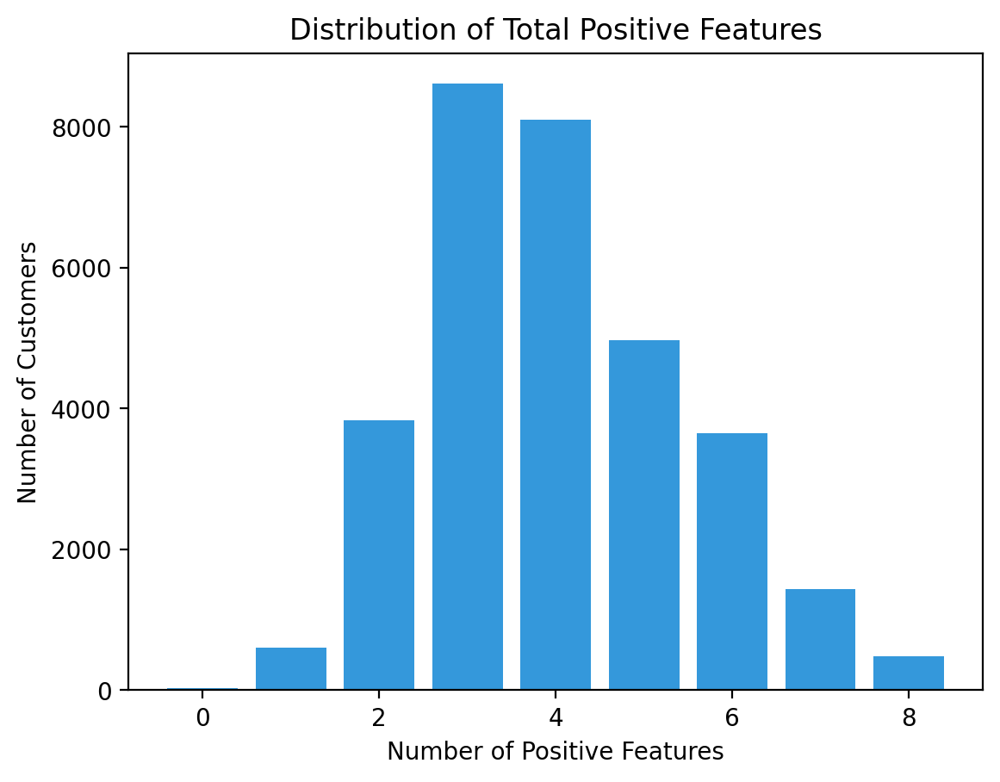


=== Key Feature Combinations ===

Loyalty & Chain Preference Cross-tab:
prefers_chain      False   True    All
is_loyal_customer                     
False               4674  22071  26745
True                1362   3630   4992
All                 6036  25701  31737

Cuisine Variety & Active Period Cross-tab:
is_high_active        False   True    All
high_cuisine_variety                     
False                 14431   7549  21980
True                   1926   7831   9757
All                   16357  15380  31737


In [1585]:
# First, read the original CSV to get customer_id
original_df = pd.read_csv('DM2425_ABCDEats_DATASET.csv')
customer_id_df = original_df[['customer_id']]

def create_and_rank_binary_features(df, customer_ids):
    """
    Create binary features and rank customers based on feature counts
    Including customer_id from original data and new metrics
    """
    # Create binary features
    df_new = df.copy()

    # Add customer_id back
    df_new = df_new.reset_index()
    df_new['customer_id'] = customer_ids['customer_id']

    # 1. Prime Age Range (20-40 years)
    df_new['is_prime_age'] = (df_new['customer_age'] >= 20) & (df_new['customer_age'] <= 40)

    # 2. Prime Regions
    prime_regions = ['8670', '4660', '260']
    df_new['is_prime_region'] = df_new['customer_region'].isin(prime_regions)

    # 3. High Active Period
    df_new['is_high_active'] = df_new['activity'] > df_new['activity'].mean()

    # 4. Aggregated Cuisine Preferences
    # Combine all cuisine columns
    cuisine_cols = [col for col in df_new.columns if col.startswith('CUI_')]
    cuisine_threshold = df_new[cuisine_cols].sum(axis=1).mean()
    df_new['high_cuisine_variety'] = df_new[cuisine_cols].sum(axis=1) > cuisine_threshold

    # 5. Peak Hour Ordering
    peak_hours = [f'HR_{i}' for i in range(9, 19)]
    non_peak_hours = [f'HR_{i}' for i in list(range(0, 9)) + list(range(19, 24))]
    peak_hour_orders = df_new[peak_hours].sum(axis=1)
    non_peak_orders = df_new[non_peak_hours].sum(axis=1)
    df_new['is_peak_hour_customer'] = peak_hour_orders > non_peak_orders

    # 6. High Product Variety
    product_mean = df_new['product_count'].mean()
    product_std = df_new['product_count'].std()
    df_new['has_high_variety'] = df_new['product_count'] > (product_mean + product_std)

    # 7. Chain Preference (New)
    df_new['prefers_chain'] = df_new['is_chain'] >= 1

    # 8. High Loyalty (New)
    df_new['is_loyal_customer'] = df_new['Loyalty'] >= 0.5

    # Select binary features
    binary_features = [
        'is_prime_age',
        'is_prime_region',
        'is_high_active',
        'high_cuisine_variety',
        'is_peak_hour_customer',
        'has_high_variety',
        'prefers_chain',
        'is_loyal_customer'
    ]

    # Calculate total positive features for each customer
    df_new['total_positive_features'] = df_new[binary_features].sum(axis=1)

    # Create ranking
    df_new['customer_rank'] = df_new['total_positive_features'].rank(method='dense', ascending=False)

    # Select and order columns for display
    display_columns = ['customer_id'] + binary_features + ['total_positive_features', 'customer_rank']
    df_ranked = df_new[display_columns].sort_values('total_positive_features', ascending=False)

    return df_ranked

# Execute the analysis
binary_df = create_and_rank_binary_features(df, customer_id_df)

# Print summary statistics
print("\n=== Feature Statistics ===")
binary_features = ['is_prime_age', 'is_prime_region', 'is_high_active',
                  'high_cuisine_variety', 'is_peak_hour_customer',
                  'has_high_variety', 'prefers_chain', 'is_loyal_customer']

stats_df = pd.DataFrame({
    'Feature': binary_features,
    'Count': [binary_df[feat].sum() for feat in binary_features],
    'Percentage': [(binary_df[feat].sum() / len(binary_df) * 100).round(2) for feat in binary_features]
})
print(stats_df.sort_values('Count', ascending=False))

print("\n=== Distribution of Total Positive Features ===")
dist_df = binary_df['total_positive_features'].value_counts().sort_index()
print(dist_df)

print("\n=== Top 10 Customers by Features ===")
print(binary_df.head(10))

print("\n=== Bottom 10 Customers by Features ===")
print(binary_df.tail(10))

# Print segment sizes
total_customers = len(binary_df)
print("\n=== Customer Segments ===")
for i in range(binary_df['total_positive_features'].max() + 1):
    count = len(binary_df[binary_df['total_positive_features'] == i])
    print(f"Customers with {i} positive features: {count} ({(count/total_customers*100):.2f}%)")

# Get the count of each number of positive features
feature_counts = binary_df['total_positive_features'].value_counts().sort_index()

plt.bar(feature_counts.index, feature_counts.values, color='#3498DB')
plt.xlabel('Number of Positive Features')
plt.ylabel('Number of Customers')
plt.title('Distribution of Total Positive Features')
plt.show()

# Feature combinations
print("\n=== Key Feature Combinations ===")
print("\nLoyalty & Chain Preference Cross-tab:")
print(pd.crosstab(binary_df['is_loyal_customer'], binary_df['prefers_chain'], margins=True))

print("\nCuisine Variety & Active Period Cross-tab:")
print(pd.crosstab(binary_df['high_cuisine_variety'], binary_df['is_high_active'], margins=True))


In [1586]:
# The highest total orders (1,531) come from customers with 3 features

# Join the data and analyze orders by rank
dforiginal = pd.read_csv('DM2425_ABCDEats_DATASET.csv')

# Calculate Total_Orders_Week from DOW columns
dforiginal['Total_Orders_Week'] = dforiginal[[f'DOW_{i}' for i in range(7)]].sum(axis=1)

# Merge binary features with original data
merged_df = binary_df.merge(dforiginal[['customer_id', 'Total_Orders_Week']],
                           on='customer_id',
                           how='left')

# Group by total positive features and analyze orders
rank_analysis = merged_df.groupby('total_positive_features').agg({
    'customer_id': 'count',  # Number of customers
    'Total_Orders_Week': ['mean', 'median', 'min', 'max', 'sum']  # Order statistics
}).round(2)

# Rename columns for clarity
rank_analysis.columns = ['Customer_Count', 'Avg_Orders', 'Median_Orders',
                        'Min_Orders', 'Max_Orders', 'Total_Orders']

# Add percentage of customers
rank_analysis['Customer_Percentage'] = (rank_analysis['Customer_Count'] /
                                      rank_analysis['Customer_Count'].sum() * 100).round(2)

# Add percentage of orders
rank_analysis['Orders_Percentage'] = (rank_analysis['Total_Orders'] /
                                    rank_analysis['Total_Orders'].sum() * 100).round(2)

# Sort by index (total_positive_features)
rank_analysis = rank_analysis.sort_index()

print("\n=== Order Analysis by Total Positive Features ===")
print(rank_analysis)

# Calculate correlations
correlation = merged_df['total_positive_features'].corr(merged_df['Total_Orders_Week'])
print(f"\nCorrelation between positive features and orders: {correlation:.3f}")

# Additional insights
print("\n=== Key Insights ===")
for features in range(len(rank_analysis)):
    customers = rank_analysis.loc[features, 'Customer_Count']
    orders = rank_analysis.loc[features, 'Total_Orders']
    print(f"\nCustomers with {features} positive features:")
    print(f"- Count: {customers:,.0f} ({rank_analysis.loc[features, 'Customer_Percentage']}%)")
    print(f"- Total Orders: {orders:,.0f} ({rank_analysis.loc[features, 'Orders_Percentage']}%)")
    print(f"- Average Orders: {rank_analysis.loc[features, 'Avg_Orders']:.1f}")

# Create cumulative analysis
rank_analysis['Cumulative_Customers'] = (rank_analysis['Customer_Percentage'].cumsum()).round(2)
rank_analysis['Cumulative_Orders'] = (rank_analysis['Orders_Percentage'].cumsum()).round(2)

print("\n=== Cumulative Analysis ===")
print(rank_analysis[['Customer_Percentage', 'Cumulative_Customers',
                     'Orders_Percentage', 'Cumulative_Orders']])

# Save the analysis results
rank_analysis.to_csv('rank_order_analysis.csv')


=== Order Analysis by Total Positive Features ===
                         Customer_Count  Avg_Orders  Median_Orders  \
total_positive_features                                              
0                                    32        2.41            2.0   
1                                   607        2.51            2.0   
2                                  3834        2.56            2.0   
3                                  8623        3.00            2.0   
4                                  8113        3.79            3.0   
5                                  4972        5.22            4.0   
6                                  3653        7.04            5.0   
7                                  1442        9.46            7.0   
8                                   487       12.22            9.0   

                         Min_Orders  Max_Orders  Total_Orders  \
total_positive_features                                         
0                                 1          10 

<hr>
<a class="anchor" id="preprocessing">
    
# 6. Pre-Processing
    
</a>

<hr>
<a class="anchor" id="noutliers">
    
## 6.1 Outliers

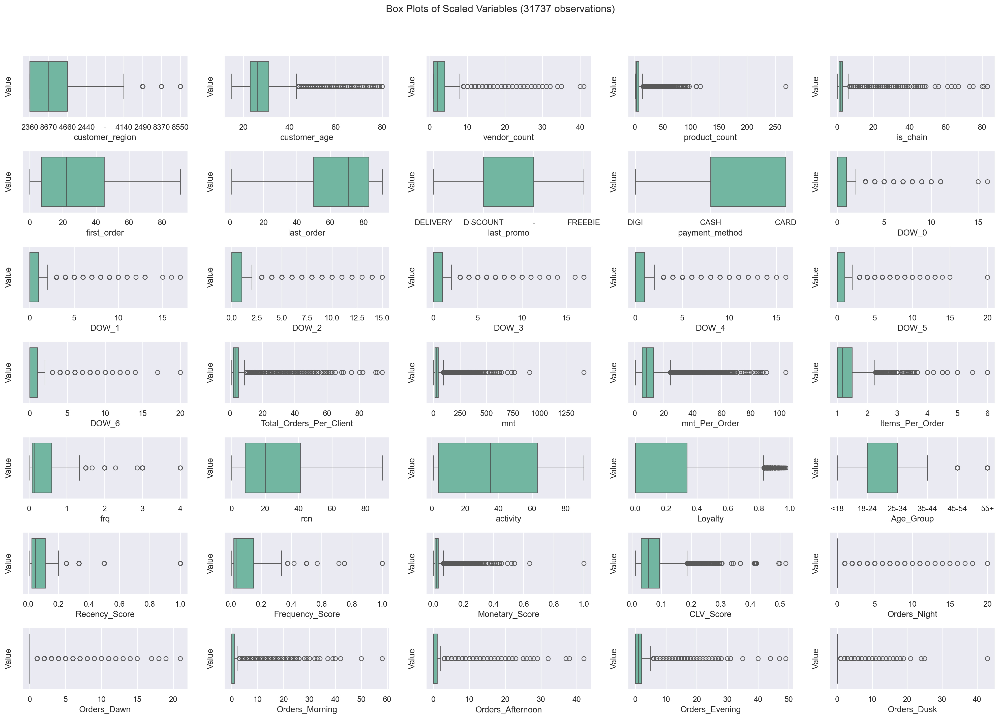

In [1587]:
sns.set()

fig, axes = plt.subplots(7, 5, figsize=(20, 15))

columns_to_plot = [col for col in df.columns if 'CUI' not in col and 'HR' not in col]

for ax, feat in zip(axes.flatten(), columns_to_plot):
    sns.boxplot(x=df[feat], ax=ax, palette='Set2')
    ax.set_xlabel(feat)
    ax.set_ylabel('Value')

title = f"Box Plots of Scaled Variables ({df.shape[0]} observations)"
plt.suptitle(title)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

In [1588]:
# Visualize CUI features
# sns.set()

# fig, axes = plt.subplots(4, 4, figsize=(20, 15))

# columns_to_plot = [col for col in df.columns if 'CUI' in col]

#for ax, feat in zip(axes.flatten(), columns_to_plot):
#    sns.boxplot(x=df[feat], ax=ax, palette='Set2')
#    ax.set_xlabel(feat)
#    ax.set_ylabel('Value')

#title = f"Box Plots of Scaled Variables ({df.shape[0]} observations)"
#plt.suptitle(title)
#plt.tight_layout(rect=[0, 0.03, 1, 0.95])
#plt.show()

 Note: It appears that many features have outliers on the upper end (beyond the upper whiskers of the boxplots)<br>
The upper whisker ends either at: <br>
1. The largest value within Q3+1.5*IQR, or <br>
2. The maximum value in the dataset if no values exceed this threshold. <br>
    
Based on this observation, we decided to categorize all the observations falling above that threshold to be outliers. <br>
We decided for winsorization instead of truncation to keep and treat the abnormal values. We assume these observations are real values and we don't want to remove them. <br>

The following features will be treated for outliers through winsorization
- `vendor_count`
- `product_count`
- `is_chain`
- `Total_Orders_Per_Client`
- `mnt`
- `mnt_Per_Order`
- `Items_Per_Order`
- `frq`
- `rcn`
- `activity`
- `CUI_diversity`
- `Loyalty`
- `Recency_Score`
- `Frequency_Score`
- `Monetary_Score`
- `CLV_Score`

We decided to bucket these features:
- `customer age` ---> `Age_Group`
- Cuisines
- DOWs
- HRs ---> `Peak_Time`

These variables will be transformed to binary (?) variables:
- `customer_region`
- `last_promo`
- `payment_method`

These features don't have any outliers:
- `first_order`
- `last_order`



In [1589]:
features_to_win = ["vendor_count", "product_count", "is_chain", "Total_Orders_Per_Client", "mnt", "mnt_Per_Order",
                "Items_Per_Order", "frq", "rcn", "activity", "CUI_diversity", "Loyalty", "Recency_Score", "Frequency_Score",
                "Monetary_Score", "CLV_Score"]


In [1590]:
# Modified Winsorization Function
def winsorize_upper(data):
    q1, q3 = np.percentile(data, [25, 75])
    iqr = q3 - q1
    # Compute the upper whisker
    upper_bound = q3 + (1.5 * iqr)
    # Apply trimming only above the upper whisker
    data[data > upper_bound] = upper_bound
    return np.where(data > upper_bound, upper_bound, data)  # Cap values above the upper bound

# Winsorization
def winsorize(data, p=0.01):
    q1, q3 = np.percentile(data, [25, 75])
    iqr = q3 - q1
    lower_bound = q1 - (1.5 * iqr)
    upper_bound = q3 + (1.5 * iqr)
    data[data < lower_bound] = lower_bound
    data[data > upper_bound] = upper_bound
    return data

# Truncation
def truncate(data, p=0.95):
    threshold = np.percentile(data, p)
    data[data > threshold] = threshold
    return data

def treat_outliers(data):

    data = winsorize(data, p=0.01)

    #data = truncate(data, p=0.95)

    return data


In [1591]:
# Apply winsorization
for col in features_to_win:
    df[col] = winsorize_upper(df[col].values)

df.describe()

,customer_age,vendor_count,product_count,is_chain,first_order,last_order,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken_Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle_Dishes,CUI_OTHER,CUI_Street_Food/Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,Total_Orders_Per_Client,mnt,mnt_Per_Order,Items_Per_Order,frq,rcn,activity,CUI_diversity,Loyalty,Recency_Score,Frequency_Score,Monetary_Score,CLV_Score,Orders_Night,Orders_Dawn,Orders_Morning,Orders_Afternoon,Orders_Evening,Orders_Dusk
count,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.00000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.00000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000
mean,27.497842,2.918581,4.932445,2.252891,28.608375,64.058985,4.898412,9.998594,2.308218,0.804975,0.771751,1.438027,0.888566,0.954724,1.638914,3.248795,3.009058,0.715062,3.014186,3.927394,0.845701,0.558339,0.570029,0.593503,0.622081,0.680814,0.655796,0.707471,0.048902,0.054069,0.063428,0.118820,0.102152,0.08227,0.069918,0.077008,0.132432,0.234962,0.331096,0.379904,0.315625,0.237452,0.216624,0.278319,0.358131,0.392759,0.338564,0.246747,0.143492,0.071494,0.048492,0.045373,3.686927,33.267142,9.844285,1.283130,0.347879,26.941015,36.45061,2.248039,0.161565,0.079498,0.086970,0.023455,0.066017,0.285219,0.331348,1.078394,1.048020,1.336201,0.308851
std,7.080691,2.035818,3.931106,1.952278,24.302594,22.939355,11.667887,23.603496,8.492919,6.442166,3.665578,8.210623,5.272012,5.844075,7.460068,11.272500,10.202599,4.546970,9.789314,15.579992,4.443200,1.015171,1.045785,1.047444,1.071099,1.089727,1.071256,1.169202,0.313652,0.317700,0.352228,0.498135,0.438448,0.35944,0.329990,0.378134,0.636923,0.726425,0.892982,0.961879,0.844199,0.638706,0.600230,0.739659,0.876181,0.945570,0.895771,0.796995,0.587839,0.349330,0.298955,0.282608,2.612549,26.736028,6.222479,0.350075,0.390181,22.939355,29.40898,1.350544,0.228829,0.072992,0.097545,0.018850,0.040343,0.907566,0.946374,2.093201,1.834232,2.336247,0.989525
min,15.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.370000,0.370000,1.000000,0.022222,0.000000,1.00000,1.000000,0.000000,0.010989,0.005556,0.000261,0.011496,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,23.000000,1.000000,2.000000,1.000000,7.000000,50.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0

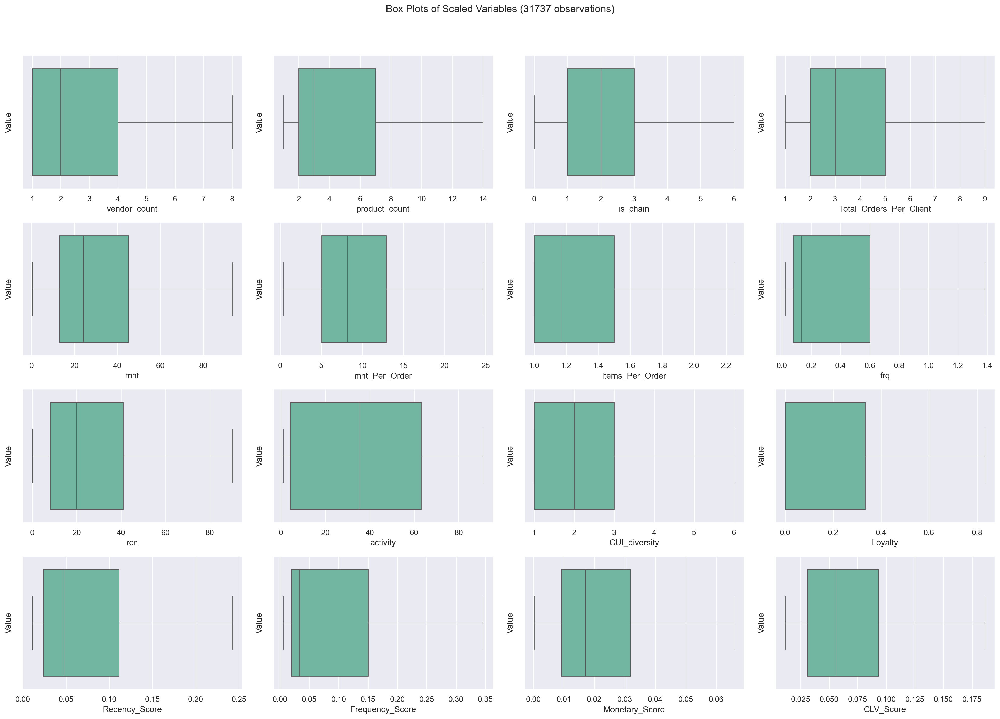

In [1592]:
sns.set()

fig, axes = plt.subplots(4, 4, figsize=(20, 15))

columns_to_plot = features_to_win

for ax, feat in zip(axes.flatten(), columns_to_plot):
    sns.boxplot(x=df[feat], ax=ax, palette='Set2')
    ax.set_xlabel(feat)
    ax.set_ylabel('Value')

title = f"Box Plots of Scaled Variables ({df.shape[0]} observations)"
plt.suptitle(title)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

In [1593]:
# need it not encoded and scaled in this way for dimension reductionality

numeric_df.to_csv('UMAP_df.csv')

<hr>
<a class="anchor" id="bucketing">
    
## 6.2 Bucketing

We decided to bucket these features:
- Cuisines ('CUI_American', 'CUI_Asian', create 'CUI_Other' - a new variable, which is made of all the other cuisines added together)
- DOWs ('Weekday_orders' and 'Weekend_orders')
- HRs --->  time periods   ---> `Peak_Time` ('Afternoon', 'Morning' etc.) (done)
- `customer age`  --->  `Age_Group` (6 buckets) (done)
- `customer_region` (Three biggest regions + other acumulating the rest)

Next, these variables will be transformed to binary (?) variables:
- `last_promo` (if promo used 1, if not 0)
- `payment_method` (if cash 0, if promo or digi 1)

In [1594]:
# Specify the columns to keep and those to consolidate 
# After trial and error decided to stick to the best two cuisines + CUI_Other because 
# winsorizing zeroed all columns in 'CUI_Street_Food/Snacks', 'CUI_Italian'
columns_to_keep = ['CUI_American', 'CUI_Asian']
columns_to_consolidate = [col for col in cuisines if col not in columns_to_keep]

# Create the new consolidated columns
df['CUI_Other'] = df[columns_to_consolidate].sum(axis=1)

df[['CUI_American', 'CUI_Asian','CUI_Other']].describe(include = 'all')

,CUI_American,CUI_Asian,CUI_Other
count,31737.000000,31737.000000,31737.000000
mean,4.898412,9.998594,23.565370
std,11.667887,23.603496,33.626226
min,0.000000,0.000000,0.000000
25%,0.000000,0.000000,5.700000
50%,0.000000,0.000000,13.750000
75%,5.710000,11.860000,29.840000
max,280.210000,896.710000,1329.240000


In [1595]:
# Define columns for weekdays and weekends
weekday_columns = ['DOW_0', 'DOW_1', 'DOW_2', 'DOW_3']
weekend_columns = ['DOW_4', 'DOW_5', 'DOW_6']

# Create new columns by summing the relevant columns
df['Weekday_orders'] = df[weekday_columns].sum(axis=1)
df['Weekend_orders'] = df[weekend_columns].sum(axis=1)

df[['Weekday_orders','Weekend_orders','DOW_0', 'DOW_1','DOW_2', 'DOW_3', 'DOW_4', 'DOW_5', 'DOW_6']].describe(include = 'all')

,Weekday_orders,Weekend_orders,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6
count,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000
mean,2.343952,2.044081,0.558339,0.570029,0.593503,0.622081,0.680814,0.655796,0.707471
std,3.187701,2.517442,1.015171,1.045785,1.047444,1.071099,1.089727,1.071256,1.169202
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,3.000000,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
max,60.000000,45.000000,16.000000,17.000000,15.000000,17.000000,16.000000,20.000000,20.000000


In [1596]:
# Create mapping dictionaries

# Transforming age buckets
age_group_mapping = {
    '<18': 0,
    '18-24': 1,
    '25-34': 2,
    '35-44': 3,
    '45-54': 4,
    '55+': 5
}

#customers per region '2360' - 27.8%, '4660' - 30.1%, '8670' - 30.3%, the rest together - 11.8%
customer_region_mapping = { 
    '2440':0 ,'-':0, '4140':0, '2490':0, '8370':0, '8550': 0,
    '2360': 1, 
    '4660': 2,
    '8670': 3
}

# Last promo will be transformed so that we know who used promo with their last order and who didnt
last_promo_mapping = {
    '-': 0,        # Using '-' 
    'DELIVERY':1, 'DISCOUNT':1, 'FREEBIE': 1
}

# For payment method a binary variable will be created: 1 if CARD OR DIGI, 0 if CASH
payment_method_mapping = {
    'CASH': 0,     
    'CARD': 1,
    'DIGI': 1
}

def encode_categories(df):
    """
    Encode categorical variables in the dataframe using the defined mappings
    and make changes directly to the input DataFrame.

    Changes are made directly to the input DataFrame.
    """
    # Define mappings for each column
    columns_to_encode = {
        'Age_Group': age_group_mapping,
        'customer_region': customer_region_mapping,
        'last_promo': last_promo_mapping,
        'payment_method': payment_method_mapping
    }

    # Apply mappings directly to the DataFrame
    for col, mapping in columns_to_encode.items():
        if col in df.columns:
            df[col] = df[col].map(mapping)

# Apply bucketing/encoding to df
encode_categories(df)

In [1597]:
# Now we can drop the columns we won't use anymore
columns_to_drop = [
    'customer_age', # replaced with Age_Group
    'CUI_Beverages', 'CUI_Cafe', 'CUI_Chicken_Dishes','CUI_Chinese', 'CUI_Desserts', 'CUI_Healthy',
    'CUI_Indian', 'CUI_Japanese', 'CUI_Noodle_Dishes', 'CUI_OTHER','CUI_Thai','CUI_Street_Food/Snacks', 'CUI_Italian', # replaced with CUI_Other
    'DOW_0', 'DOW_1', 'DOW_2', 'DOW_3', # replaced with 'weekday_orders'
    'DOW_4', 'DOW_5', 'DOW_6', # replaced with 'weekend_orders'
    'Orders_Dawn', 'Orders_Night','Orders_Dusk' ,'Orders_Afternoon','Orders_Morning', 'Orders_Evening',    # Replaced with Peak_Time
    'HR_0', 'HR_1', 'HR_2', 'HR_3','HR_4', 'HR_5', 'HR_6', 'HR_7', 'HR_8', 'HR_9', 'HR_10', 'HR_11', # Replaced with Peak_Time
    'HR_12', 'HR_13', 'HR_14', 'HR_15', 'HR_16', 'HR_17', 'HR_18', 'HR_19', 'HR_20', 'HR_21', 'HR_22', 'HR_23', 
]

# Drop the specified columns from df_copy
df.drop(columns=columns_to_drop, inplace=True)

df.columns

Index(['customer_region', 'vendor_count', 'product_count', 'is_chain',
       'first_order', 'last_order', 'last_promo', 'payment_method',
       'CUI_American', 'CUI_Asian', 'Total_Orders_Per_Client', 'mnt',
       'mnt_Per_Order', 'Items_Per_Order', 'frq', 'rcn', 'activity',
       'CUI_diversity', 'Loyalty', 'Age_Group', 'Recency_Score',
       'Frequency_Score', 'Monetary_Score', 'CLV_Score', 'Peak_Time',
       'CUI_Other', 'Weekday_orders', 'Weekend_orders'],
      dtype='object')

### Need to remove outliers in the transformed features

In [1598]:
# Handle outliers in the transformed variables
new_features_to_win = ['Weekday_orders', 'Weekend_orders',
                        'CUI_American', 'CUI_Asian','CUI_Other',
]

# Apply winsorization
for col in new_features_to_win:
    df[col] = winsorize_upper(df[col].values) 

In [1599]:
#sns.set()

#fig, axes = plt.subplots(3, 2, figsize=(20, 15))

#columns_to_plot = new_features_to_win

#for ax, feat in zip(axes.flatten(), columns_to_plot):
#    sns.boxplot(x=df[feat], ax=ax, palette='Set2')
#    ax.set_xlabel(feat)
#    ax.set_ylabel('Value')

#title = f"Box Plots of Scaled Variables ({df.shape[0]} observations)"
#plt.suptitle(title)
#plt.tight_layout(rect=[0, 0.03, 1, 0.95])
#plt.show()

<hr>
<a class="anchor" id="encoding">
    
## 6.3 Encoding

Only need to encode `Peak_Time` and `customer_region` <br>
We decided to use one hot encoding since these values have low cardinalities and are not ordinal

In [1600]:
columns_to_OneHotEncode = ['Peak_Time', 'customer_region']

In [1601]:
# One-Hot Encoding

# Create a new dataframe for the One-Hot Encoding
df_ohe = df.copy()

# Function to change the name of the columns 
# Source: https://scikit-learn.org/dev/modules/generated/sklearn.preprocessing.OneHotEncoder.html
def custom_combiner(feature, category):
    return str(feature) + "_" + str(category)

# Initialize the OneHotEncoder
one_hot_encoder = OneHotEncoder(feature_name_combiner=custom_combiner,       # Custom function to change the name of the columns
                                handle_unknown="ignore",                     # Ignore unknown categories
                                sparse_output=False,                         # sparse=False to return a numpy array
                                drop="first")                                # drop='first' to fix the dummy variable trap (n-1)

# Fit the one_hot_encoder on the specified columns
one_hot_encoder.fit(pd.concat([df_ohe], axis=0)[columns_to_OneHotEncode])

# Transform the specified column
ohe_values = one_hot_encoder.transform(df_ohe[columns_to_OneHotEncode])
df_ohe_values = pd.DataFrame(ohe_values, 
                            columns=one_hot_encoder.get_feature_names_out(columns_to_OneHotEncode), 
                            index=df_ohe.index)
df_ohe = pd.concat([df_ohe.drop(columns=columns_to_OneHotEncode), df_ohe_values], axis=1)

df_ohe.head()

,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,Total_Orders_Per_Client,mnt,mnt_Per_Order,Items_Per_Order,frq,rcn,activity,CUI_diversity,Loyalty,Age_Group,Recency_Score,Frequency_Score,Monetary_Score,CLV_Score,CUI_Other,Weekday_orders,Weekend_orders,Peak_Time_Dawn,Peak_Time_Dusk,Peak_Time_Evening,Peak_Time_Morning,Peak_Time_Night,customer_region_1,customer_region_2,customer_region_3
0,2.0,5.0,1.0,0,1,1,1,0.000,0.00,2.0,28.88,14.440,2.25,1.000000,90.0,2.0,1.0,0.0,1,0.010989,0.250000,0.020362,0.092846,28.88,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
1,2.0,2.0,2.0,0,1,1,1,12.820,6.39,2.0,19.21,9.600,1.00,1.000000,90.0,2.0,2.0,0.0,0,0.010989,0.250000,0.013544,0.090596,0.00,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
2,1.0,2.0,2.0,0,1,1,0,9.200,0.00,2.0,9.20,4.600,1.00,1.000000,90.0,2.0,1.0,0.5,3,0.010989,0.250000,0.006487,0.088267,0.00,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
3,2.0,3.0,1.0,0,2,1,1,0.000,13.70,2.0,31.56,15.780,1.50,0.666667,89.0,3.0,2.0,0.0,2,0.011111,0.166667,0.022252,0.066010,17.86,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
4,2.0,5.0,0.0,0,2,0,1,14.275,29.65,2.0,55.44,24.695,2.25,0.666667,89.0,3.0,2.0,0.0,1,0.011111,0.166667,0.039088,0.071566,0.00,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0


In [1602]:
df = df_ohe.copy()

<hr>
<a class="anchor" id="scaling">
    
## 6.4 Scaling

In [1603]:
columns_to_scale = ['vendor_count', 'product_count', 'is_chain', 'first_order',
       'last_order', 'CUI_American','CUI_Asian', 'Total_Orders_Per_Client', 'mnt','mnt_Per_Order',
       'Items_Per_Order', 'frq', 'rcn', 'activity', 'CUI_diversity', 'Loyalty',
       'Age_Group', 'Recency_Score', 'Frequency_Score', 'Monetary_Score',
       'CLV_Score', 'CUI_Other', 'Weekday_orders', 'Weekend_orders']
columns_to_keep = ['payment_method', 'last_promo', 'customer_region_1','customer_region_2','customer_region_3',
                   'Peak_Time_Night', 'Peak_Time_Morning', 'Peak_Time_Evening', 'Peak_Time_Dusk', 'Peak_Time_Dawn']

In [1604]:
# Scaling
# Standardization scaling
def scale_data(df, scaler_type):

    if scaler_type.lower() == 'minmax':
        scaler = MinMaxScaler()
    elif scaler_type.lower() == 'standard':
        scaler = StandardScaler()
    else:
        raise ValueError("Invalid scaler type. Please choose 'minmax' or 'standard'.")

    # Scale the data
    df_scaled = pd.DataFrame(scaler.fit_transform(df), index=df.index)  # Preserve original indices
    df_scaled.columns = df.columns
    return df_scaled
df_minmax = scale_data(df[columns_to_scale], 'minmax') #using minmax because we have ohe columns and I want 0 to mean 0 in every column
##df_minmax = scale_data(df[columns_to_scale], 'standard') #using minmax because we have ohe columns and I want 0 to mean 0 in every column


# Combine scaled columns with unscaled columns
df = pd.concat([df[columns_to_keep], df_minmax], axis=1)

In [1605]:
df.shape

(31737, 34)

In [1606]:
df.describe(include = 'all').T

,count,mean,std,min,25%,50%,75%,max
payment_method,31737.0,0.824243,0.380619,0.0,1.000000,1.000000,1.000000,1.0
last_promo,31737.0,0.474021,0.499332,0.0,0.000000,0.000000,1.000000,1.0
customer_region_1,31737.0,0.278193,0.448116,0.0,0.000000,0.000000,1.000000,1.0
customer_region_2,31737.0,0.300911,0.458661,0.0,0.000000,0.000000,1.000000,1.0
customer_region_3,31737.0,0.303211,0.459653,0.0,0.000000,0.000000,1.000000,1.0
Peak_Time_Night,31737.0,0.097142,0.296156,0.0,0.000000,0.000000,0.000000,1.0
Peak_Time_Morning,31737.0,0.259224,0.438216,0.0,0.000000,0.000000,1.000000,1.0
Peak_Time_Evening,31737.0,0.280146,0.449078,0.0,0.000000,0.000000,1.000000,1.0
Peak_Time_Dusk,31737.0,0.040836,0.197912,0.0,0.000000,0.000000,0.000000,1.0
Peak_Time_Dawn,31737.0,0.096890,0.295813,0.0,0.000000,0.000000,0.000000,1.0


<hr>
<a class="anchor" id="save">
    
# 7. Save Clean Data
    
</a>

In [1607]:
df.to_csv('data_clean.csv')

In [1608]:
%store df

Stored 'df' (DataFrame)


In [1609]:
df.head(20)

,payment_method,last_promo,customer_region_1,customer_region_2,customer_region_3,Peak_Time_Night,Peak_Time_Morning,Peak_Time_Evening,Peak_Time_Dusk,Peak_Time_Dawn,vendor_count,product_count,is_chain,first_order,last_order,CUI_American,CUI_Asian,Total_Orders_Per_Client,mnt,mnt_Per_Order,Items_Per_Order,frq,rcn,activity,CUI_diversity,Loyalty,Age_Group,Recency_Score,Frequency_Score,Monetary_Score,CLV_Score,CUI_Other,Weekday_orders,Weekend_orders
0,1,1,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.142857,0.307692,0.166667,0.0,0.000000,0.000000,0.000000,0.125,0.306394,0.578417,1.000000,0.717691,1.000000,0.011111,0.0,0.0,0.2,0.000000,0.717691,0.306394,0.465132,0.437245,0.166667,0.166667
1,1,1,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.142857,0.076923,0.333333,0.0,0.000000,0.898074,0.215514,0.125,0.202472,0.379445,0.000000,0.717691,1.000000,0.011111,0.2,0.0,0.0,0.000000,0.717691,0.202472,0.452267,0.000000,0.166667,0.166667
2,0,1,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.000000,0.076923,0.333333,0.0,0.000000,0.644483,0.000000,0.125,0.094895,0.173895,0.000000,0.717691,1.000000,0.011111,0.0,0.6,0.6,0.000000,0.717691,0.094895,0.438951,0.000000,0.166667,0.166667
3,1,1,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.142857,0.153846,0.166667,0.0,0.011111,0.000000,0.462057,0.125,0.335196,0.633505,0.400000,0.473024,0.988889,0.022222,0.2,0.0,0.4,0.000528,0.473024,0.335196,0.311692,0.270401,0.166667,0.166667
4,1,0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.142857,0.307692,0.000000,0.0,0.011111,1.000000,1.000000,0.125,0.591832,1.000000,1.000000,0.473024,0.988889,0.022222,0.2,0.0,0.2,0.000528,0.473024,0.591832,0.343460,0.000000,0.166667,0.166667
5,1,1,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.142857,0.076923,0.000000,0.0,0.011111,0.000000,0.840472,0.125,0.263837,0.497020,0.000000,0.473024,0.988889,0.022222,0.0,0.0,0.6,0.000528,0.473024,0.263837,0.302859,0.000000,0.166667,0.166667
6,1,0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.142857,0.076923,0.333333,0.0,0.011111,0.411909,0.000000,0.125,0.075658,0.136896,0.000000,0.473024,0.988889,0.022222,0.2,0.0,0.2,0.000528,0.473024,0.075658,0.279565,0.023164,0.166667,0.166667
7,1,1,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.142857,0.153846,0.333333,0.0,0.011111,0.820315,0.000000,0.125,0.384095,0.727235,0.400000,0.473024,0.988889,0.022222,0.2,0.0,0.4,0.000528,0.473024,0.384095,0.317745,0.369417,0.166667,0.166667
8,1,1,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.285714,0.230769,0.333333,0.0,0.022222,0.192644,0.000000,0.250,0.151209,0.182528,0.266667,0.534191,0.977778,0.033333,0.4,0.0,0.2,0.001069,0.534191,0.151209,0.328461,0.176987,0.166667,0.333333
9,1,1,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.142857,0.153846,0.000000,0.0,0.022222,0.000000,1.000000,0.125,0.345083,0.652415,0.400000,0.350690,0.977778,0.033333,0.0,0.0,0.2,0.001069,0.350690,0.345083,0.234534,0.000000,0.166667,0.166667


# Value-Bases Segmentation with K-means

In [1610]:
value_based_features = [
    'Total_Orders_Per_Client', 
    'mnt', 
    'mnt_Per_Order', 
    'Items_Per_Order', 
    ##'activity', 
    ##'CLV_Score'
]


In [1611]:
kmclust = KMeans(n_clusters=8, # 8 centroids
                 init='random', 
                 n_init=10, # How many sets of centroids to try
                 random_state=1) # random seed to make it psuado random

In [1612]:
# The fit method
# CODE HERE

kmclust.fit(df[value_based_features])
# You can only use numeric features in K-means clustering, since we use the euclidean distance to 
# calculate the distance between points. So Binary doesn't work, and we can't use the one-hot encoded. 

KMeans(init='random', n_init=10, random_state=1)

In [1613]:
# The predict method
# CODE HERE
kmclust.predict(df[value_based_features])

array([0, 3, 4, ..., 3, 3, 4], dtype=int32)

In [1614]:
# The transform method


# What do these values represent?
# Distances to the centroids of each cluster
# CODE HERE
pd.DataFrame(kmclust.transform(df[value_based_features].head(10)))

,0,1,2,3,4,5,6,7
0,0.278471,1.193558,1.025359,1.009341,1.057562,0.668507,1.260375,0.765211
1,0.928611,0.834609,0.397784,0.134490,0.217131,0.465472,1.135440,1.161734
2,1.047763,0.861953,0.388521,0.351085,0.041729,0.615489,1.230105,1.325550
3,0.465022,0.903428,0.623998,0.443599,0.617950,0.197169,1.042497,0.752363
4,0.424739,1.374147,1.286825,1.183200,1.349521,0.826238,1.276610,0.507976
5,0.880923,0.847651,0.459122,0.079400,0.348511,0.415160,1.099891,1.079430
6,1.073114,0.873292,0.401278,0.391909,0.070667,0.647580,1.250870,1.357075
7,0.453008,0.944164,0.699313,0.495123,0.706301,0.247638,1.039829,0.690500
8,0.858110,0.716373,0.284154,0.455521,0.266081,0.448324,1.070140,1.130849
9,0.460676,0.910802,0.638502,0.452487,0.635357,0.203965,1.041083,0.739066


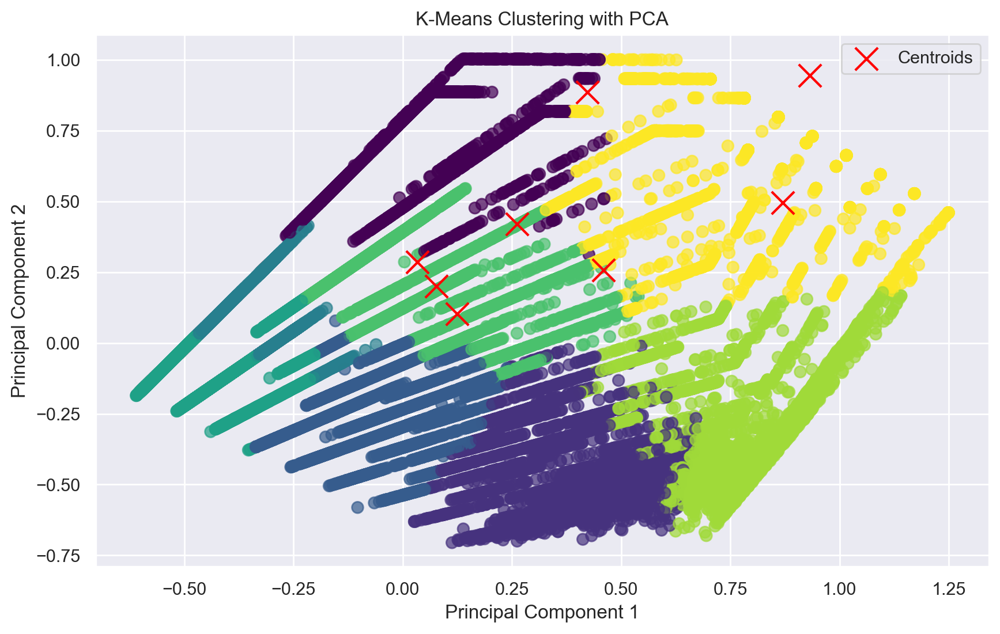

In [1615]:

# Perform PCA to reduce the dimensions to 2D
pca = PCA(n_components=2)
pca_features = pca.fit_transform(df[value_based_features])

# Predict clusters
clusters = kmclust.predict(df[value_based_features])

# Create a scatter plot of the clusters
plt.figure(figsize=(10, 6))
plt.scatter(pca_features[:, 0], pca_features[:, 1], c=clusters, cmap='viridis', s=50, alpha=0.7)
plt.scatter(kmclust.cluster_centers_[:, 0], kmclust.cluster_centers_[:, 1], 
            c='red', marker='x', s=200, label='Centroids')
plt.title('K-Means Clustering with PCA')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend()
plt.show()

In [1616]:
# Different initialization method and provide more n_init
kmclust = KMeans(n_clusters=2, 
                 init='k-means++', 
                 n_init=15, 
                 random_state=1
                 )
kmclust.fit(df[value_based_features])

KMeans(n_clusters=2, n_init=15, random_state=1)

In [1617]:
kmclust.predict(df[value_based_features])

array([0, 0, 0, ..., 0, 0, 0], dtype=int32)

In [1618]:
pd.DataFrame(kmclust.transform(df[value_based_features].head(10)))

,0,1
0,0.840657,1.040540
1,0.197490,0.897731
2,0.306568,0.996028
3,0.356524,0.791514
4,1.090603,1.108378
5,0.236500,0.864869
6,0.339526,1.018255
7,0.445384,0.798813
8,0.230220,0.819914
9,0.373753,0.791846


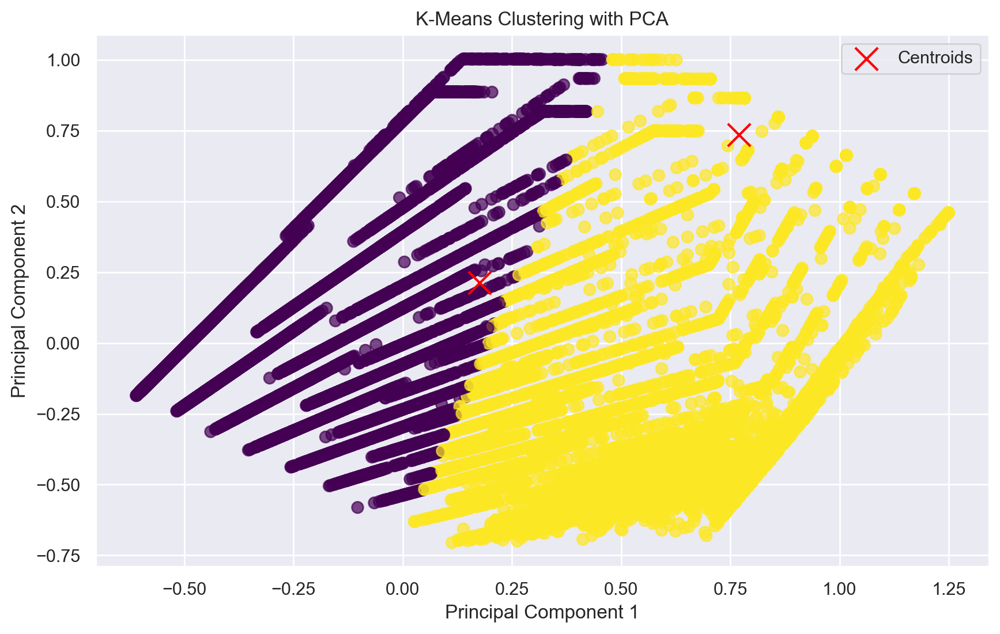

In [1619]:

# Perform PCA to reduce the dimensions to 2D
pca = PCA(n_components=2)
pca_features = pca.fit_transform(df[value_based_features])

# Predict clusters
clusters = kmclust.predict(df[value_based_features])

# Create a scatter plot of the clusters
plt.figure(figsize=(10, 6))
plt.scatter(pca_features[:, 0], pca_features[:, 1], c=clusters, cmap='viridis', s=50, alpha=0.7)
plt.scatter(kmclust.cluster_centers_[:, 0], kmclust.cluster_centers_[:, 1], 
            c='red', marker='x', s=200, label='Centroids')
plt.title('K-Means Clustering with PCA')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend()
plt.show()

## Defining the number of Clusters


In [1620]:
range_clusters = range(1, 9)

In [1621]:
inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(df[value_based_features])
    inertia.append(kmclust.inertia_)  # save the inertia of the given cluster solution

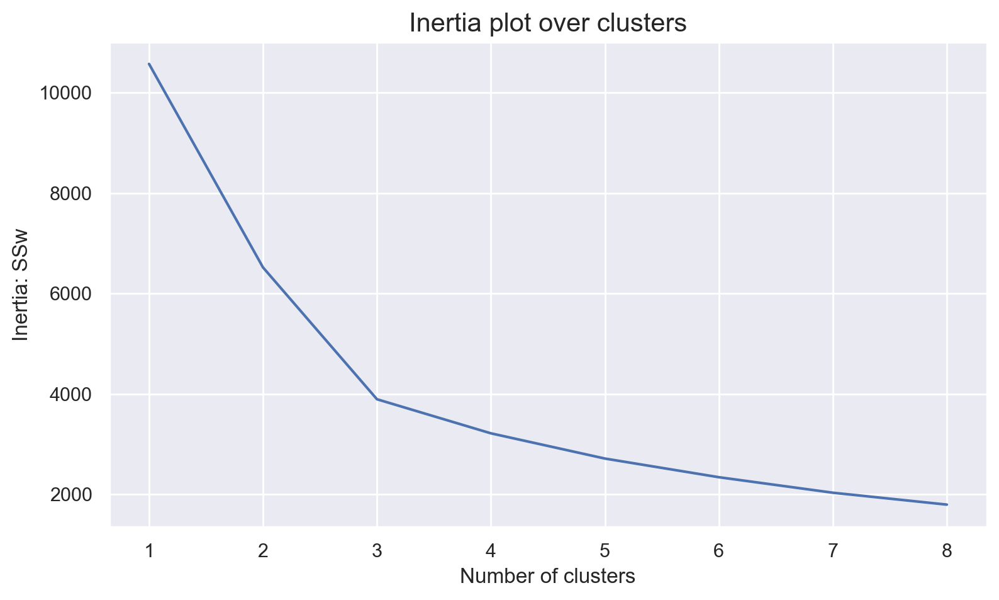

In [1622]:
# The inertia plot

fig, ax = plt.subplots(figsize=(9,5))

ax.plot(range_clusters, inertia)
ax.set_xticks(range_clusters)
ax.set_ylabel("Inertia: SSw")
ax.set_xlabel("Number of clusters")
ax.set_title("Inertia plot over clusters", size=15)

plt.show()

For n_clusters = 2, the average silhouette_score is : 0.42281253637237565
For n_clusters = 3, the average silhouette_score is : 0.4655358155251704
For n_clusters = 4, the average silhouette_score is : 0.3905256312397391
For n_clusters = 5, the average silhouette_score is : 0.38143684539779193
For n_clusters = 6, the average silhouette_score is : 0.3660623557757743
For n_clusters = 7, the average silhouette_score is : 0.3471048528872761
For n_clusters = 8, the average silhouette_score is : 0.3484929941853721


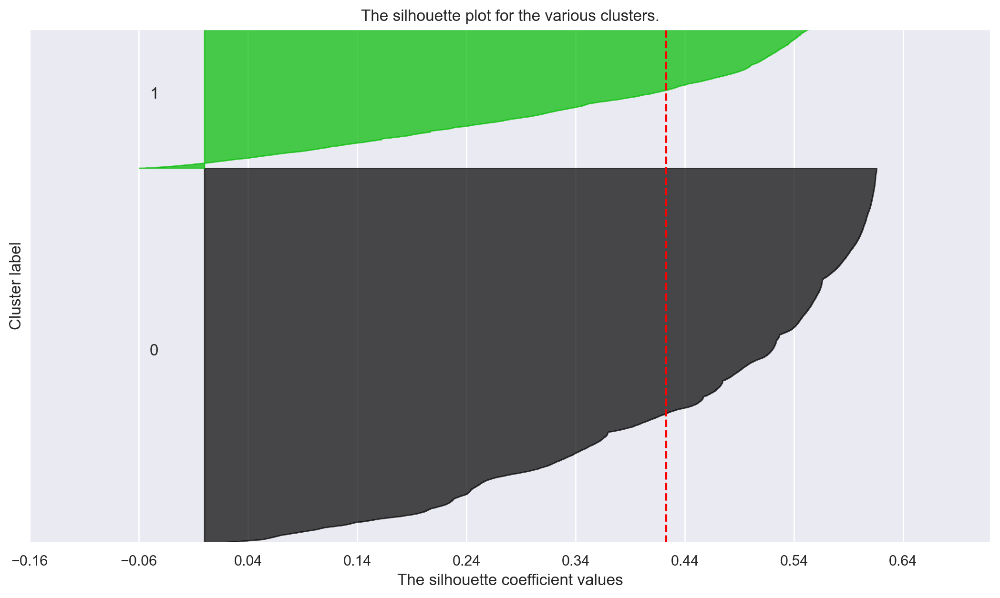

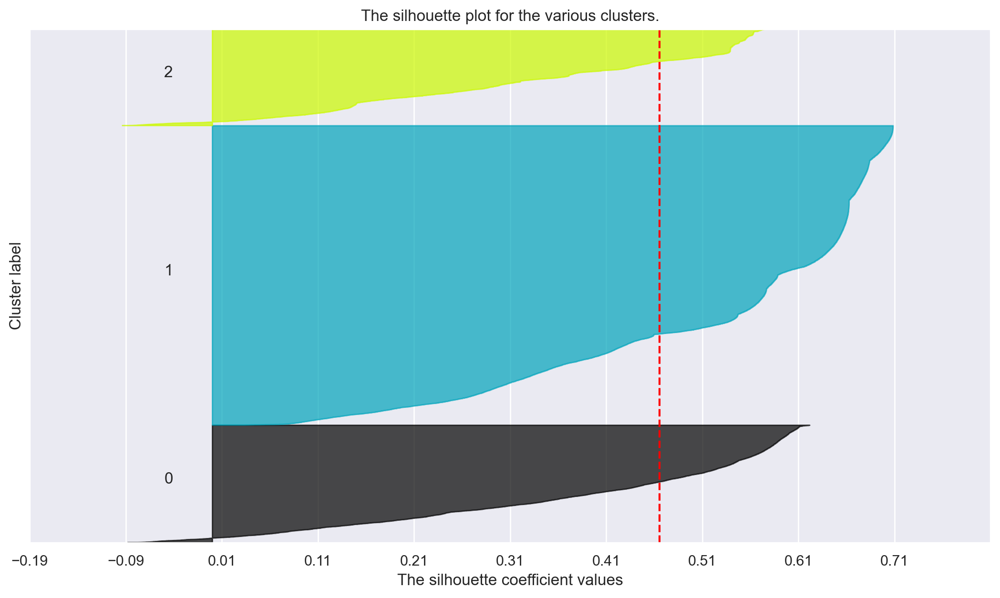

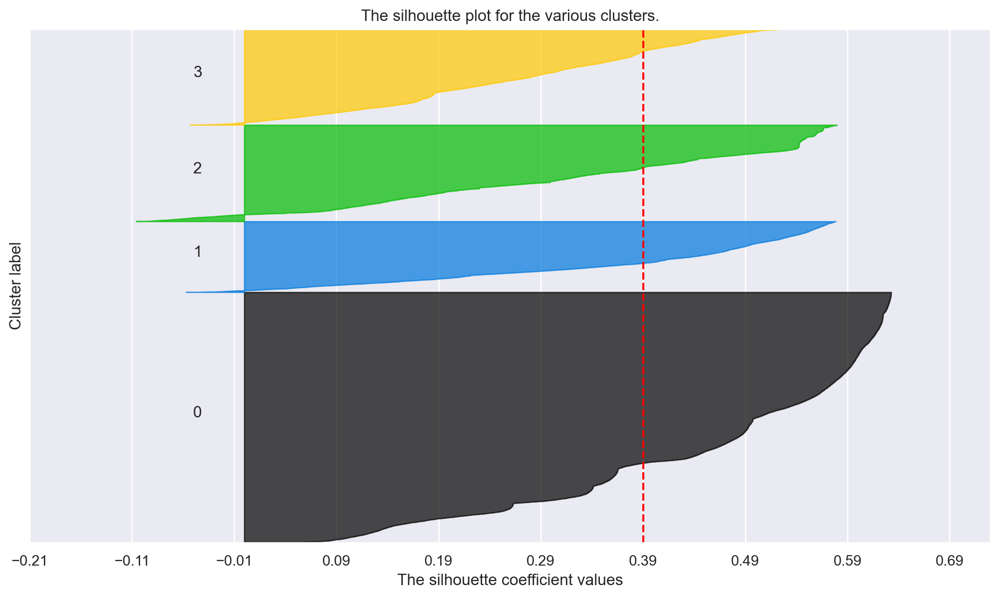

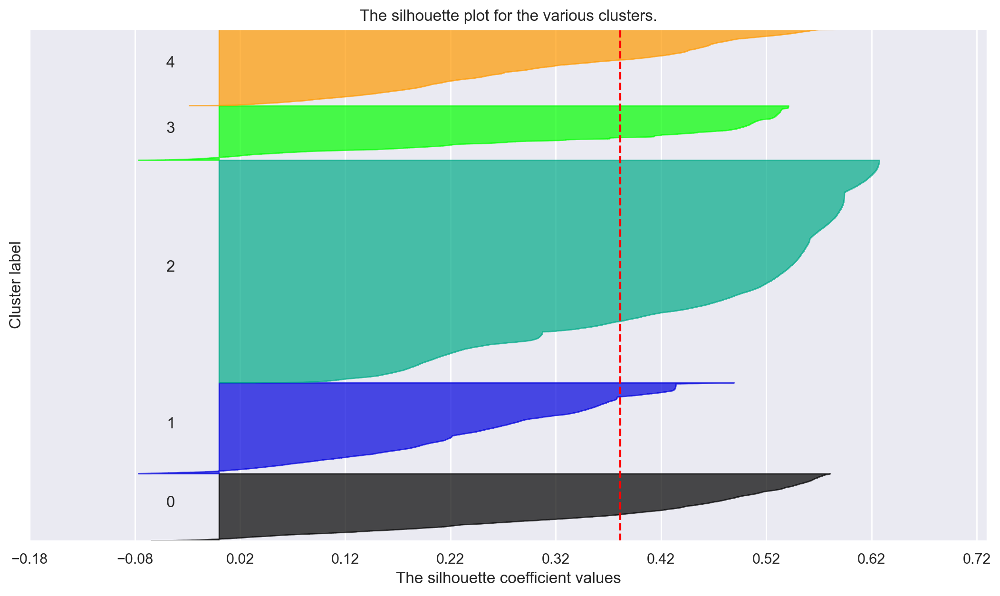

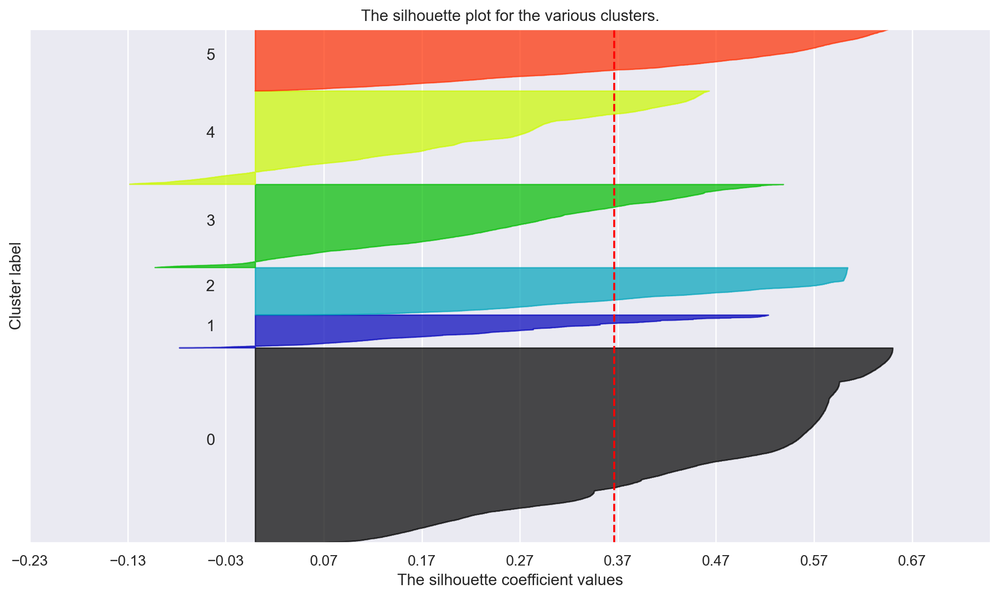

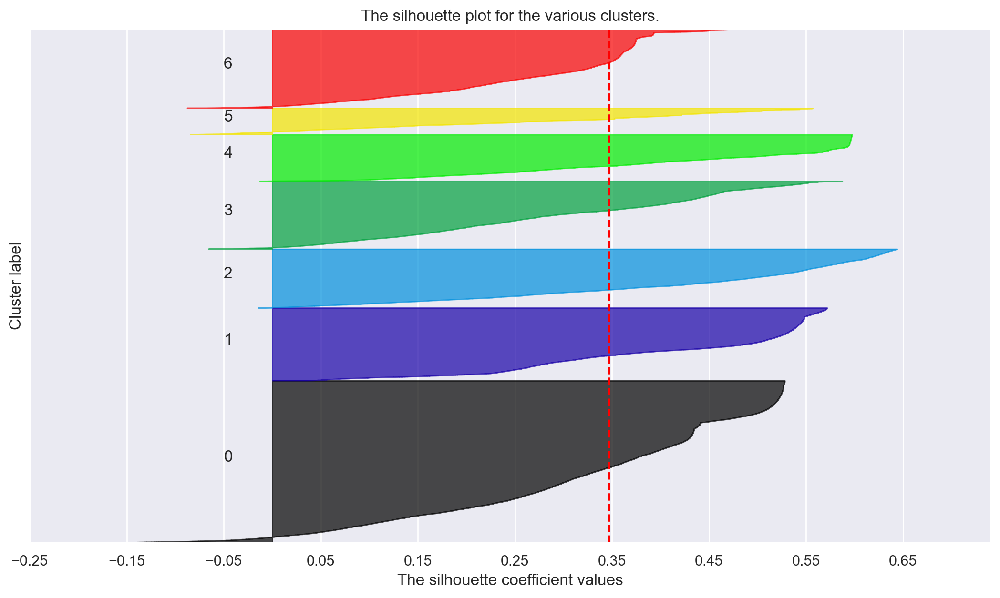

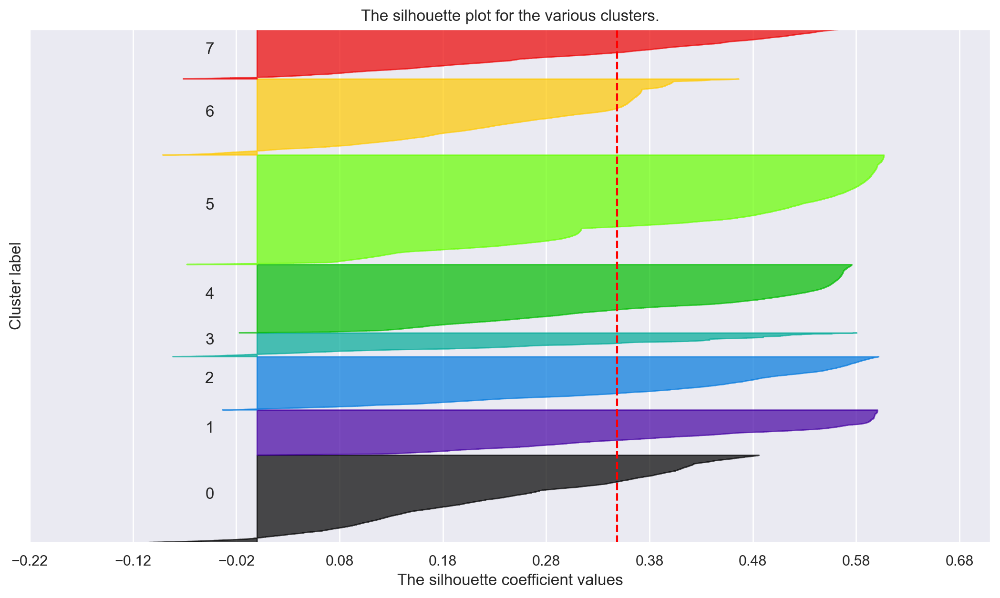

In [1623]:
# Storing average silhouette metric
avg_silhouette = []
for nclus in range_clusters:
    # Skip nclus == 1
    if nclus == 1:
        continue
    
    # Create a figure
    fig = plt.figure(figsize=(13, 7))

    # Initialize the KMeans object with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=50, random_state=4)
    cluster_labels = kmclust.fit_predict(df[value_based_features])

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(df[value_based_features], cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df[value_based_features], cluster_labels)

    y_lower = 10
    for i in range(nclus):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        
        # Get y_upper to demarcate silhouette y range size
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        # Filling the silhouette
        color = cm.nipy_spectral(float(i) / nclus)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    plt.title("The silhouette plot for the various clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    
    # The silhouette coefficient can range from -1, 1
    xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    plt.xlim([xmin, xmax])
    
    # The (nclus+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    plt.ylim([0, len(df[value_based_features]) + (nclus + 1) * 10])

    plt.yticks([])  # Clear the yaxis labels / ticks
    plt.xticks(np.arange(xmin, xmax, 0.1))

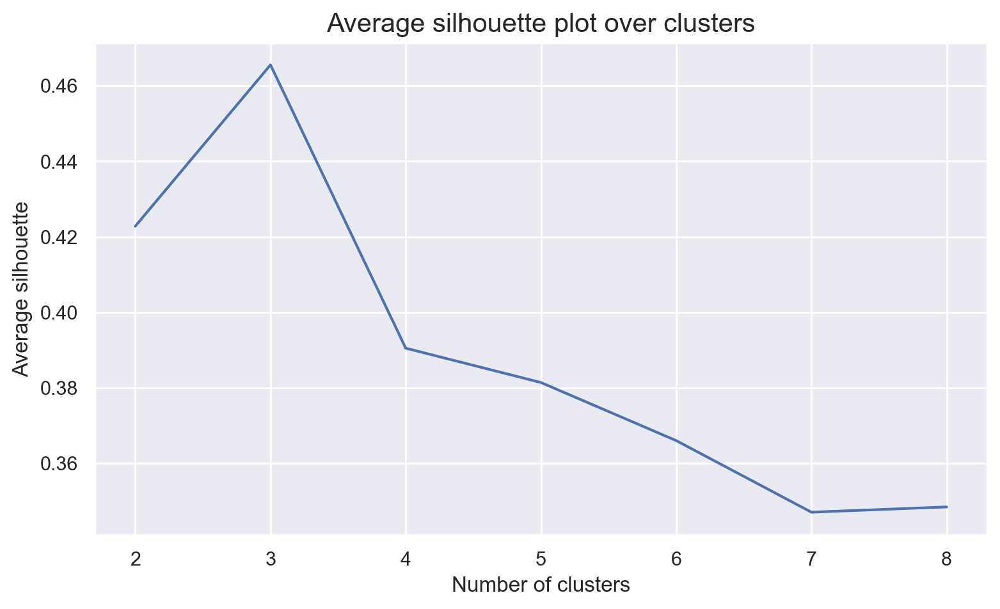

In [1624]:
# The average silhouette plot
# The inertia plot
plt.figure(figsize=(9,5))


#  Why range_clusters[1:] ? 
# Remember we skipped k=1 in the cell above

plt.plot(range_clusters[1:], ## Plot X-axis; 
         avg_silhouette)     ## Plot Y-axis

plt.ylabel("Average silhouette")
plt.xlabel("Number of clusters")
plt.title("Average silhouette plot over clusters", size=15)
plt.show()

In [1625]:
# final cluster solution
number_clusters = 3
kmclust = KMeans(n_clusters=number_clusters, init='k-means++', n_init=100, random_state=1)
km_labels = kmclust.fit_predict(df[value_based_features])
km_labels

array([1, 0, 0, ..., 0, 0, 0], dtype=int32)

In [1626]:
# Characterizing the final clusters
df_concat = pd.concat((df[value_based_features], pd.Series(km_labels, name='labels', index=df.index)), axis=1)
df_concat.groupby('labels').mean()

,Total_Orders_Per_Client,mnt,mnt_Per_Order,Items_Per_Order
labels,,,,
0,0.196354,0.181239,0.289342,0.071900
1,0.148017,0.442225,0.754033,0.676437
2,0.846019,0.720177,0.345462,0.251237


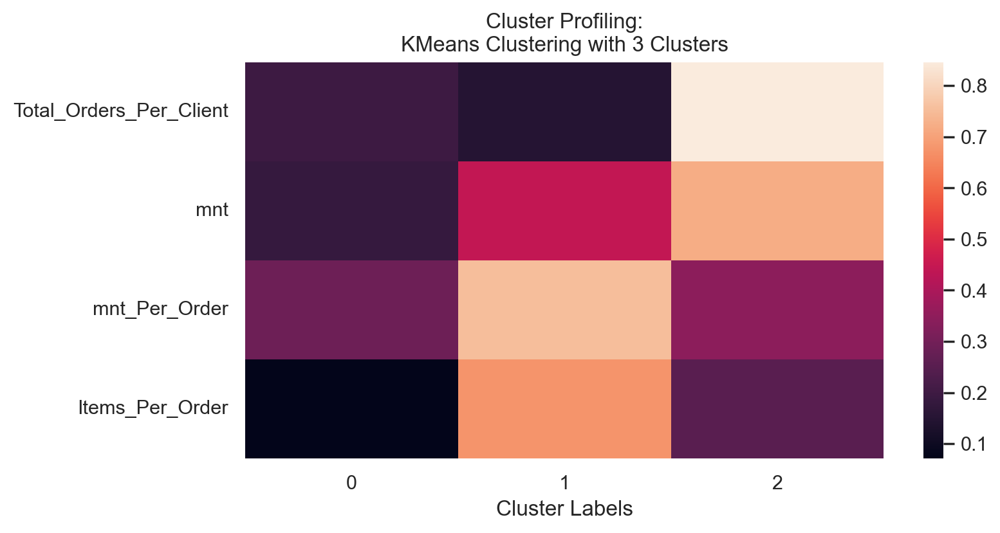

In [1627]:
fig, ax = plt.subplots(figsize=(8,4))

km_profile = df_concat.groupby('labels').mean().T

sns.heatmap(km_profile,
            # Remember how to improve this figure?
            ax=ax 
            )

ax.set_xlabel("Cluster Labels")
ax.set_title("Cluster Profiling:\nKMeans Clustering with 3 Clusters")
plt.show()

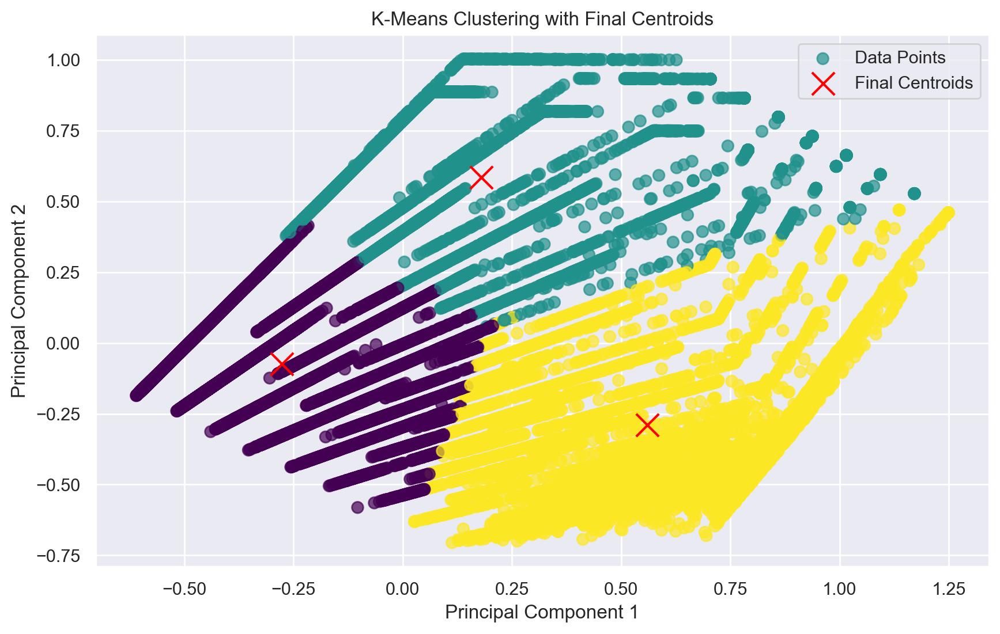

In [1628]:
# Reduce dimensions to 2D using PCA
pca = PCA(n_components=2)
pca_features = pca.fit_transform(df[value_based_features])

# Get the final centroids in PCA space
pca_centroids = pca.transform(kmclust.cluster_centers_)

# Predict clusters
clusters = kmclust.predict(df[value_based_features])

# Create a scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(pca_features[:, 0], pca_features[:, 1], c=clusters, cmap='viridis', s=50, alpha=0.7, label="Data Points")
plt.scatter(pca_centroids[:, 0], pca_centroids[:, 1], c='red', marker='x', s=200, label='Final Centroids')
plt.title('K-Means Clustering with Final Centroids')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend()
plt.show()

In [1629]:
# Hierarchical Clustering
hclust = AgglomerativeClustering(linkage='ward', metric='euclidean', n_clusters=5)
hc_labels = hclust.fit_predict(df[value_based_features]) # CODE HERE
hc_labels

array([3, 1, 1, ..., 1, 1, 1])

In [1630]:
# Characterizing the clusters

labels_series = pd.Series(hc_labels, 
                          name='labels', 
                          index=df.index # WHY df.index ??
                          ) 

df_concat = pd.concat([df, labels_series],axis=1)

df_concat[value_based_features+['labels']].groupby('labels').mean()

,Total_Orders_Per_Client,mnt,mnt_Per_Order,Items_Per_Order
labels,,,,
0,0.350767,0.594085,0.632055,0.433661
1,0.060344,0.123659,0.329268,0.000000
2,0.914523,0.718374,0.292089,0.207665
3,0.035620,0.294019,0.780773,0.829232
4,0.345776,0.213537,0.214641,0.133654


In [1631]:
# NUMPY solution:

# x_i       : X = df.values     : data
# x_bar     : X.mean(axis=0)    : centroid of data
# x_k       : X[hc_labels==k]   : points of cluster k
# x_bar_k   : X_k.mean(axis=0)  : centroid of cluster k
# n_k       : X_k.shape[0]

X = df[value_based_features].values

# Computing SST
sst = np.sum(np.square(X - X.mean(axis=0)), axis=0)

# Computing SSW
ssw_iter = []                   # Outer summation
for i in np.unique(hc_labels):  # Loop for inner summation
    X_k = X[hc_labels == i]     # Data points belonging to cluster k
    inner_sum = np.sum(np.square(X_k - X_k.mean(axis=0)), axis=0)
    ssw_iter.append(inner_sum)  
ssw = np.sum(ssw_iter, axis=0)  # Outer summation

# Computing SSB
ssb_iter = []
for i in np.unique(hc_labels):  # Loop for summation
    X_k = X[hc_labels == i]     # Data points belonging to cluster k
    ssb_iter.append(X_k.shape[0] * np.square(X_k.mean(axis=0) - X.mean(axis=0)))

ssb = np.sum(ssb_iter, axis=0)

# Verifying the formula
np.round(sst) == np.round((ssw + ssb))

array([ True,  True,  True,  True])

In [1632]:
# SSt

x_i = df_concat[value_based_features]
x_mean = df_concat[value_based_features].mean()

sst_sum = np.sum(np.sum(np.square(x_i - x_mean), axis=0), axis=0)
sst_sum

10570.491197794301

In [1633]:
# SSb

ssb_sum = 0
x_mean = df_concat[value_based_features].mean()

for i in df_concat['labels'].unique():
    df_k = df_concat.loc[df_concat['labels']==i, value_based_features]
    n_k = df_k.shape[0]
    x_k = df_k.mean()
    ssb_sum += (n_k * np.square((x_k - x_mean)))

ssb_sum = ssb_sum.sum()
ssb_sum

7485.0389520757035

In [1634]:
# SSw

ssw_sum = 0

for i in df_concat['labels'].unique():
    df_k = df_concat.loc[df_concat['labels']==i, value_based_features]
    x_k = df_k.mean()
    ssw_sum += (np.sum(np.square(df_k - x_k ), axis=0))


ssw_sum = np.sum(ssw_sum, axis=0)

ssw_sum

3085.4522457185976

In [1635]:
sst_sum == ssw_sum + ssb_sum

True

In [1636]:
# Let's wrap them into functions

def get_ss(df, feats):
    """
    Calculate the sum of squares (SS) for the given DataFrame.

    The sum of squares is computed as the sum of the variances of each column
    multiplied by the number of non-NA/null observations minus one.

    Parameters:
    df (pandas.DataFrame): The input DataFrame for which the sum of squares is to be calculated.
    feats (list of str): A list of feature column names to be used in the calculation.

    Returns:
    float: The sum of squares of the DataFrame.
    """
    df_ = df[feats]
    ss = np.sum(df_.var() * (df_.count() - 1))
    
    return ss 


def get_ssb(df, feats, label_col):
    """
    Calculate the between-group sum of squares (SSB) for the given DataFrame.
    The between-group sum of squares is computed as the sum of the squared differences
    between the mean of each group and the overall mean, weighted by the number of observations
    in each group.

    Parameters:
    df (pandas.DataFrame): The input DataFrame containing the data.
    feats (list of str): A list of feature column names to be used in the calculation.
    label_col (str): The name of the column in the DataFrame that contains the group labels.
    
    Returns
    float: The between-group sum of squares of the DataFrame.
    """
    
    ssb_i = 0
    for i in np.unique(df[label_col]):
        df_ = df.loc[:, feats]
        X_ = df_.values
        X_k = df_.loc[df[label_col] == i].values
        
        ssb_i += (X_k.shape[0] * (np.square(X_k.mean(axis=0) - X_.mean(axis=0))) )

    ssb = np.sum(ssb_i)
    

    return ssb


def get_ssw(df, feats, label_col):
    """
    Calculate the sum of squared within-cluster distances (SSW) for a given DataFrame.

    Parameters:
    df (pandas.DataFrame): The input DataFrame containing the data.
    feats (list of str): A list of feature column names to be used in the calculation.
    label_col (str): The name of the column containing cluster labels.

    Returns:
    float: The sum of squared within-cluster distances (SSW).
    """
    feats_label = feats+[label_col]

    df_k = df[feats_label].groupby(by=label_col).apply(lambda col: get_ss(col, feats), 
                                                       include_groups=False)

    return df_k.sum()

In [1637]:
# Let's wrap them into functions

def get_ss(df, feats):
    """
    Calculate the sum of squares (SS) for the given DataFrame.

    The sum of squares is computed as the sum of the variances of each column
    multiplied by the number of non-NA/null observations minus one.

    Parameters:
    df (pandas.DataFrame): The input DataFrame for which the sum of squares is to be calculated.
    feats (list of str): A list of feature column names to be used in the calculation.

    Returns:
    float: The sum of squares of the DataFrame.
    """
    df_ = df[feats]
    ss = np.sum(df_.var() * (df_.count() - 1))
    
    return ss 


def get_ssb(df, feats, label_col):
    """
    Calculate the between-group sum of squares (SSB) for the given DataFrame.
    The between-group sum of squares is computed as the sum of the squared differences
    between the mean of each group and the overall mean, weighted by the number of observations
    in each group.

    Parameters:
    df (pandas.DataFrame): The input DataFrame containing the data.
    feats (list of str): A list of feature column names to be used in the calculation.
    label_col (str): The name of the column in the DataFrame that contains the group labels.
    
    Returns
    float: The between-group sum of squares of the DataFrame.
    """ 
    
    ssb_i = 0
    for i in np.unique(df[label_col]):
        df_ = df.loc[:, feats]
        X_ = df_.values
        X_k = df_.loc[df[label_col] == i].values
        
        ssb_i += (X_k.shape[0] * (np.square(X_k.mean(axis=0) - X_.mean(axis=0))) )

    ssb = np.sum(ssb_i)
    

    return ssb


def get_ssw(df, feats, label_col):
    """
    Calculate the sum of squared within-cluster distances (SSW) for a given DataFrame.

    Parameters:
    df (pandas.DataFrame): The input DataFrame containing the data.
    feats (list of str): A list of feature column names to be used in the calculation.
    label_col (str): The name of the column containing cluster labels.

    Returns:
    float: The sum of squared within-cluster distances (SSW).
    """
    feats_label = feats+[label_col]

    df_k = df[feats_label].groupby(by=label_col).apply(lambda col: get_ss(col, feats), 
                                                       include_groups=False)

    return df_k.sum()

In [1638]:
df_sst_ = get_ss(df_concat, value_based_features)
df_ssb_ = get_ssb(df_concat, value_based_features, 'labels')
df_ssw_ = get_ssw(df_concat, value_based_features, 'labels')

print("SSb:  ", df_ssb_)
print("SSw:  ", df_ssw_)
print("SSt:  ", df_sst_)
print("SSt == SSb+SSw ? ", (df_sst_ == df_ssb_ + df_ssw_))

SSb:   7485.0389520757035
SSw:   3085.4522457185976
SSt:   10570.491197794301
SSt == SSb+SSw ?  True


In [1639]:
# 
def get_rsq(df, feats, label_col):
    """
    Calculate the R-squared value for a given DataFrame and features.

    Parameters:
    df (pd.DataFrame): The input DataFrame containing the data.
    feats (list): A list of feature column names to be used in the calculation.
    label_col (str): The name of the column containing the labels or cluster assignments.

    Returns:
    float: The R-squared value, representing the proportion of variance explained by the clustering.
    """

    df_sst_ = get_ss(df, feats)                 # get total sum of squares
    df_ssw_ = get_ssw(df, feats, label_col)     # get ss within
    df_ssb_ = df_sst_ - df_ssw_                 # get ss between

    # r2 = ssb/sst 
    return (df_ssb_/df_sst_)

In [1640]:
def get_r2_hc(df, link_method, max_nclus, min_nclus=1, dist="euclidean"):
    """This function computes the R2 for a set of cluster solutions given by the application of a hierarchical method.
    The R2 is a measure of the homogenity of a cluster solution. It is based on SSt = SSw + SSb and R2 = SSb/SSt. 
    
    Parameters:
    df (DataFrame): Dataset to apply clustering
    link_method (str): either "ward", "complete", "average", "single"
    max_nclus (int): maximum number of clusters to compare the methods
    min_nclus (int): minimum number of clusters to compare the methods. Defaults to 1.
    dist (str): distance to use to compute the clustering solution. Must be a valid distance. Defaults to "euclidean".
    
    Returns:
    ndarray: R2 values for the range of cluster solutions
    """
    
    r2 = []  # where we will store the R2 metrics for each cluster solution
    feats = df.columns.tolist()
    
    for i in range(min_nclus, max_nclus+1):  # iterate over desired ncluster range
        cluster = AgglomerativeClustering(n_clusters=i, metric=dist, linkage=link_method)
        
        #get cluster labels
        hclabels = cluster.fit_predict(df) 
        
        # concat df with labels
        df_concat = pd.concat([df, pd.Series(hclabels, name='labels', index=df.index)], axis=1)  
        
        
        # append the R2 of the given cluster solution
        r2.append(get_rsq(df_concat, feats, 'labels'))
        
    return np.array(r2)

In [1641]:
##########################################
# THIS TAKES A FEW MINUTES TO RUN!!
##########################################

hc_methods = ["ward", "complete", "average", "single"]
max_nclus = 10

r2_hc = np.vstack([ get_r2_hc(df[value_based_features], 
                              link, 
                              max_nclus=max_nclus, 
                              min_nclus=1, 
                              dist="euclidean") 
                              for link in hc_methods])

In [1642]:
r2_hc_methods = pd.DataFrame(r2_hc.T, index=range(1, max_nclus + 1), columns=hc_methods)

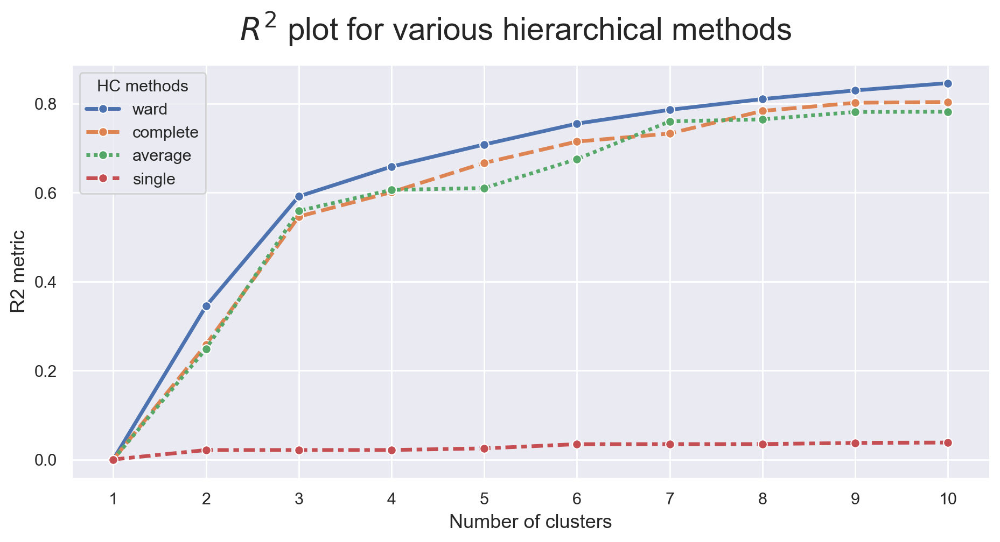

In [1643]:
sns.set()

# Plot data
fig = plt.figure(figsize=(11,5))
sns.lineplot(data=r2_hc_methods, linewidth=2.5, markers=["o"]*4)

# Finalize the plot
plt.legend(title="HC methods", title_fontsize=11)
plt.xticks(range(1, max_nclus + 1))
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("R2 metric", fontsize=13)

fig.suptitle("$R^2$ plot for various hierarchical methods", fontsize=21)

plt.show()

In [1644]:
# setting distance_threshold=0 and n_clusters=None ensures we compute the full tree
linkage = 'ward'
distance = 'euclidean'


hclust = AgglomerativeClustering(linkage=linkage, metric=distance, distance_threshold=0, n_clusters=None)
hclust.fit_predict(df[value_based_features])

array([17335, 31736, 31735, ...,     1,     2,     0])

In [1645]:
# create the counts of samples under each node (number of points being merged)
counts = np.zeros(hclust.children_.shape[0])
n_samples = len(hclust.labels_)

# hclust.children_ contains the observation ids that are being merged together
# At the i-th iteration, children[i][0] and children[i][1] are merged to form node n_samples + i
for i, merge in enumerate(hclust.children_):
    # track the number of observations in the current cluster being formed
    current_count = 0
    for child_idx in merge:
        if child_idx < n_samples:
            # If this is True, then we are merging an observation
            current_count += 1  # leaf node
        else:
            # Otherwise, we are merging a previously formed cluster
            current_count += counts[child_idx - n_samples]
    counts[i] = current_count

# the hclust.children_ is used to indicate the two points/clusters being merged (dendrogram's u-joins)
# the hclust.distances_ indicates the distance between the two points/clusters (height of the u-joins)
# the counts indicate the number of points being merged (dendrogram's x-axis)
linkage_matrix = np.column_stack(
    [hclust.children_, hclust.distances_, counts]
).astype(float)



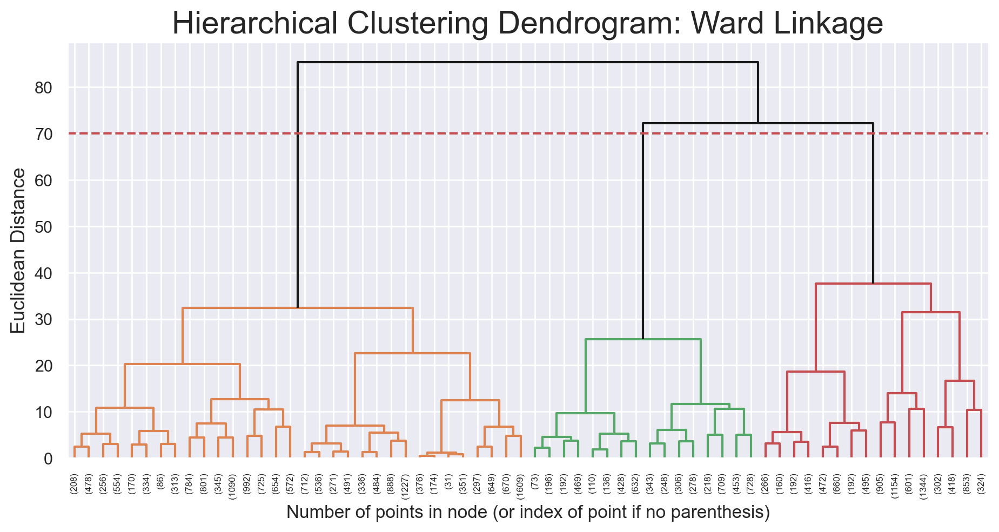

In [1646]:
# Plot the corresponding dendrogram
sns.set()
fig = plt.figure(figsize=(11,5))
# The Dendrogram parameters need to be tuned
y_threshold = 70
dendrogram(linkage_matrix, truncate_mode='level', p=5, color_threshold=y_threshold, above_threshold_color='k')
plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
plt.title(f'Hierarchical Clustering Dendrogram: {linkage.title()} Linkage', fontsize=21)
plt.xlabel('Number of points in node (or index of point if no parenthesis)')
plt.ylabel(f'{distance.title()} Distance', fontsize=13)
plt.show()

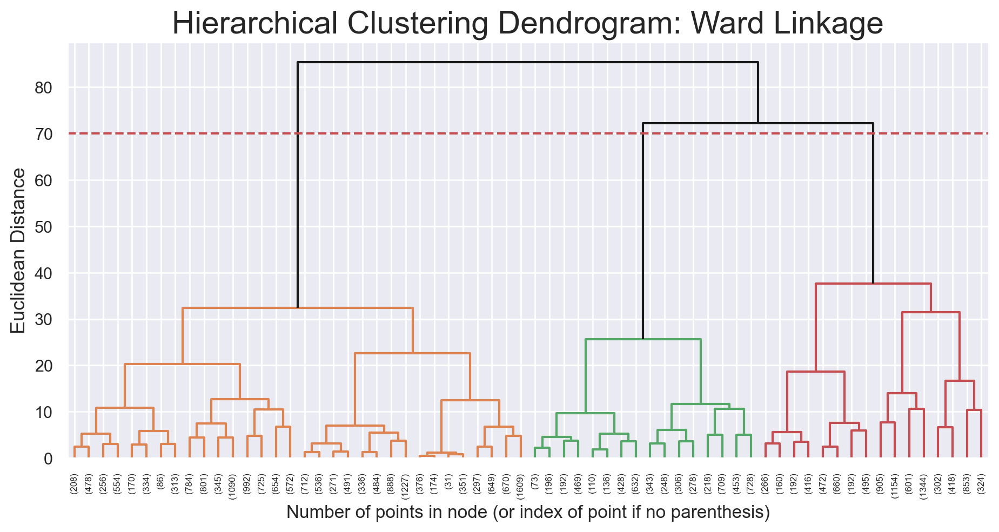

In [1647]:
##########################################
# Visualize the Dendrogram with y_threshold = 75
##########################################

# Plot the corresponding dendrogram
sns.set()
fig = plt.figure(figsize=(11,5))
# The Dendrogram parameters need to be tuned
y_threshold = 70
dendrogram(linkage_matrix, truncate_mode='level', p=5, color_threshold=y_threshold, above_threshold_color='k')
plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
plt.title(f'Hierarchical Clustering Dendrogram: {linkage.title()} Linkage', fontsize=21)
plt.xlabel('Number of points in node (or index of point if no parenthesis)')
plt.ylabel(f'{distance.title()} Distance', fontsize=13)
plt.show()

In [1648]:
linkage = 'ward'
distance = 'euclidean'

In [1649]:
# 4 cluster solution
n_clusters = 4

hc4_clust = AgglomerativeClustering(linkage=linkage, metric=distance, n_clusters=n_clusters)
hc4_labels = hc4_clust.fit_predict(df[value_based_features])

In [1650]:
# Characterizing the 4 clusters
df_concat = pd.concat([df[value_based_features], 
                       pd.Series(hc4_labels, 
                                 name='labels', 
                                 index=df.index)], 
                    axis=1)

df_concat.groupby('labels').mean()

,Total_Orders_Per_Client,mnt,mnt_Per_Order,Items_Per_Order
labels,,,,
0,0.197012,0.166694,0.274383,0.063995
1,0.350767,0.594085,0.632055,0.433661
2,0.914523,0.718374,0.292089,0.207665
3,0.035620,0.294019,0.780773,0.829232


In [1651]:
# 5 cluster solution
n_clusters=5

hc5_clust = AgglomerativeClustering(linkage=linkage, metric=distance, n_clusters=n_clusters)
hc5_labels = hc5_clust.fit_predict(df[value_based_features])

In [1652]:
# Characterizing the 5 clusters
df_concat = pd.concat([df[value_based_features], 
                       pd.Series(hc5_labels, 
                                 name='labels', 
                                 index=df.index)], 
                    axis=1)

df_concat.groupby('labels').mean()

,Total_Orders_Per_Client,mnt,mnt_Per_Order,Items_Per_Order
labels,,,,
0,0.350767,0.594085,0.632055,0.433661
1,0.060344,0.123659,0.329268,0.000000
2,0.914523,0.718374,0.292089,0.207665
3,0.035620,0.294019,0.780773,0.829232
4,0.345776,0.213537,0.214641,0.133654


In [1653]:
## See crosstab of 4 vs 5
## What does this mean?

pd.crosstab(
    pd.Series(hc5_labels, name='hc5_labels', index=df.index),
    pd.Series(hc4_labels, name='hc4_labels', index=df.index),
    )

hc4_labels,0,1,2,3
hc5_labels,,,,
0,0,5901,0,0
1,9102,0,0,0
2,0,0,5519,0
3,0,0,0,2853
4,8362,0,0,0


In [1654]:
# final cluster solution
linkage = "ward"
distance = "euclidean"
n_clusters = 4

hclust = AgglomerativeClustering(linkage=linkage, metric=distance, n_clusters=n_clusters)

hc_labels = hclust.fit_predict(df[value_based_features])

In [1655]:
# Characterizing the final clusters

df_concat = pd.concat([
    df[value_based_features], 
    pd.Series(hc_labels, name='labels', index=df.index)
    ], 
    axis=1)
df_concat.groupby('labels').mean()

,Total_Orders_Per_Client,mnt,mnt_Per_Order,Items_Per_Order
labels,,,,
0,0.197012,0.166694,0.274383,0.063995
1,0.350767,0.594085,0.632055,0.433661
2,0.914523,0.718374,0.292089,0.207665
3,0.035620,0.294019,0.780773,0.829232


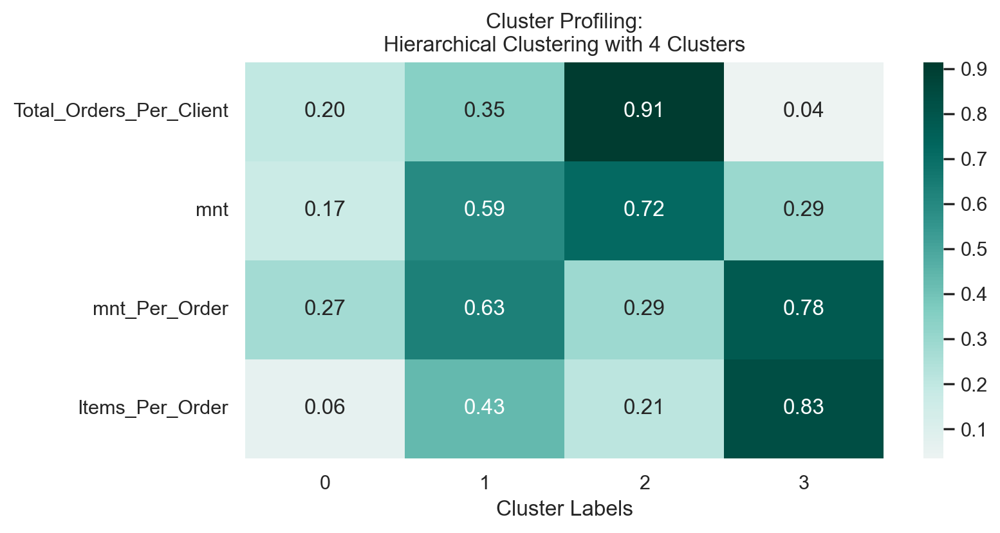

In [1656]:
fig, ax = plt.subplots(figsize=(8,4))

hc_profile = df_concat.groupby('labels').mean().T

sns.heatmap(hc_profile,
            center=0, annot=True, cmap="BrBG", fmt=".2f",
            ax=ax 
            )

ax.set_xlabel("Cluster Labels")
ax.set_title("Cluster Profiling:\nHierarchical Clustering with 4 Clusters")
plt.show()

In [1657]:
hc_profile = df_concat.groupby('labels').mean().T

df_means = df_concat[value_based_features].mean()
df_means.name="Data"


pd.concat([hc_profile, 
           df_means], axis=1
)

,0,1,2,3,Data
Total_Orders_Per_Client,0.197012,0.350767,0.914523,0.035620,0.335866
mnt,0.166694,0.594085,0.718374,0.294019,0.353543
mnt_Per_Order,0.274383,0.632055,0.292089,0.780773,0.389488
Items_Per_Order,0.063995,0.433661,0.207665,0.829232,0.226504


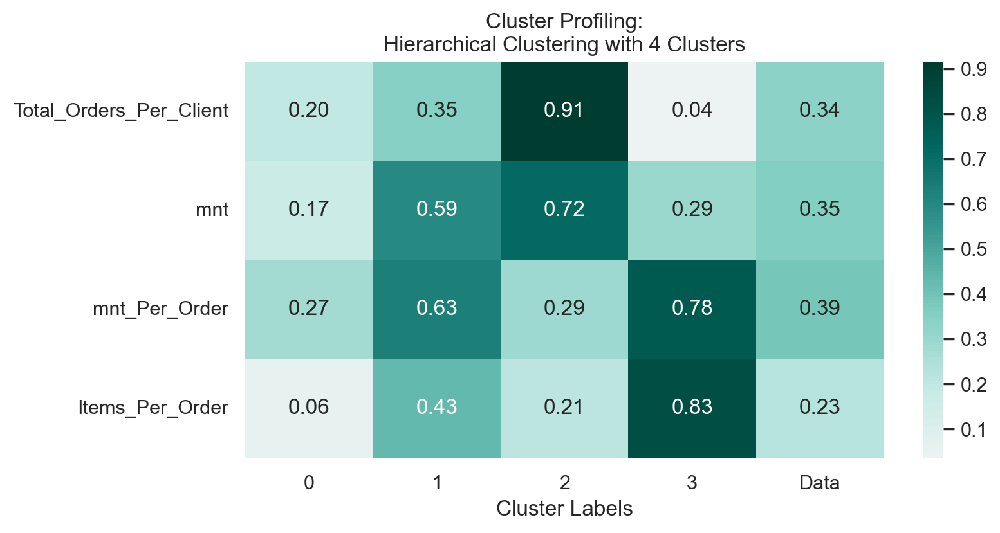

In [1658]:
fig, ax = plt.subplots(figsize=(8,4))

hc_profile = df_concat.groupby('labels').mean().T

df_means = df_concat[value_based_features].mean()
df_means.name="Data"


hc_profile = pd.concat([hc_profile, 
                        df_means], axis=1
                        )

sns.heatmap(hc_profile,
            center=0, annot=True, cmap="BrBG", fmt=".2f",
            ax=ax 
            )

ax.set_xlabel("Cluster Labels")
ax.set_title("Cluster Profiling:\nHierarchical Clustering with 4 Clusters")
plt.show()

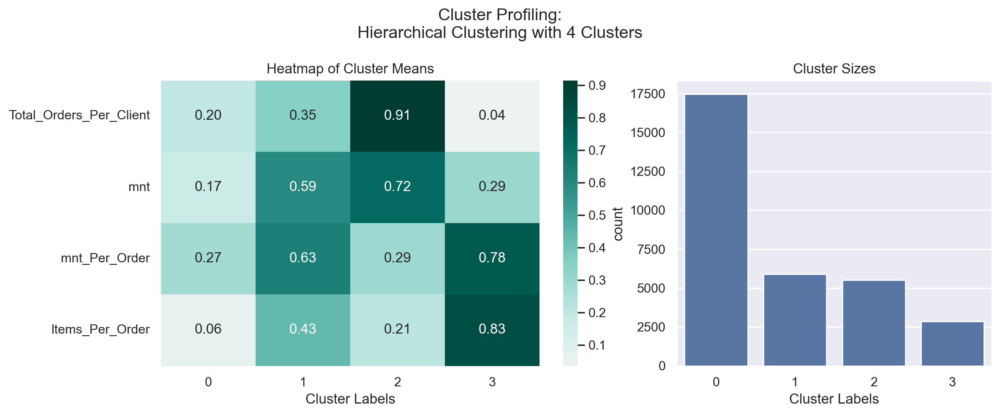

In [1659]:
label_counts = None 

fig, axes = plt.subplots(1,2, figsize=(12,5), width_ratios=[.6,.4], tight_layout=True)

hc_profile = df_concat.groupby('labels').mean().T

sns.heatmap(hc_profile,
            center=0, annot=True, cmap="BrBG", fmt=".2f",
            ax=axes[0]
            )
axes[0].set_xlabel("Cluster Labels")
axes[0].set_title("Heatmap of Cluster Means")


sns.countplot(df_concat, x='labels', ax=axes[1])
axes[1].set_title("Cluster Sizes")
axes[1].set_xlabel("Cluster Labels")

fig.suptitle("Cluster Profiling:\nHierarchical Clustering with 4 Clusters")
plt.show()

# behavior based features

# Cuisine preferences

In [1660]:
behavior_cuisines_features = [
    # Replace with the exact names found in df.columns
    'CUI_American', 
    'CUI_Asian', 
    'CUI_Beverages', 
    'CUI_Cafe', 
    'CUI_Chicken_Dishes', 
    'CUI_Chinese', 
    'CUI_Desserts', 
    'CUI_Healthy', 
    'CUI_Indian', 
    'CUI_Italian', 
    'CUI_Japanese', 
    'CUI_Noodle_Dishes', 
    'CUI_OTHER', 
    'CUI_Street_Food/Snacks', 
    'CUI_Thai', 
    'CUI_diversity'
]

# Times Based features

In [1661]:
time_based_features = [
    'Orders_Morning', 'Orders_Afternoon', 'Orders_Evening', 
    'HR_0', 'HR_1', 'HR_2', 'HR_3', 'HR_4', 'HR_5', 'HR_6', 'HR_7', 'HR_8', 
    'HR_9', 'HR_10', 'HR_11', 'HR_12', 'HR_13', 'HR_14', 'HR_15', 'HR_16', 
    'HR_17', 'HR_18', 'HR_19', 'HR_20', 'HR_21', 'HR_22', 'HR_23', 
    'DOW_0', 'DOW_1', 'DOW_2', 'DOW_3', 'DOW_4', 'DOW_5', 'DOW_6'
]

# Demographic segmentation features

In [1662]:
demographic_features = [
    'customer_age', 
    'customer_region', 
    'is_chain', 
    'vendor_count'
]

# Engagement features

In [1663]:
engagement_features = [
    'frq', 
    'rcn', 
    'Loyalty', 
    'Recency_Score', 
    'Frequency_Score', 
    'Monetary_Score'
]


<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=d80cf8a3-0707-4865-ba36-9382bf28b032' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>